# Определение стоимости автомобилей

Сервис по продаже автомобилей с пробегом «Не бит, не крашен» разрабатывает приложение для привлечения новых клиентов. В нём можно быстро узнать рыночную стоимость своего автомобиля. В распоряжении исторические данные: технические характеристики, комплектации и цены автомобилей. 

Цель — построить модель для определения стоимости.

Заказчику важны:

- качество предсказания;
- скорость предсказания;
- время обучения.

## Установка и импорт библиотек, определение констант

In [1]:
# Стандартные библиотеки Python
import os
import sys
import warnings
from io import StringIO
from itertools import combinations
from math import pi
import time

# Сторонние библиотеки для работы с данными
import numpy as np
import pandas as pd

# Визуализация
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import seaborn as sns
import plotly.express as px
from plotly.colors import qualitative
import missingno as msno

# Машинное обучение - scikit-learn
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.linear_model import Lasso, LinearRegression, Ridge
from sklearn.metrics import (
    make_scorer,
    mean_absolute_error,
    mean_squared_error,
    r2_score
)
from sklearn.model_selection import (
    KFold,
    RandomizedSearchCV,
    StratifiedKFold,
    train_test_split,
)
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import (
    MinMaxScaler,
    OneHotEncoder,
    OrdinalEncoder,
    StandardScaler,
)
from sklearn.tree import DecisionTreeRegressor

# Специализированные библиотеки ML
import lightgbm as lgb
from category_encoders import CatBoostEncoder

# Статистический анализ
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Анализ корреляций
from phik import binning, significance_matrix, phik_matrix
from phik.binning import bin_data
from phik.report import plot_correlation_matrix

# Jupyter-специфичные утилиты
from IPython.display import display, HTML

# Настройка предупреждений
warnings.filterwarnings("ignore", category=FutureWarning)

In [2]:
# Собственные функции и класс
from utils import (
    FeatureUnionWithCatBoost,
    main,
    plot_sunburst_distribution,
    plot_distribution_with_boxplot,
    plot_features_by_class,
    plot_categorical_distributions,
    plot_violin_combinations,
    plot_distributions,
    phik_correlation_matrix,
    vif,
    analyze_residuals,
    plot_residuals,
    plot_feature_importance
)

In [3]:
# константа RANDOM_STATE
RANDOM_STATE = 42

# константа TEST_SIZE
TEST_SIZE = 0.25

## Загрузка данных

In [4]:
try:
    # Пробуем основной путь
    df = pd.read_csv('/datasets/autos.csv')

except FileNotFoundError:
    print("⚠️ Файл не найден в /datasets/, пробуем из текущей директории...")
    try:
        df = pd.read_csv('autos.csv')
    except FileNotFoundError:
        print("❌ Ошибка: Файл 'autos.csv' не найден ни в /datasets/, ни в текущей директории.")
        sys.exit(1)

except Exception as e:
    print(f"❌ Критическая ошибка при загрузке данных: {str(e)}")
    sys.exit(1)

# Информация о загруженных данных
print("\n✅ Данные успешно загружены:")
print(f"- Набор данных: {df.shape[0]} строк, {df.shape[1]} столбцов")

⚠️ Файл не найден в /datasets/, пробуем из текущей директории...

✅ Данные успешно загружены:
- Набор данных: 354369 строк, 16 столбцов


In [5]:
# сделаем копию датафрейма
autos_df = df.copy()

In [6]:
# получим длину датафрейма
total_count = len(autos_df)

In [7]:
# выводим три последних строки
display(autos_df.tail(3))

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen
354366,2016-03-05 19:56:21,1199,convertible,2000,auto,101,fortwo,125000,3,petrol,smart,no,2016-03-05 00:00:00,0,26135,2016-03-11 18:17:12
354367,2016-03-19 18:57:12,9200,bus,1996,manual,102,transporter,150000,3,gasoline,volkswagen,no,2016-03-19 00:00:00,0,87439,2016-04-07 07:15:26
354368,2016-03-20 19:41:08,3400,wagon,2002,manual,100,golf,150000,6,gasoline,volkswagen,NaN,2016-03-20 00:00:00,0,40764,2016-03-24 12:45:21


**Промежуточный вывод**

Все данные из описания присутствуют, загрузка прошла успешно. Данные готовы к предобработке.

## Предобработка данных

Проверим данные на наличие пропусков и дубликатов. Выявим неинформативные признаки. Узнаем, корректный ли тип данных у оставшихся признаков.

### Обработка пропусков

In [8]:
# выведем общую информацию
autos_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 354369 entries, 0 to 354368
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   DateCrawled        354369 non-null  object
 1   Price              354369 non-null  int64 
 2   VehicleType        316879 non-null  object
 3   RegistrationYear   354369 non-null  int64 
 4   Gearbox            334536 non-null  object
 5   Power              354369 non-null  int64 
 6   Model              334664 non-null  object
 7   Kilometer          354369 non-null  int64 
 8   RegistrationMonth  354369 non-null  int64 
 9   FuelType           321474 non-null  object
 10  Brand              354369 non-null  object
 11  Repaired           283215 non-null  object
 12  DateCreated        354369 non-null  object
 13  NumberOfPictures   354369 non-null  int64 
 14  PostalCode         354369 non-null  int64 
 15  LastSeen           354369 non-null  object
dtypes: int64(7), object(

Мы наблюдаем пропуски в ряде признаков, проанализируем их с помощью библиотеки `missingno`. Перед этим обратим внимание на тот факт, что в случае пропуска в модели машины невозможно предсказать ее стоимость. Поэтому рассмотрим записи с пропусками в данном признаке на удаление — их не должно быть более 20%, учитывая большой объем данных (порядка 350 тыс.).

In [9]:
# Считаем долю пропусков в признаке Model
missing_rate = autos_df['Model'].isna().sum() / total_count

# Выводим результат
print(f'Доля пропусков в признаке Model — {missing_rate:.3%}')

Доля пропусков в признаке Model — 5.561%


Рассмотрим также уникальные значения в признаке `Model`

In [10]:
autos_df['Model'].unique()

array(['golf', nan, 'grand', 'fabia', '3er', '2_reihe', 'other', 'c_max',
       '3_reihe', 'passat', 'navara', 'ka', 'polo', 'twingo', 'a_klasse',
       'scirocco', '5er', 'meriva', 'arosa', 'c4', 'civic', 'transporter',
       'punto', 'e_klasse', 'clio', 'kadett', 'kangoo', 'corsa', 'one',
       'fortwo', '1er', 'b_klasse', 'signum', 'astra', 'a8', 'jetta',
       'fiesta', 'c_klasse', 'micra', 'vito', 'sprinter', '156', 'escort',
       'forester', 'xc_reihe', 'scenic', 'a4', 'a1', 'insignia', 'combo',
       'focus', 'tt', 'a6', 'jazz', 'omega', 'slk', '7er', '80', '147',
       '100', 'z_reihe', 'sportage', 'sorento', 'v40', 'ibiza', 'mustang',
       'eos', 'touran', 'getz', 'a3', 'almera', 'megane', 'lupo', 'r19',
       'zafira', 'caddy', 'mondeo', 'cordoba', 'colt', 'impreza',
       'vectra', 'berlingo', 'tiguan', 'i_reihe', 'espace', 'sharan',
       '6_reihe', 'panda', 'up', 'seicento', 'ceed', '5_reihe', 'yeti',
       'octavia', 'mii', 'rx_reihe', '6er', 'modus', 'fox'

Помимо названия моделей мы наблюдаем еще категорию `other`, что также можно отнести к пропуску. Рассчитаем и долю этой категории

In [11]:
# Считаем долю 'other' в признаке 'Model'
other_count = autos_df[autos_df['Model'] == 'other']['Model'].count()
other_ratio = (other_count / total_count)

# Выводим результат
print(f'Доля other в признаке Model — {other_ratio:.3%}')

Доля other в признаке Model — 6.891%


Пропусков в общей сумме меньше 13%, поэтому такие записи можно удалить без значительного влияния на предсказательную способность модели.

In [12]:
# удаление записей с пропусками в признаке Model
autos_df = autos_df.dropna(subset=['Model'])

# удаление записей с категорией other в признаке Model
autos_df = autos_df[autos_df['Model']!='other']

In [13]:
# проверим информацию о датафрейме
autos_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 310243 entries, 0 to 354368
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   DateCrawled        310243 non-null  object
 1   Price              310243 non-null  int64 
 2   VehicleType        281440 non-null  object
 3   RegistrationYear   310243 non-null  int64 
 4   Gearbox            295937 non-null  object
 5   Power              310243 non-null  int64 
 6   Model              310243 non-null  object
 7   Kilometer          310243 non-null  int64 
 8   RegistrationMonth  310243 non-null  int64 
 9   FuelType           286470 non-null  object
 10  Brand              310243 non-null  object
 11  Repaired           252401 non-null  object
 12  DateCreated        310243 non-null  object
 13  NumberOfPictures   310243 non-null  int64 
 14  PostalCode         310243 non-null  int64 
 15  LastSeen           310243 non-null  object
dtypes: int64(7), object(9)
me

Длина датафрейма уменьшилась на 13 %, а также в признаке `Model` теперь нет пропусков.

Продолжим анализ пропусков с помощью бибилотеки `missingno`

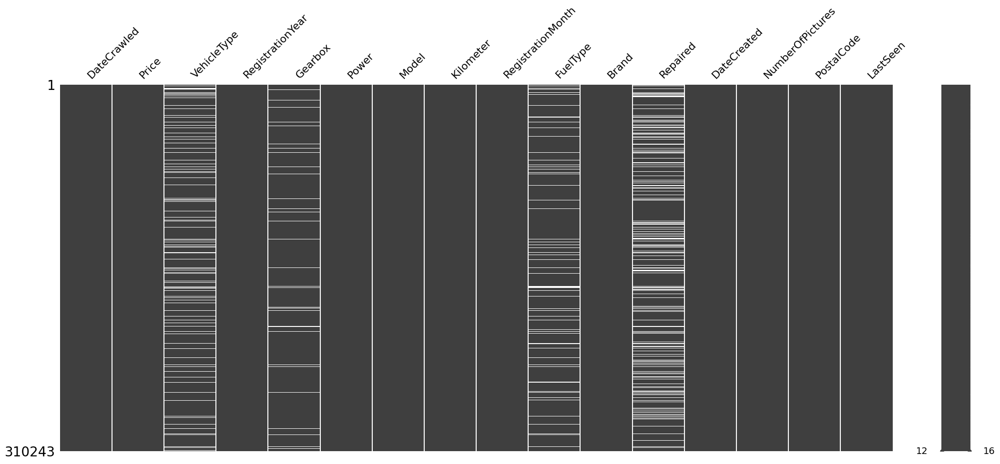

In [14]:
msno.matrix(autos_df);

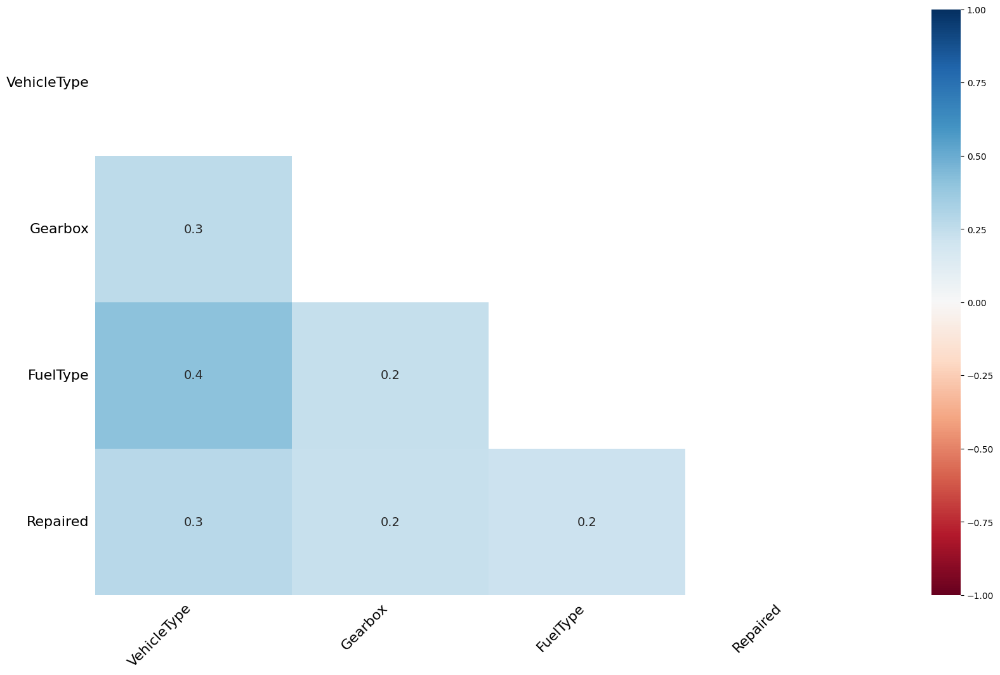

In [15]:
msno.heatmap(autos_df);

Мы наблюдаем некоторую корреляцию в пропусках между признаками от 0.2 до 0.4. Максимальная корреляция для пары `VehicleType` - `FuelType`. Косвено это может говорить о том, что тип авто влияет на тип топлива. Проверим есть ли преобладающие категории топлива среди типов авто.

In [16]:
# Создаем копию датафрейма
autos_df_copy = autos_df.copy()

# Заполняем пропуски
autos_df_copy['VehicleType'] = autos_df_copy['VehicleType'].fillna('unknown_vehicle')
autos_df_copy['Gearbox'] = autos_df_copy['Gearbox'].fillna('unknown_gearbox')
autos_df_copy['FuelType'] = autos_df_copy['FuelType'].fillna('unknown_fuel')
autos_df_copy['Repaired'] = autos_df_copy['Repaired'].fillna('unknown')

Уникальные значения в признаках:
VehicleType: ['bus' 'convertible' 'coupe' 'other' 'sedan' 'small' 'suv'
 'unknown_vehicle' 'wagon']
FuelType: ['gasoline' 'petrol' 'unknown_fuel' 'lpg' 'cng' 'other' 'hybrid'
 'electric']


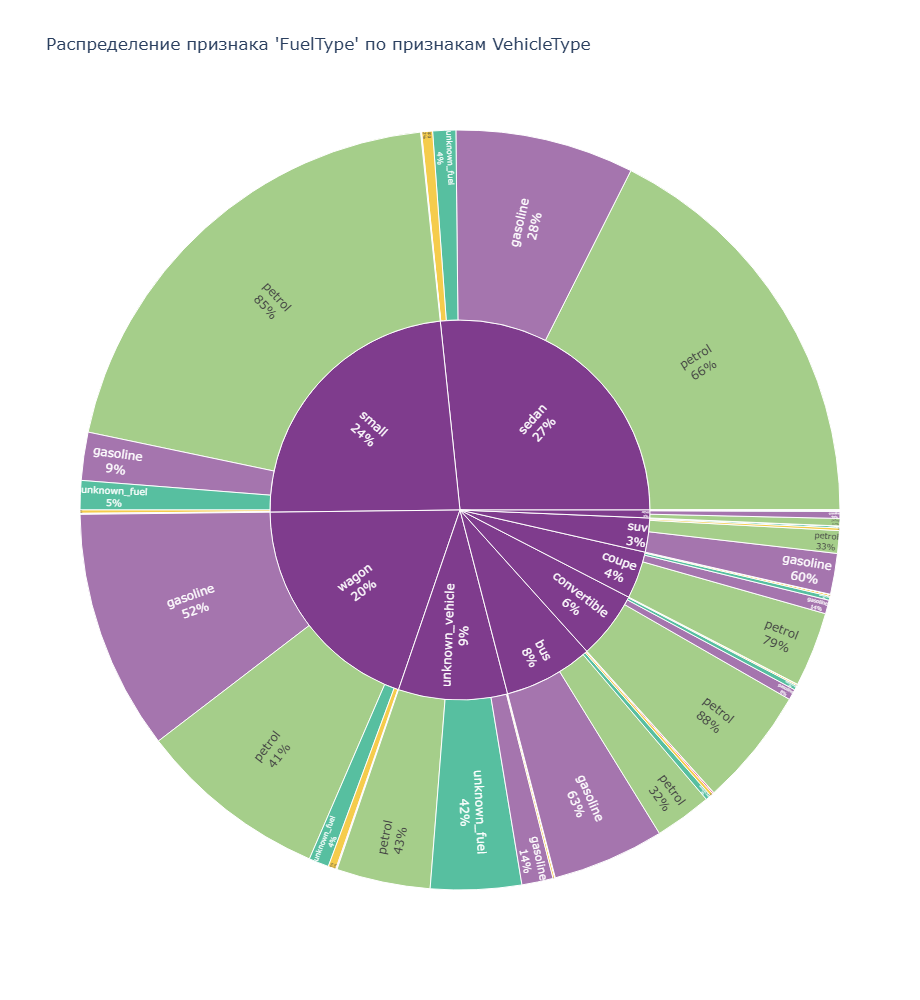

In [17]:
plot_sunburst_distribution(autos_df_copy, ['VehicleType'], 'FuelType')

Действительно для большинства типов авто есть значительно преобладающий тип топлива. Поэтому пропуски в типе топлива будем заполнять наиболее популярным для конкртеного типа авто.

По аналогии исследуем наиболее часто встречающиеся значения признаков `Gearbox` и `VehicleType` для моделей машин.

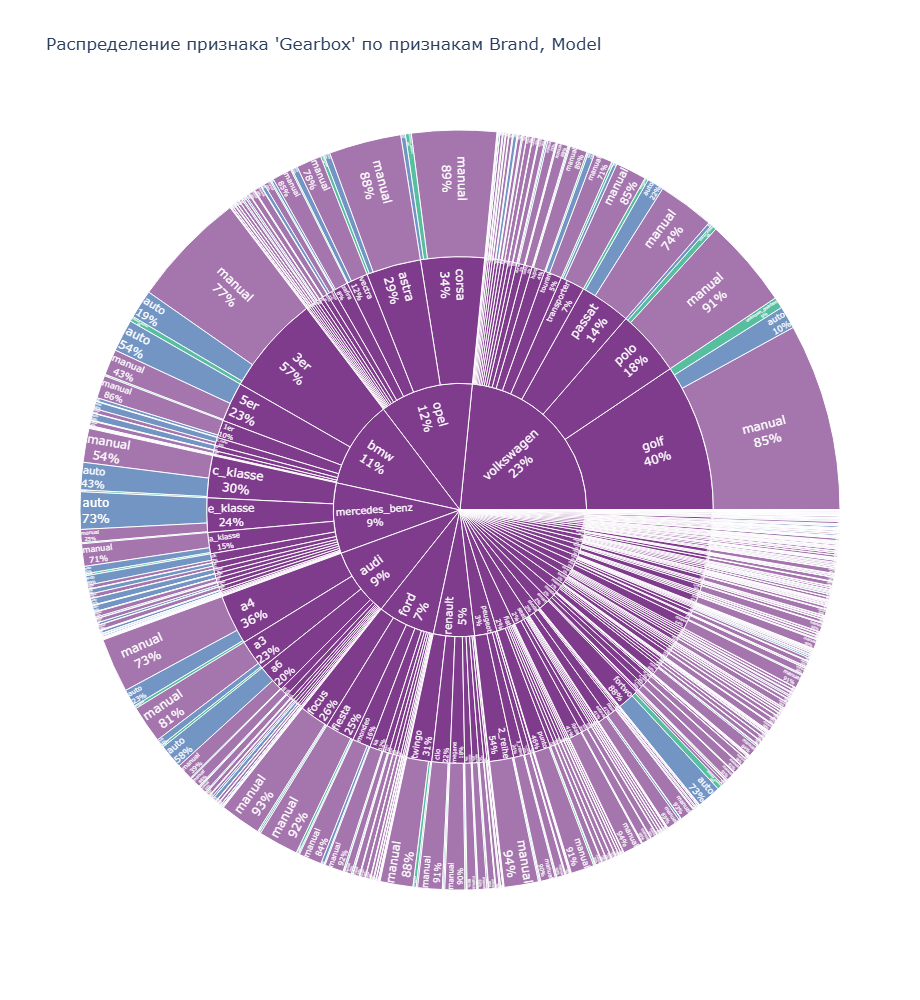

In [18]:
plot_sunburst_distribution(autos_df_copy, ['Brand', 'Model'], 'Gearbox', show_unique_values=False)

Мы наблюадем значительное преобладание определенного значения признака `Gearbox` для большинства моделей машин.

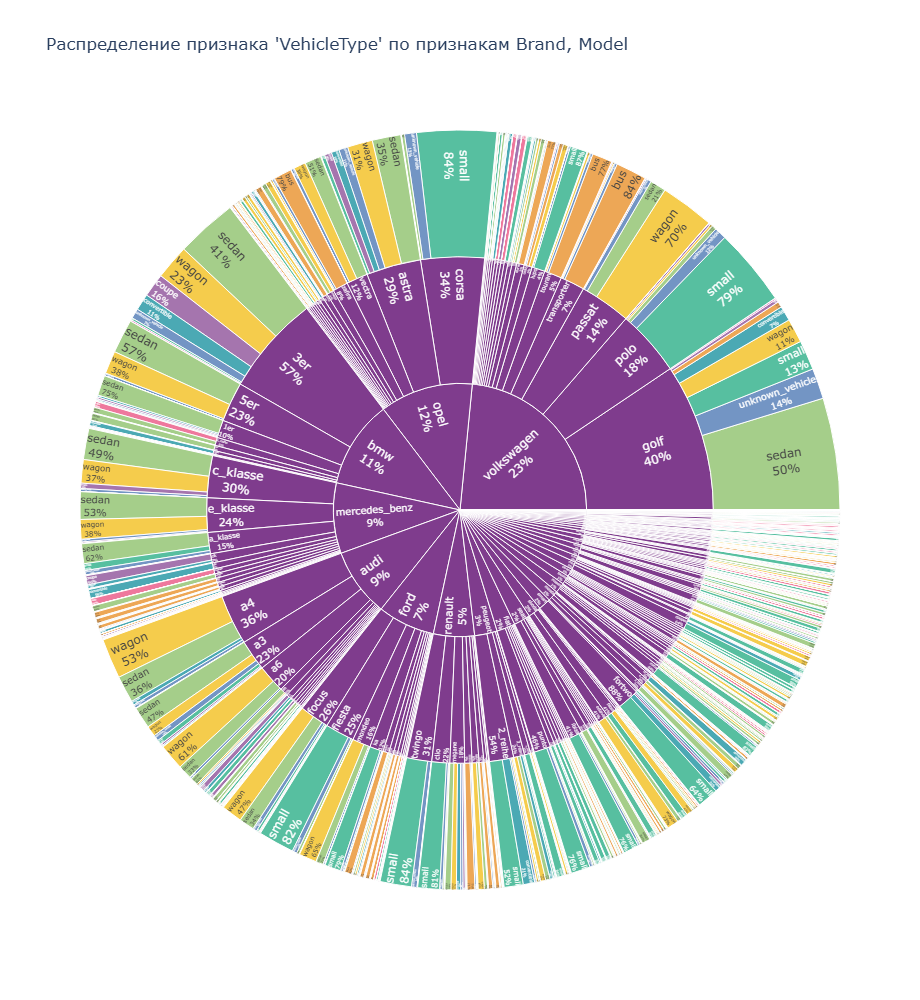

In [19]:
plot_sunburst_distribution(autos_df_copy, ['Brand', 'Model'], 'VehicleType', show_unique_values=False)

И аналогичным образом для большинства моделей есть значительно преобладающий тип авто.

Таким образом для признаков `Gearbox`, `VehicleType` пропуски заполним наиболее часто встречающимся значением для кажой модели машины. А для признака `FuelType` пропуски заполним наиболее популярным типом топлива для определенного значения признака `VehicleType`.

Теперь попробуем найти логику заполнения пропусков в столбце `Repaired`.

Логично предположить, что вероятность ремонта должна увеличиваться с ростом пробега и с отдалением даты регистрации. Проверим данные гипотезы. Для проверки первой рассчитаем распределение доли отремонтированных машин от пробега. При этом записи с пропусками в признаке `Repaired` не будем учитывать.

In [20]:
# просмотрим уникальные значения пробега
sorted_kilometer = autos_df_copy['Kilometer'].unique().copy()
sorted_kilometer.sort()
sorted_kilometer

array([  5000,  10000,  20000,  30000,  40000,  50000,  60000,  70000,
        80000,  90000, 100000, 125000, 150000], dtype=int64)

уникальные значения пробега отражают действительно возможные данные

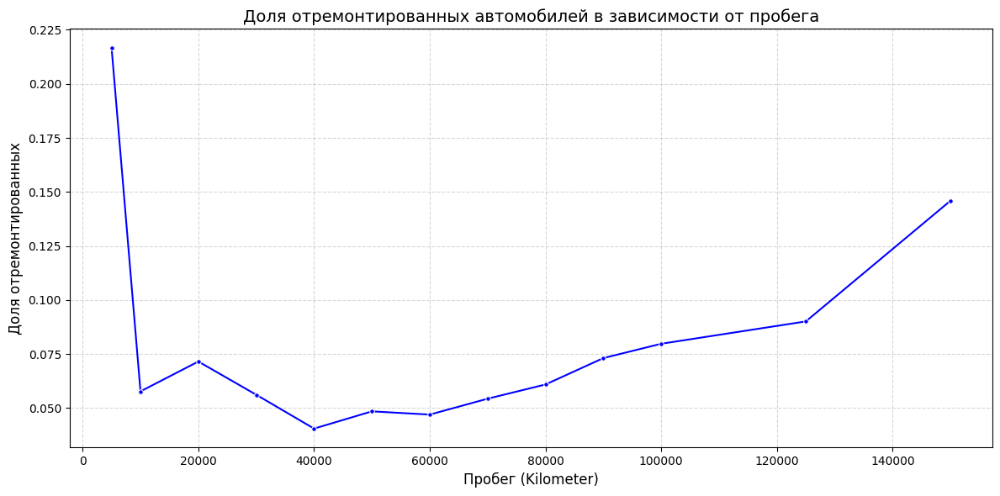

In [21]:
# Убираем строки с неизвестным статусом ремонта
autos_clean = autos_df_copy[autos_df_copy['Repaired']!='unknown'].copy()

# Преобразуем Repaired в числовой признак
autos_clean['RepairedBinary'] = autos_clean['Repaired'].map({'no': 0, 'yes': 1})

# Группируем по Kilometer и считаем долю отремонтированных
repaired_by_km = autos_clean.groupby('Kilometer', observed=False)['RepairedBinary'].mean().reset_index()

# Строим график: точки + линии между ними
plt.figure(figsize=(12, 6))
sns.lineplot(
    x='Kilometer',
    y='RepairedBinary',
    data=repaired_by_km,
    marker='o',       # маркеры (точки)
    markersize=4,     # размер точек
    linestyle='-',    # соединяем сплошной линией
    linewidth=1.5,
    color='blue'
)

# Оформление графика
plt.title('Доля отремонтированных автомобилей в зависимости от пробега', fontsize=14)
plt.xlabel('Пробег (Kilometer)', fontsize=12)
plt.ylabel('Доля отремонтированных', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

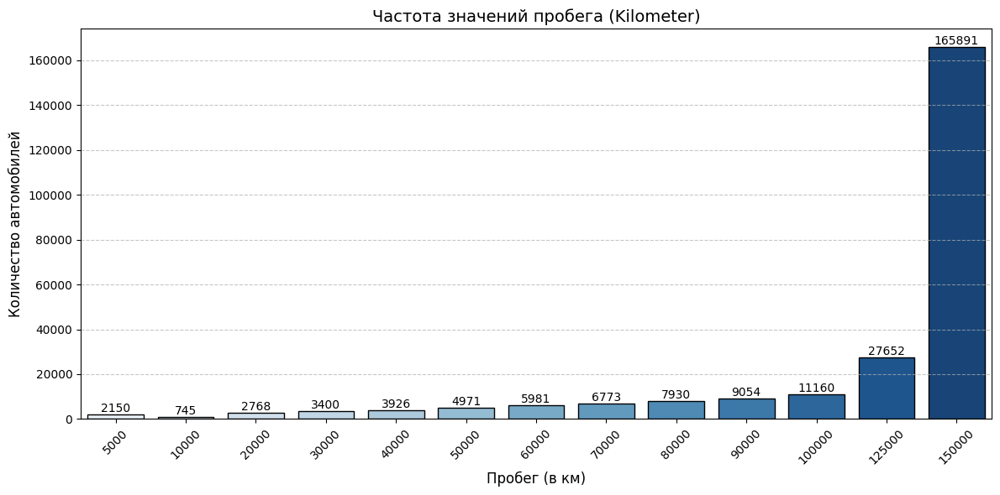

In [22]:
# Подготовка данных: подсчёт количества каждого значения
kilometer_counts = autos_clean['Kilometer'].value_counts().sort_index().reset_index()
kilometer_counts.columns = ['Kilometer', 'Count']

# Строим столбчатую диаграмму
plt.figure(figsize=(12, 6))
barplot = sns.barplot(
    data=kilometer_counts,
    x='Kilometer',
    y='Count',
    palette='Blues',
    edgecolor='black'
)

# Добавляем заголовки и оформление
plt.title('Частота значений пробега (Kilometer)', fontsize=14)
plt.xlabel('Пробег (в км)', fontsize=12)
plt.ylabel('Количество автомобилей', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Добавляем числа над столбцами
for p in barplot.patches:
    barplot.annotate(f'{int(p.get_height())}',
                     (p.get_x() + p.get_width() / 2., p.get_height()),
                     ha='center', va='bottom', fontsize=10)

# Отображаем график
plt.show()

Мы наблюдаем, что отремонтированных машин значительно меньше для любого пробега, то есть на глаза дисбаланс класса. При этом рост доли отремонтированных машин происходит лишь с 40000 км, до этого значения наоборот наблидается спад. Однако распределение машин по пробегу сильно не равномерное с преобладающим количеством для максимального пробега 150000 км. Для области пробега, где наблюдается спад доли отремонтированных авто, характерна маленькая выборка по сравнению с остальным промежутком, поэтому нельзя сделать однозначные выводы. На основе данной неоднозначной зависимости сложно как-либо заполнить пропуски в столбце `Repaired`.

Рассмотрим как распределены классы в признаке `Repaired` по пробегу.

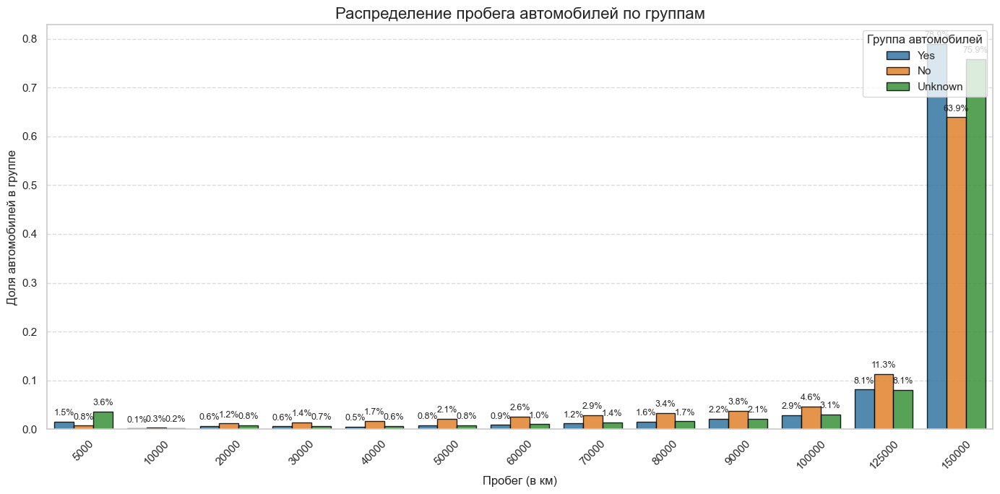

In [23]:
# Получаем все уникальные значения пробега и сортируем их
km_categories = sorted(autos_df_copy['Kilometer'].unique())

# Создаем DataFrame для визуализации
plot_data = []

# Список всех групп
groups = ['yes', 'no', 'unknown']

# Цвета для групп
palette_colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

# Обрабатываем каждую группу
for group in groups:
    group_data = autos_df_copy[autos_df_copy['Repaired'] == group]

    # Считаем количество для каждого пробега, включая отсутствующие категории
    counts = group_data['Kilometer'].value_counts().reindex(km_categories, fill_value=0)

    # Рассчитываем доли, избегая деления на ноль
    if counts.sum() > 0:
        proportions = counts / counts.sum()
    else:
        # Возвращаем Series с нулями нужной длины
        proportions = pd.Series(0, index=km_categories)

    # Добавляем данные в список
    for km, prop in zip(km_categories, proportions):
        plot_data.append({
            'Kilometer': km,
            'Proportion': prop,
            'Group': group.capitalize() if group != 'unknown' else 'Unknown'
        })

# Создаем DataFrame из собранных данных
plot_df = pd.DataFrame(plot_data)

# Настраиваем стиль
sns.set_theme(style="whitegrid")
plt.figure(figsize=(14, 7))

# Создаем группированную столбчатую диаграмму
ax = sns.barplot(
    data=plot_df,
    x='Kilometer',
    y='Proportion',
    hue='Group',
    palette=palette_colors,  # Цвета для всех трёх групп
    edgecolor='black',
    alpha=0.85
)

# Настройка оформления
plt.title('Распределение пробега автомобилей по группам', fontsize=16)
plt.xlabel('Пробег (в км)', fontsize=12)
plt.ylabel('Доля автомобилей в группе', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Добавляем подписи с процентами
for p in ax.patches:
    height = p.get_height()
    if height > 0:  # Подписываем только ненулевые значения
        ax.annotate(
            f'{height:.1%}',
            (p.get_x() + p.get_width() / 2., height),
            ha='center', va='bottom',
            fontsize=9,
            xytext=(0, 4),
            textcoords='offset points'
        )

# Настраиваем легенду
plt.legend(title='Группа автомобилей', loc='upper right')
plt.tight_layout()
plt.show()

Вид распределения для неизвестного класса признака `Repaired` схож с распределением класса отремонтированных авто.

In [24]:
# распределение авто по категориям признака Repaired
autos_df_copy['Repaired'].value_counts()

Repaired
no         221721
unknown     57842
yes         30680
Name: count, dtype: int64

Учитывая одинаковое распределние, напрашивается назначить неизвестной категории значение `yes`. При этом результирующая категория `yes` по-прежнему будет в меньшинстве, что сохранит дисбаланс классов признака `Repaired`.

Однако в датасете есть еще один признак, который должен влиять на вероятность ремонта — год регистрации авто (`RegistrationYear`). Проведем аналогичные исследования и проверим гипотезу об увеличении вероятности ремонта по мере отдаления от года регистрации.

In [25]:
# выведем уникальные значения года регистрации по возрастанию
sorted_years = autos_df_copy['RegistrationYear'].unique().copy()
sorted_years.sort()
sorted_years

array([1000, 1111, 1200, 1234, 1300, 1400, 1500, 1600, 1800, 1910, 1923,
       1930, 1936, 1938, 1945, 1950, 1952, 1954, 1956, 1958, 1959, 1960,
       1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971,
       1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982,
       1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993,
       1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004,
       2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015,
       2016, 2017, 2018, 2019, 2066, 2200, 2290, 2500, 2900, 3000, 3700,
       4000, 5000, 5555, 5900, 5911, 7000, 7100, 8000, 8200, 8500, 9000,
       9999], dtype=int64)

В признаке `RegistrationYear` наблюдаются аномальные значения. Чтобы исправить аномальные значения, с помощью GPT составим строку с данными в формате CSV, содержащую информацию о самом раннем годе регистрации, а также минимальной и максимальной мощности двигателя для каждой модели. Информация о мощности нужна для проверки корректности значений признака `Power`.

<a id='2'></a>

In [26]:
# Создаем строку с данными в формате CSV
data = StringIO('''Brand,Model,First_Year,Min_HP,Max_HP
alfa_romeo,145,1994,90,150
alfa_romeo,147,2000,95,250
alfa_romeo,156,1997,105,250
alfa_romeo,159,2005,120,260
alfa_romeo,spider,1995,120,240
audi,100,1982,75,230
audi,200,1979,115,217
audi,80,1978,75,230
audi,90,1984,75,230
audi,a1,2010,85,256
audi,a2,1999,60,116
audi,a3,1996,101,400
audi,a4,1994,102,450
audi,a5,2007,170,450
audi,a6,1994,110,600
audi,a8,1994,220,630
audi,q3,2011,140,340
audi,q5,2008,143,354
audi,q7,2005,233,500
audi,tt,1998,150,400
bmw,1er,2004,116,340
bmw,3er,1975,75,503
bmw,5er,1972,90,625
bmw,6er,1976,184,560
bmw,7er,1977,150,585
bmw,i3,2013,170,184
bmw,m_reihe,1985,200,625
bmw,x_reihe,1999,150,625
bmw,z_reihe,1989,150,343
chevrolet,aveo,2002,84,115
chevrolet,captiva,2006,150,184
chevrolet,matiz,1998,51,86
chevrolet,spark,2005,68,84
chrysler,300c,2004,190,363
chrysler,crossfire,2003,215,330
chrysler,grand,1988,150,242
chrysler,ptcruiser,2000,120,220
chrysler,voyager,1988,150,242
citroen,berlingo,1996,60,110
citroen,c1,2005,68,82
citroen,c2,2003,61,125
citroen,c3,2002,61,155
citroen,c4,2004,70,210
citroen,c5,2001,90,208
dacia,duster,2010,85,150
dacia,lodgy,2012,90,115
dacia,logan,2004,75,135
dacia,sandero,2008,75,115
daewoo,kalos,2002,75,107
daewoo,lanos,1997,75,109
daewoo,matiz,1998,51,86
daewoo,nubira,1997,94,131
daihatsu,charade,1977,40,100
daihatsu,cuore,1980,50,103
daihatsu,materia,2006,90,103
daihatsu,move,1996,50,64
daihatsu,sirion,1998,65,102
daihatsu,terios,1997,80,104
fiat,500,2007,69,135
fiat,bravo,2007,90,150
fiat,croma,1985,75,150
fiat,doblo,2001,75,135
fiat,ducato,1981,75,180
fiat,panda,1980,45,100
fiat,punto,1993,45,190
fiat,seicento,1998,39,54
fiat,stilo,2001,80,170
ford,b_max,2012,75,120
ford,c_max,2003,90,150
ford,escort,1968,50,130
ford,fiesta,1976,45,200
ford,focus,1998,65,350
ford,fusion,2002,75,100
ford,galaxy,1995,90,200
ford,ka,1996,50,120
ford,kuga,2008,110,180
ford,mondeo,1993,90,240
ford,mustang,1964,100,450
ford,s_max,2006,100,200
ford,transit,1965,70,155
honda,accord,1976,68,280
honda,civic,1972,50,320
honda,cr_reihe,1995,125,190
honda,jazz,2001,61,120
hyundai,getz,2002,65,107
hyundai,i_reihe,2008,80,140
hyundai,santa,2001,109,200
hyundai,tucson,2004,113,185
jaguar,s_type,1999,200,390
jaguar,x_type,2001,150,231
jeep,cherokee,1974,90,270
jeep,grand,1993,120,330
jeep,wrangler,1986,120,285
kia,carnival,1998,130,200
kia,ceed,2006,90,201
kia,picanto,2004,60,100
kia,rio,2000,75,120
kia,sorento,2002,120,200
kia,sportage,1993,95,185
lada,kalina,2004,80,98
lada,niva,1977,72,83
lada,samara,1984,50,80
lancia,delta,1979,65,205
lancia,elefantino,1983,75,105
lancia,kappa,1994,150,230
lancia,lybra,1999,100,150
lancia,musa,2004,95,120
lancia,ypsilon,1995,60,135
land_rover,defender,1983,75,122
land_rover,discovery,1989,100,200
land_rover,freelander,1997,100,200
land_rover,range_rover,1970,130,525
land_rover,range_rover_evoque,2011,150,300
land_rover,range_rover_sport,2005,190,525
land_rover,serie_1,1948,50,80
land_rover,serie_2,1958,50,90
land_rover,serie_3,1971,60,100
mazda,1_reihe,2002,75,150
mazda,3_reihe,2003,75,250
mazda,5_reihe,2005,100,170
mazda,6_reihe,2002,100,220
mazda,cx_reihe,2006,115,185
mazda,mx_reihe,1989,90,240
mazda,rx_reihe,1978,105,280
mercedes_benz,a_klasse,1997,82,190
mercedes_benz,b_klasse,2005,95,200
mercedes_benz,c_klasse,1993,95,510
mercedes_benz,cl,1992,150,530
mercedes_benz,clk,1997,122,367
mercedes_benz,e_klasse,1993,95,612
mercedes_benz,g_klasse,1979,150,585
mercedes_benz,gl,2006,150,450
mercedes_benz,glk,2008,150,265
mercedes_benz,m_klasse,1997,150,510
mercedes_benz,s_klasse,1972,130,630
mercedes_benz,sl,1971,150,585
mercedes_benz,slk,1996,122,360
mercedes_benz,sprinter,1995,75,190
mercedes_benz,v_klasse,1996,95,190
mercedes_benz,viano,2003,95,190
mercedes_benz,vito,1996,75,190
mini,clubman,2007,90,211
mini,cooper,2001,75,231
mini,one,2001,75,120
mitsubishi,carisma,1995,90,140
mitsubishi,colt,1995,75,150
mitsubishi,galant,1969,80,280
mitsubishi,lancer,1973,75,295
mitsubishi,outlander,2001,120,240
mitsubishi,pajero,1982,80,250
nissan,almera,1995,75,140
nissan,juke,2010,94,200
nissan,micra,1982,50,117
nissan,navara,1997,100,190
nissan,note,2005,80,110
nissan,primera,1990,90,200
nissan,qashqai,2006,115,160
nissan,x_trail,2000,114,177
opel,agila,2000,60,100
opel,antara,2006,120,230
opel,astra,1991,60,280
opel,calibra,1989,90,204
opel,combo,1993,60,125
opel,corsa,1982,45,210
opel,insignia,2008,95,260
opel,kadett,1962,40,115
opel,meriva,2003,75,140
opel,omega,1986,75,210
opel,signum,2003,100,220
opel,tigra,1994,90,125
opel,vectra,1988,75,280
opel,vivaro,2001,90,150
opel,zafira,1999,75,200
peugeot,1_reihe,1998,60,180
peugeot,2_reihe,1987,50,200
peugeot,3_reihe,1991,60,210
peugeot,4_reihe,1987,65,160
peugeot,5_reihe,1997,90,210
porsche,911,1963,130,650
porsche,boxster,1996,200,375
porsche,cayenne,2002,250,550
renault,clio,1990,55,220
renault,espace,1984,90,250
renault,kangoo,1997,60,130
renault,laguna,1993,90,205
renault,megane,1995,75,275
renault,modus,2004,75,130
renault,r19,1988,60,140
renault,scenic,1996,75,150
renault,twingo,1992,55,133
rover,defender,1983,75,122
rover,discovery,1989,100,200
rover,freelander,1997,100,200
rover,rangerover,1970,130,525
saab,900,1978,100,185
saab,9000,1984,118,225
seat,alhambra,1996,90,200
seat,altea,2004,85,200
seat,arosa,1997,44,75
seat,cordoba,1993,50,130
seat,exeo,2008,120,200
seat,ibiza,1984,45,240
seat,leon,1999,75,300
seat,mii,2011,60,75
seat,toledo,1991,60,150
skoda,citigo,2011,60,75
skoda,fabia,1999,60,180
skoda,octavia,1996,60,245
skoda,roomster,2006,75,105
skoda,superb,2001,100,280
skoda,yeti,2009,105,170
smart,forfour,2004,61,109
smart,fortwo,1998,45,109
smart,roadster,2003,60,82
subaru,forester,1997,120,280
subaru,impreza,1992,90,300
subaru,justy,1984,60,100
subaru,legacy,1989,110,280
suzuki,grand,1998,80,140
suzuki,jimny,1970,60,140
suzuki,swift,1983,50,140
toyota,auris,2006,90,180
toyota,avensis,1997,90,177
toyota,aygo,2005,53,72
toyota,corolla,1966,60,190
toyota,rav,1994,120,200
toyota,verso,2001,90,150
toyota,yaris,1999,55,130
trabant,601,1964,23,26
volkswagen,amarok,2010,90,180
volkswagen,beetle,1938,25,220
volkswagen,bora,1998,75,180
volkswagen,caddy,1979,60,200
volkswagen,cc,2008,120,300
volkswagen,eos,2006,102,265
volkswagen,fox,2005,60,100
volkswagen,golf,1974,50,310
volkswagen,jetta,1979,75,300
volkswagen,kaefer,1938,25,50
volkswagen,lupo,1998,50,125
volkswagen,passat,1973,55,280
volkswagen,phaeton,2002,150,420
volkswagen,polo,1975,40,200
volkswagen,scirocco,1974,50,265
volkswagen,sharan,1995,90,240
volkswagen,tiguan,2007,110,240
volkswagen,touareg,2002,150,450
volkswagen,touran,2003,75,200
volkswagen,transporter,1950,44,180
volkswagen,up,2011,60,90
volvo,850,1991,120,225
volvo,c_reihe,1997,120,250
volvo,s60,2000,120,300
volvo,v40,1995,90,200
volvo,v50,2004,100,220
volvo,v60,2010,115,300
volvo,v70,1996,120,300
volvo,xc_reihe,1997,120,330''')

# Загружаем данные в DataFrame
car_info = pd.read_csv(data)

In [27]:
# Выводим первые несколько строк и информацию для проверки
display(car_info.head())
print('')
car_info.info()

,Brand,Model,First_Year,Min_HP,Max_HP
0,alfa_romeo,145,1994,90,150
1,alfa_romeo,147,2000,95,250
2,alfa_romeo,156,1997,105,250
3,alfa_romeo,159,2005,120,260
4,alfa_romeo,spider,1995,120,240



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 258 entries, 0 to 257
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Brand       258 non-null    object
 1   Model       258 non-null    object
 2   First_Year  258 non-null    int64 
 3   Min_HP      258 non-null    int64 
 4   Max_HP      258 non-null    int64 
dtypes: int64(3), object(2)
memory usage: 10.2+ KB


In [28]:
%%time
# Объединяем датафреймы
autos_df_merged = autos_df_copy.merge(car_info, on=['Brand', 'Model'], how='left')

# Векторизованная замена через np.where
autos_df_merged['RegistrationYear'] = np.where(
    # Проверяем, существует ли First_Year и RegistrationYear < First_Year
    (autos_df_merged['First_Year'].notna()) &
    (autos_df_merged['RegistrationYear'] < autos_df_merged['First_Year']),

    # Если да — меняем на First_Year
    autos_df_merged['First_Year'],

    # Иначе оставляем как есть
    autos_df_merged['RegistrationYear']
)

# Оставляем дополнительные колонки для проверки мощности
autos_df_copy = autos_df_merged

CPU times: total: 141 ms
Wall time: 150 ms


In [29]:
# выведем уникальные значения года регистрации по возрастанию
sorted_years = autos_df_copy['RegistrationYear'].unique().copy()
sorted_years.sort()
sorted_years

array([1938, 1950, 1956, 1958, 1959, 1960, 1961, 1962, 1963, 1964, 1965,
       1966, 1967, 1968, 1969, 1970, 1971, 1972, 1973, 1974, 1975, 1976,
       1977, 1978, 1979, 1980, 1981, 1982, 1983, 1984, 1985, 1986, 1987,
       1988, 1989, 1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998,
       1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009,
       2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2066,
       2200, 2290, 2500, 2900, 3000, 3700, 4000, 5000, 5555, 5900, 5911,
       7000, 7100, 8000, 8200, 8500, 9000, 9999], dtype=int64)

<a id='retro'></a>

Требуется отметить, что в датасете присутствуют машины с годом регистрации аж 1938, что относится к раритетным машинам, цена которых может быть аномально высокой, то есть абсолютно не подчиняющейся каким-либо закономерностям. Предлагается исследовать медианную стоимость авто в зависимости от года регистрации и найти на основе этих данных нижнюю границу. Для начала разберемся с аномально большими значениями года регистрации. Узнаем их количество.

In [30]:
# Находим некорректные записи: RegistrationYear больше 2019
invalid_rows = autos_df_copy[autos_df_copy['RegistrationYear'] > 2019]

# Подсчитываем их количество
print(f'Число авто с годом регистрации больше 2019: {len(invalid_rows)}')

Число авто с годом регистрации больше 2019: 49


Их количество незначительно — поэтому удалим

In [31]:
# Удаляем записи с аномально большим годом
autos_df_copy = autos_df_copy[autos_df_copy['RegistrationYear'] <= 2019]

Теперь построим зависимость медианной цены автомобилей от года регистрации

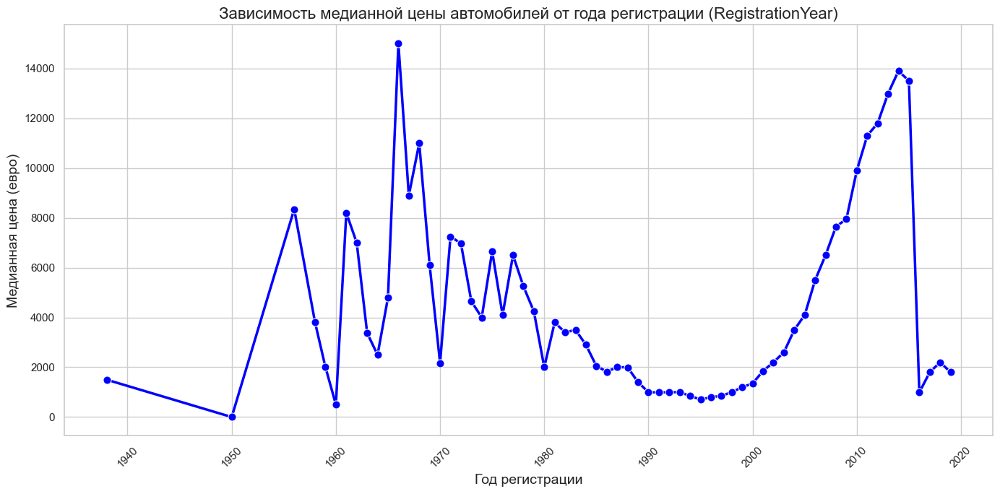

In [32]:
# Группируем данные по году регистрации и вычисляем медианную цену
median_prices_by_year = autos_df_copy.groupby('RegistrationYear')['Price'].median().reset_index()

# Сортируем по году для красивого графика
median_prices_by_year = median_prices_by_year.sort_values('RegistrationYear')

# Строим график
plt.figure(figsize=(14, 7))
sns.set_style("whitegrid")
ax = sns.lineplot(data=median_prices_by_year, x='RegistrationYear', y='Price',
                  color='blue', linewidth=2.5, marker='o', markersize=8)
plt.title('Зависимость медианной цены автомобилей от года регистрации (RegistrationYear)', fontsize=16)
plt.xlabel('Год регистрации', fontsize=14)
plt.ylabel('Медианная цена (евро)', fontsize=14)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Мы видим, что в обратном направлении начиная с 1990 год медианная цена на авто начинает увеличиваться, с 1980 сильно колеблется и при этом в районе 1966 г принимает максимальное значение. В качестве нижней границы предлагается выставить значение 1990 год, так как цена для машин с годом регистрации меньше нее ведет себя абсолютно непредсказуемо. Посчитаем количество записей с годом регистрации меньше 1990.

Также стоит отметить, что наблюдается резкий скачек вниз в 2016 году. Причина этого скачка пока не понятна — требуется дальнейший анализ.

In [33]:
a = autos_df_copy.query('RegistrationYear<1990')['RegistrationYear'].count()
b = a/len(autos_df_copy)
print(f'''Количество записей с годом регистрации меньше 1990: {a}
Доля от данных: {b:.2%}''')

Количество записей с годом регистрации меньше 1990: 4199
Доля от данных: 1.35%


Таких записей около 1%, поэтому их удаление лишь улучшит предсказательную способность модели, так как будет меньше редких случаев.

In [34]:
autos_df_copy = autos_df_copy[autos_df_copy['RegistrationYear']>=1990]

In [35]:
# выведем уникальные значения года регистрации по возрастанию после обработки
sorted_years = autos_df_copy['RegistrationYear'].unique().copy()
sorted_years.sort()
sorted_years

array([1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000,
       2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011,
       2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019], dtype=int64)

Теперь в признаке `RegistrationYear` нет аномальных значений и мы можем построить график зависимости доли отремонтированных авто от года регистрации.

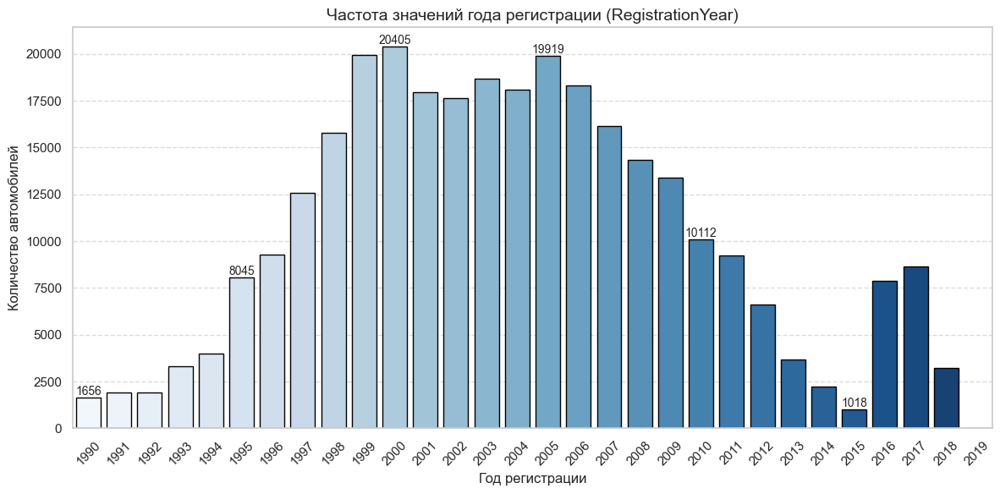

In [36]:
# Подготовка данных: подсчёт количества каждого значения
kilometer_counts = autos_df_copy['RegistrationYear'].value_counts().sort_index().reset_index()
kilometer_counts.columns = ['RegistrationYear', 'Count']

# Строим столбчатую диаграмму с помощью seaborn
plt.figure(figsize=(12, 6))
barplot = sns.barplot(
    data=kilometer_counts,
    x='RegistrationYear',
    y='Count',
    palette='Blues',
    edgecolor='black'
)

# Добавляем заголовки и оформление
plt.title('Частота значений года регистрации (RegistrationYear)', fontsize=14)
plt.xlabel('Год регистрации', fontsize=12)
plt.ylabel('Количество автомобилей', fontsize=12)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()

# Добавляем числа над каждым 5-м столбцом
for i, p in enumerate(barplot.patches):
    if i % 5 == 0:  # показываем подпись только для каждого 5-го столбца
        barplot.annotate(f'{int(p.get_height())}',
                         (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='bottom', fontsize=10)

# Отображаем график
plt.show()

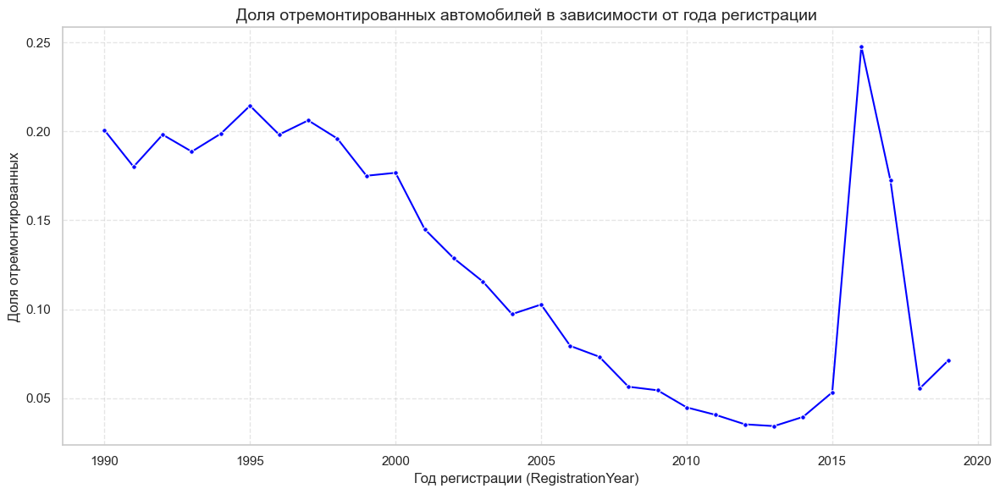

In [37]:
# Убираем строки с неизвестным статусом ремонта
autos_clean = autos_df_copy[autos_df_copy['Repaired']!='unknown'].copy()

# Преобразуем Repaired в числовой признак
autos_clean['RepairedBinary'] = autos_clean['Repaired'].map({'no': 0, 'yes': 1})

# Группируем по RegistrationYear и считаем долю отремонтированных
repaired_by_km = autos_clean.groupby('RegistrationYear', observed=False)['RepairedBinary'].mean().reset_index()

# Строим график: точки + линии между ними
plt.figure(figsize=(12, 6))
sns.lineplot(
    x='RegistrationYear',
    y='RepairedBinary',
    data=repaired_by_km,
    marker='o',       # маркеры (точки)
    markersize=4,     # размер точек
    linestyle='-',    # соединяем сплошной линией
    linewidth=1.5,
    color='blue'
)

# Оформление графика
plt.title('Доля отремонтированных автомобилей в зависимости от года регистрации', fontsize=14)
plt.xlabel('Год регистрации (RegistrationYear)', fontsize=12)
plt.ylabel('Доля отремонтированных', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

В очередной раз наблюдается дисбаланс классов признака `Repaired`. Можно выделить четыре участка: 1990-1998 гг константный, 1998-2013 гг спадающий, 2013-2016 гг резко возрастающий, 2016-2019 гг резко спадающий. Получается доля отремонтированных машин практически не изменяется после 20 лет их службы. На промежутке от 5 до 20 лет вероятность ремонта увеличивается, а остальные участки не подчиняются какой-либо логике — возможно исследования далее дадут ответ на них.

Рассмотрим распределения каждого класса признака `Repaired` по годам регистрации `RegistrationYear`

<a id='graph_1'></a>

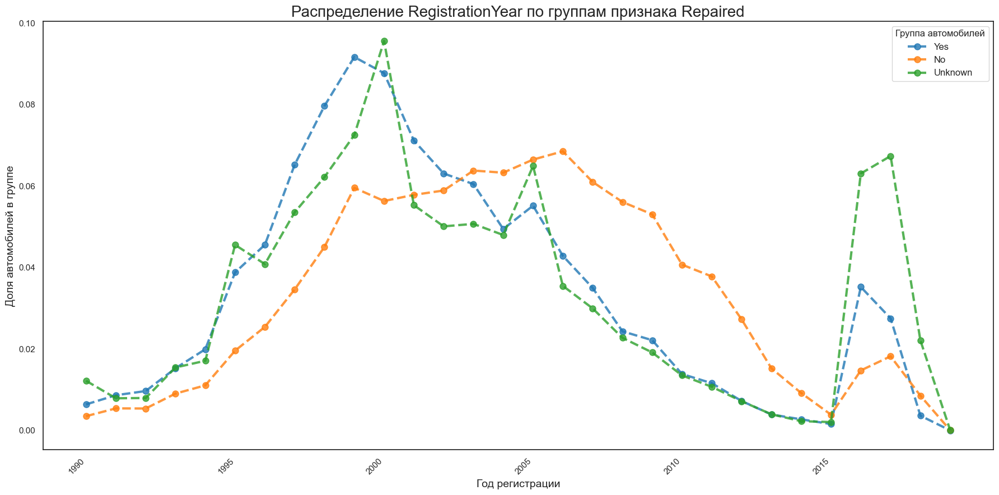

In [38]:
# Подготовка данных
plot_df = (autos_df_copy.groupby(['Repaired', 'RegistrationYear'])
           .size()
           .unstack(fill_value=0)
           .apply(lambda x: x/x.sum(), axis=1)
           .stack()
           .reset_index(name='Proportion')
           .rename(columns={'Repaired': 'Group'})
           .replace({'Group': {'yes': 'Yes', 'no': 'No', 'unknown': 'Unknown'}}))

# Настройка графика
plt.figure(figsize=(18, 9))
sns.set_theme(style="white")
ax = plt.gca()

# Построение линий
groups = ['Yes', 'No', 'Unknown']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

for group, color in zip(groups, colors):
    data = plot_df[plot_df['Group'] == group].sort_values('RegistrationYear')
    ax.plot(data['RegistrationYear'].astype(str), data['Proportion'],
            color=color, marker='o', linestyle='--', markersize=8,
            linewidth=3, alpha=0.8, label=group)

# Настройка оформления
plt.title('Распределение RegistrationYear по группам признака Repaired', fontsize=20)
plt.xlabel('Год регистрации', fontsize=14)
plt.ylabel('Доля автомобилей в группе', fontsize=14)

years = sorted(plot_df['RegistrationYear'].unique())
plt.xticks(range(0, len(years), 5), [str(y) for y in years[::5]], rotation=45, ha='right')
ax.grid(False)
plt.legend(title='Группа автомобилей', title_fontsize=12, fontsize=12)
plt.tight_layout()
plt.show()

Во-первых, сразу бросается в глаза разница в распределениях отремонтированных и не отремонтированных авто: максимум распределения первых находится левее в районе 2000 года против 2006 года для вторых. Во-вторых, видно, что класс `Unknown` совмещает в себе оба распределения, так как содержит оба пика на 2000 и 2006 годах.

Объединяя результаты исследований распределений классов в признаках `Kilometer` и `RegistrationYear` можно сделать вывод, что при заполнении пропусков в признаке `Repaired` нужно опираться на оба признака `Kilometer` и `RegistrationYear`. Учитывая, что классы `Yes` и `Unknown` признака `Repaired` имеют схожие распределения по значениям признака `Kilometer`, то за основу нужно брать именно этот признак. И уже для каждого значения `Kilometer` исследовать распределения по значениям признака `RegistrationYear`.

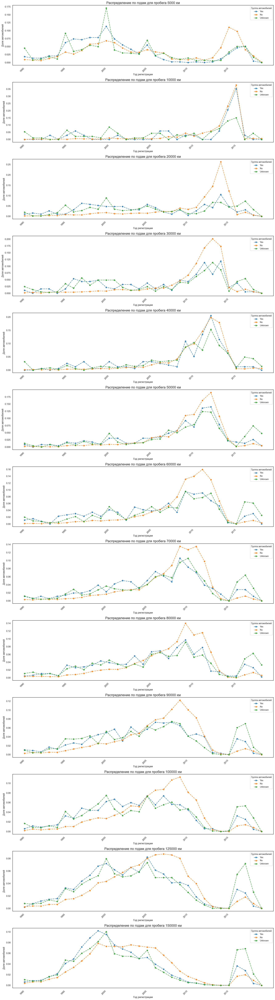

In [39]:
# Получаем уникальные значения Kilometer и сортируем их
kilometer_values = sorted(autos_df_copy['Kilometer'].unique())

# Создаем фигуру с несколькими subplots
fig, axes = plt.subplots(len(kilometer_values), 1, figsize=(18, 5*len(kilometer_values)))
sns.set_theme(style="white")

# Цвета и группы для графиков
groups = ['Yes', 'No', 'Unknown']
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']

# Строим график для каждого значения Kilometer
for km, ax in zip(kilometer_values, axes):
    # Фильтруем данные по текущему значению Kilometer
    df_filtered = autos_df_copy[autos_df_copy['Kilometer'] == km]

    # Подготовка данных для текущего Kilometer
    plot_df = (df_filtered.groupby(['Repaired', 'RegistrationYear'])
               .size()
               .unstack(fill_value=0)
               .apply(lambda x: x/x.sum(), axis=1)
               .stack()
               .reset_index(name='Proportion')
               .rename(columns={'Repaired': 'Group'})
               .replace({'Group': {'yes': 'Yes', 'no': 'No', 'unknown': 'Unknown'}}))

    # Построение линий для каждой группы
    for group, color in zip(groups, colors):
        data = plot_df[plot_df['Group'] == group].sort_values('RegistrationYear')
        ax.plot(data['RegistrationYear'].astype(str), data['Proportion'],
                color=color, marker='o', linestyle='--', markersize=6,
                linewidth=2, alpha=0.8, label=group)

    # Настройка оформления для каждого subplot
    ax.set_title(f'Распределение по годам для пробега {km} км', fontsize=16)
    ax.set_xlabel('Год регистрации', fontsize=12)
    ax.set_ylabel('Доля автомобилей', fontsize=12)

    years = sorted(plot_df['RegistrationYear'].unique())
    ax.set_xticks(range(0, len(years), 5))
    ax.set_xticklabels([str(y) for y in years[::5]], rotation=45, ha='right')
    ax.grid(False)
    ax.legend(title='Группа автомобилей', title_fontsize=10, fontsize=10)

plt.tight_layout()
plt.show()

Мы наблюдаем поразительное сходство распределений классов `Yes` и `Unknown` по годам регистрации для всех значений `Kilometer` за исключением пробега 150000 км, где для класса `Unknown` проявляется пик, характерный классу `No` на 2005 году. Учитывая, что пробегу 150000 км принадлежит бОльшая доля авто для всех классов признака `Repaired`, то по всей видимости эти данные и дают отпечаток класса `No` на кривой для `Unknown` на общем графике [(Перейти к графику)](#graph_1). Получается, что для пробега 150000 км требуется найти критерий для разделения, по значению признака `Repaired`.

Проверка размера выборки для каждой группы:
Группа 'Без ремонта': размер выборки достаточный (n=90367)
Группа 'Неизвестно': размер выборки достаточный (n=22592)
Группа 'Ремонт был': размер выборки достаточный (n=13762)

Общий размер выборки для пробега 150К км: 126721


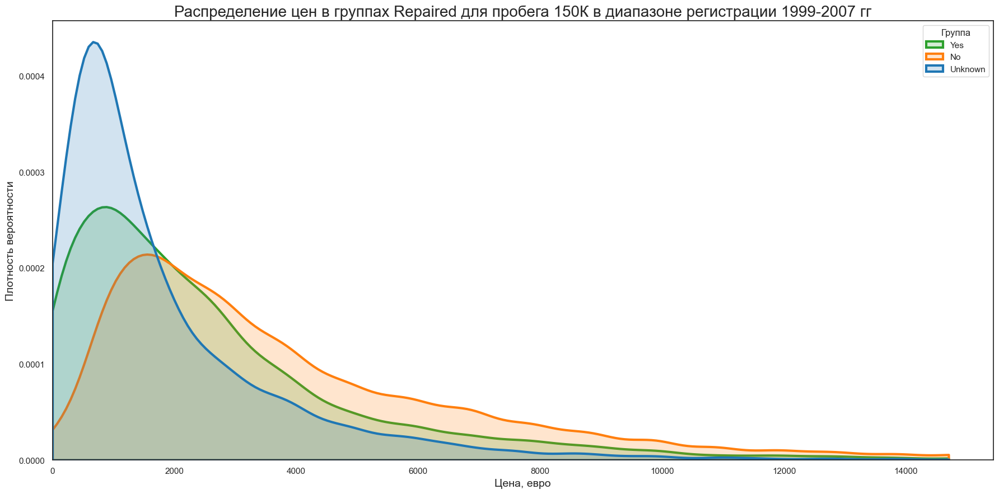

In [40]:
# Проверка размера выборки для каждой группы Repaired
group_counts = autos_df_copy.query('Kilometer == 150000 and RegistrationYear>=1999 and RegistrationYear<=2007')['Repaired'].value_counts()

print("Проверка размера выборки для каждой группы:")
for group, count in group_counts.items():
    group_name = {'yes': 'Ремонт был', 'no': 'Без ремонта', 'unknown': 'Неизвестно'}.get(group, group)
    if count < 30:
        print(f"Внимание: в группе '{group_name}' малая выборка (n={count})!")
    else:
        print(f"Группа '{group_name}': размер выборки достаточный (n={count})")

# Дополнительно: общий размер выборки
total_samples = group_counts.sum()
print(f"\nОбщий размер выборки для пробега 150К км: {total_samples}")


# Построение графика
plt.figure(figsize=(18, 9))
sns.set_theme(style="white")

# Определяем верхнюю границу для clip
price_max = autos_df_copy['Price'].quantile(0.95)

sns.kdeplot(data=autos_df_copy.query('Kilometer==150000 and RegistrationYear>=1999 and RegistrationYear<=2007'), x='Price', hue='Repaired',
            hue_order=['yes', 'no', 'unknown'],
            palette=['#1f77b4', '#ff7f0e', '#2ca02c'],
            common_norm=False,
            fill=True,
            alpha=0.2,
            linewidth=3,
            clip=(0, price_max))

# Дополнительно обрезаем ось X
plt.xlim(left=0)

plt.title('Распределение цен в группах Repaired для пробега 150К в диапазоне регистрации 1999-2007 гг', fontsize=20)
plt.xlabel('Цена, евро', fontsize=14)
plt.ylabel('Плотность вероятности', fontsize=14)
plt.legend(title='Группа', labels=['Yes', 'No', 'Unknown'])
plt.grid(False)
plt.tight_layout()
plt.show()

На графике распределения цены в группах Repaired для пробега 150К в диапазоне регистрации 1999-2007 гг мы наблюдаем, что наиболее вероятное значение цены для группы `Unknown` соответствует наиболее вероятной цене для группы `Yes`. Получается, что на пробеге 150000 все же вероятнее наличие ремонта у машины, нежели его отсутствие. Поэтому сделаем допущение, что все значения `Unknown` в признаке `Repaired` соответствуют значению `Yes`.

Таким образом, для заполнения пропусков в оставшихся признаках требуется провести следующую последовательность действий:
- для признаков `Gearbox`, `VehicleType` пропуски `unknown_gearbox` и `unknown_vehicle` соответственно заменим наиболее часто встречающимся значением для каждой модели машины;
- для признака `FuelType` пропуски `unknown_fuel` заменим наиболее популярным типом топлива для определенного значения признака `VehicleType`;
- все значения `Unknown` в признаке `Repaired` переименуем на `Yes`.

In [41]:
# 1. Замена пропусков в Gearbox (unknown_gearbox) на наиболее частые значения по Brand и Model
gear_mode_by_brand_model = (
    autos_df_copy[autos_df_copy['Gearbox'] != 'unknown_gearbox']
    .groupby(['Brand', 'Model'])['Gearbox']
    .agg(lambda x: x.mode()[0] if not x.empty else 'unknown_gearbox')
)

autos_df_copy['Gearbox'] = autos_df_copy.apply(
    lambda row: gear_mode_by_brand_model.get((row['Brand'], row['Model']), 'unknown_gearbox')
    if row['Gearbox'] == 'unknown_gearbox'
    else row['Gearbox'],
    axis=1
)

# 2. Замена пропусков в VehicleType (unknown_vehicle) на наиболее частые значения по Brand и Model
vehicle_mode_by_brand_model = (
    autos_df_copy[autos_df_copy['VehicleType'] != 'unknown_vehicle']
    .groupby(['Brand', 'Model'])['VehicleType']
    .agg(lambda x: x.mode()[0] if not x.empty else 'unknown_vehicle')
)

autos_df_copy['VehicleType'] = autos_df_copy.apply(
    lambda row: vehicle_mode_by_brand_model.get((row['Brand'], row['Model']), 'unknown_vehicle')
    if row['VehicleType'] == 'unknown_vehicle'
    else row['VehicleType'],
    axis=1
)

# 3. Замена пропусков в FuelType (unknown_fuel) на наиболее частые значения по VehicleType
fuel_mode_by_vehicle = (
    autos_df_copy[autos_df_copy['FuelType'] != 'unknown_fuel']
    .groupby('VehicleType')['FuelType']
    .agg(lambda x: x.mode()[0] if not x.empty else 'unknown_fuel')
)

autos_df_copy['FuelType'] = autos_df_copy.apply(
    lambda row: fuel_mode_by_vehicle.get(row['VehicleType'], 'unknown_fuel')
    if row['FuelType'] == 'unknown_fuel'
    else row['FuelType'],
    axis=1
)

# 4. Замена всех значений 'Unknown' в признаке Repaired на 'Yes'
autos_df_copy['Repaired'] = autos_df_copy['Repaired'].replace({'unknown': 'yes'})

# Проверка результатов
print("Пропуски после обработки:")
print("Gearbox:", autos_df_copy[autos_df_copy['Gearbox'] == 'unknown_gearbox'].shape[0])
print("VehicleType:", autos_df_copy[autos_df_copy['VehicleType'] == 'unknown_vehicle'].shape[0])
print("FuelType:", autos_df_copy[autos_df_copy['FuelType'] == 'unknown_fuel'].shape[0])
print("Repaired:", autos_df_copy[autos_df_copy['Repaired'] == 'unknown'].shape[0])

Пропуски после обработки:
Gearbox: 0
VehicleType: 1
FuelType: 0
Repaired: 0


После обработки остался один пропуск в признаке `VehicleType`. Посмотрим на информацию об этом авто.

In [42]:
autos_df_copy[autos_df_copy['VehicleType'] == 'unknown_vehicle']

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen,First_Year,Min_HP,Max_HP
59392,2016-03-22 21:25:39,8450,unknown_vehicle,2018,manual,46,serie_2,60000,9,gasoline,land_rover,no,2016-03-22 00:00:00,0,65326,2016-04-05 13:15:49,1958,50,90


Мы видим, что год регистрации `RegistrationYear` (2018) больше, чем год создания анкеты `DateCreated` (2016), что невозможно. Кроме этого согласно GPT данная модель авто выпускалась с 1958 года, что говорит о том, что это раритетная машина, которые мы исключили из датасета ранее [(Перейти к анализу)](#retro). Исходя из этого удалим эту запись.

In [43]:
# Удалим запись с пропуском в VehicleType
autos_df_copy = autos_df_copy[autos_df_copy['VehicleType'] != 'unknown_vehicle']

### Выявление неинформативных признаков

Теперь проанализируем входные признаки на предмет их влияния на целевой. Можно предположить, что следующие признаки являются неинформативными: `DateCrawled`, `RegistrationMonth`, `DateCreated`, `NumberOfPictures`, `PostalCode`, `LastSeen`. Для исследования построим распределение целевого признака от значений данных входных признаков.

Для начала выведем уникальные значения в данных признаках

In [44]:
# Преобразуем столбец DateCrawled в тип datetime
autos_df_copy['DateCrawled'] = pd.to_datetime(autos_df_copy['DateCrawled'])

# Выводим уникальные года из столбца DateCrawled
unique_years = autos_df_copy['DateCrawled'].dt.year.unique()

print(unique_years)

[2016]


In [45]:
# Выводим уникальные месяца из столбца DateCrawled
unique_month = autos_df_copy['DateCrawled'].dt.month.unique()

print(unique_month)

[3 4]


In [46]:
# Выводим уникальные месяца регистрации авто
autos_df_copy['RegistrationMonth'].unique()

array([ 0,  8,  6,  7, 10, 12, 11,  2,  3,  1,  4,  5,  9], dtype=int64)

In [47]:
# Преобразуем столбец DateCreated в тип datetime
autos_df_copy['DateCreated'] = pd.to_datetime(autos_df_copy['DateCreated'])

# Выводим уникальные года из столбца DateCreated
unique_years = autos_df_copy['DateCreated'].dt.year.unique()

print(unique_years)

[2016 2015 2014]


In [48]:
# Выводим уникальные месяца из столбца DateCreated за 2016 год как самый крайний
unique_month = autos_df_copy[autos_df_copy['DateCreated'].dt.year==2016]['DateCreated'].dt.month.unique()

print(unique_month)

[3 4 2 1]


In [49]:
# Выводим уникальные значения количества фото
autos_df_copy['NumberOfPictures'].unique()

array([0], dtype=int64)

In [50]:
# Выводим уникальные значения индексов
autos_df_copy['PostalCode'].unique()

array([70435, 90480, 91074, ..., 54610, 97259, 31096], dtype=int64)

In [51]:
# Преобразуем столбец LastSeen в тип datetime
autos_df_copy['LastSeen'] = pd.to_datetime(autos_df_copy['LastSeen'])

# Выводим уникальные года из столбца LastSeen
unique_years = autos_df_copy['LastSeen'].dt.year.unique()

print(unique_years)

[2016]


In [52]:
# Выводим уникальные месяца из столбца LastSeen
unique_month = autos_df_copy['LastSeen'].dt.month.unique()

print(unique_month)

[4 3]


In [53]:
# Расчитаем количество машин с регистрацией после 2016 года
over_count = (autos_df_copy[autos_df_copy['RegistrationYear']>2016]['RegistrationYear']).count()
print(f'Количество машин с регистрацией после 2016 года — {over_count} шт')

Количество машин с регистрацией после 2016 года — 11886 шт


Итак, мы видим, что крайний год скачивания анкеты из базы, создания анкеты, последней активности пользователя — 2016 год. Если верить этим данным, записи с годом регистрации авто после 2016 года невозможны. С другой стороны мы не знаем какие из этих противоречащих данных достоверны. Однако столбцов, указывающих на 2016 как крайний больше. Проверим их адекватность: количество записей с датой скачивания или датой последней активности ранее даты создания анкеты быть не должно.

In [54]:
# Расчитаем количество записей с датой скачивания ранее даты создания анкеты
a = (autos_df_copy[autos_df_copy['DateCrawled'].dt.year < autos_df_copy['DateCreated'].dt.year]['DateCrawled']).count()
# Расчитаем количество записей с датой последней активности ранее даты создания анкеты
b = (autos_df_copy[autos_df_copy['LastSeen'].dt.year < autos_df_copy['DateCreated'].dt.year]['DateCrawled']).count()

print(f'Количество противоречий — {a+b}')

Количество противоречий — 0


Поскольку противоречий в датах нет, то будем считать, что крайним годом регистрации авто является 2016. Заменить значения года регистрации больше 2016 на другое значение не представляется логичным. Учитывая, что доля записей с годом регистрации больше 2016 от оставшегося объема 4 %, то можно их удалить без значительного вреда для предсказательной способности модели.

In [55]:
# Оставляем записи с годом регистрации меньше (или равным) года(у) создания анкеты — 2016
autos_df_copy = (
    autos_df_copy[
    autos_df_copy['RegistrationYear']<=2016
    ]
)

In [56]:
# Проверка удаления противоречий в годе регистрации
c = (autos_df_copy[autos_df_copy['RegistrationYear'] > autos_df_copy['DateCreated'].dt.year]['DateCrawled']).count()
print(f'Количество противоречий — {c}')

d = autos_df_copy['RegistrationYear'].unique()
d.sort()
print('Уникальные значения RegistrationYear:')
d

Количество противоречий — 0
Уникальные значения RegistrationYear:


array([1990, 1991, 1992, 1993, 1994, 1995, 1996, 1997, 1998, 1999, 2000,
       2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011,
       2012, 2013, 2014, 2015, 2016], dtype=int64)

Вопрос с датами решен: тип данных исправлен на тип даты, записи с противоречиями в годах регистрации удалены.

Продолжаем исследовать вопрос неинформативных признаков. Дата скачивания анкеты из базы `DateCrawled`, также как и дата последней активности пользователя `LastSeen` имеет слабую вариацию: два месяца в 2016 году. Поэтому предлагается дальше с этими признаками дело не иметь. Месяц регистрации автомобиля `RegistrationMonth` не так важен как год. Дата создания анкеты `DateCreated` может влиять на цену только в том случае, если машина продана именно в тот же год, так как со временем цены на авто растут. Учитывая, что год последней активности пользователя 2016 для всех записей, то получается авто еще не проданы и дата создания анкеты не имеет значения. Количество фотографий авто равно 0 для всех записей — признак `NumberOfPictures` удаляем. Остается среди подозреваемых признак `PostalCode`. Цена машины будет зависеть от региона, поэтому его также рассмотрим детальнее далее. Единственное, нужно отметить, что из всего номера только первые две цифры обозначают регион, поэтому только их и оставим. К тому же, если оставлять в данном номинальном категориальном признаке полные номера и посмотреть количество записей на каждый уникальный номер, то мы увидим незначительные цифры (см. далее), что не является репрезентативной информацией.

In [57]:
print('Количество записей для каждого класса признака PostalCode')
autos_df_copy['PostalCode'].value_counts()

Количество записей для каждого класса признака PostalCode


PostalCode
10115    800
65428    512
44145    274
32257    265
52525    262
        ... 
29579      1
99898      1
16918      1
24814      1
63874      1
Name: count, Length: 8106, dtype: int64

In [58]:
# Создаем группировку по первым двум цифрам почтового кода
autos_df_copy['PostalRegion'] = autos_df_copy['PostalCode'].astype(str).str[:2]

In [59]:
print('Количество записей для каждого класса признака PostalRegion')
autos_df_copy['PostalRegion'].value_counts()

Количество записей для каждого класса признака PostalRegion


PostalRegion
45    7239
26    6369
65    6252
66    6085
44    5706
      ... 
98     765
20     732
11     435
43     412
62     388
Name: count, Length: 90, dtype: int64

В случае группировки по региону, мы наблюдаем уже достаточное для анализа количество записей для каждой группы. Следовательно, принимаем решение заменить признак `PostalCode` на признак `PostalRegion`.

Итак, для более детального рассмотрения принято решение взять признак `PostalRegion`. Остальные из подозреваемых на неинформативность принято решение исключить.

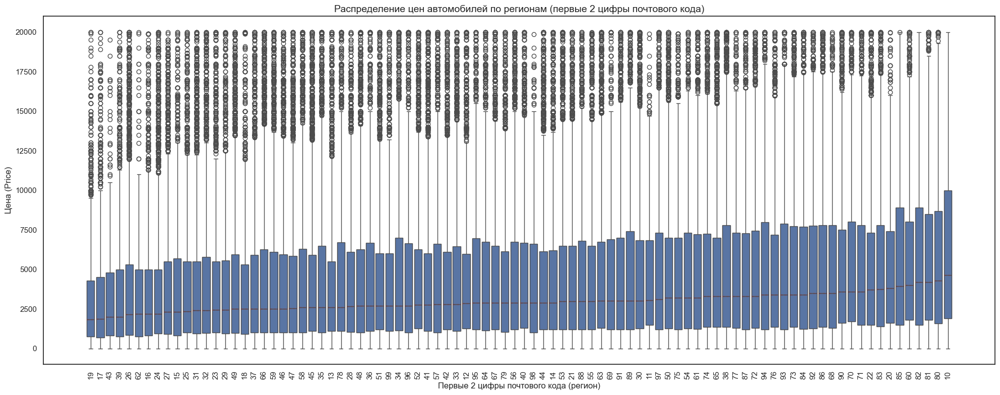

In [60]:
plt.figure(figsize=(20, 8))

# Сортируем регионы по медианной цене для лучшей визуализации
order = autos_df_copy.groupby('PostalRegion')['Price'].median().sort_values().index

# Boxplot с сортировкой по медиане
ax = sns.boxplot(
    x='PostalRegion',
    y='Price',
    data=autos_df_copy,
    order=order,
    #showfliers=False  # Скрываем выбросы для лучшей читаемости
)

plt.title('Распределение цен автомобилей по регионам (первые 2 цифры почтового кода)', fontsize=14)
plt.xlabel('Первые 2 цифры почтового кода (регион)', fontsize=12)
plt.ylabel('Цена (Price)', fontsize=12)
plt.xticks(rotation=90)
#plt.ylim(autos_df_copy['Price'].quantile(0.05), autos_df_copy['Price'].quantile(0.95))  # Ограничиваем диапазон

# Добавляем горизонтальные линии для медианных значений
median_prices = autos_df_copy.groupby('PostalRegion')['Price'].median().sort_values()
for i, region in enumerate(order):
    ax.hlines(median_prices[region], i-0.4, i+0.4, colors='red', linestyles='dashed', linewidth=1)

plt.tight_layout()
plt.show()

Получается признак `PostalRegion` стоит оставить для модели, так как распределение цен от региона заметно меняется и данная вариативность будет вносить свой вклад в предсказательную способность модели.     

In [61]:
# Удаление не информативных и побочных признаков
autos_df_copy = autos_df_copy.drop(
    columns=[
        'DateCrawled', 'RegistrationMonth', 'PostalCode',
        'DateCreated', 'LastSeen', 'NumberOfPictures'
    ]
)

Проверим итоговый датасет на наличие правильных входных признаков и длины

In [62]:
autos_df_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 294108 entries, 0 to 310242
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   Price             294108 non-null  int64 
 1   VehicleType       294108 non-null  object
 2   RegistrationYear  294108 non-null  int64 
 3   Gearbox           294108 non-null  object
 4   Power             294108 non-null  int64 
 5   Model             294108 non-null  object
 6   Kilometer         294108 non-null  int64 
 7   FuelType          294108 non-null  object
 8   Brand             294108 non-null  object
 9   Repaired          294108 non-null  object
 10  First_Year        294108 non-null  int64 
 11  Min_HP            294108 non-null  int64 
 12  Max_HP            294108 non-null  int64 
 13  PostalRegion      294108 non-null  object
dtypes: int64(7), object(7)
memory usage: 33.7+ MB


Да, все верно. Напомню, что в датасете есть дополнительные признаки `First_Year`, `Min_HP`, `Max_HP`, которые пока присутствуют для возможных проверок.

### Обработка дубликатов

Удалим явные и исследуем не явные дубликаты при их наличии.

In [63]:
print(f'Количество явных дубликатов — {autos_df_copy.duplicated().sum()}')

Количество явных дубликатов — 24028


In [64]:
autos_df_copy = autos_df_copy.drop_duplicates()

In [65]:
print(f'Количество явных дубликатов после удаления — {autos_df_copy.duplicated().sum()}')

Количество явных дубликатов после удаления — 0


Для нахождения неявных дубликатов выведем уникальные значения категориальных признаков

In [66]:
# выведем уникальные значения категориальных признаков
{col: autos_df_copy[col].unique() for col in autos_df_copy.select_dtypes(include='object').columns}

{'VehicleType': array(['sedan', 'suv', 'small', 'convertible', 'bus', 'wagon', 'coupe',
        'other'], dtype=object),
 'Gearbox': array(['manual', 'auto'], dtype=object),
 'Model': array(['golf', 'grand', 'fabia', '3er', '2_reihe', 'c_max', '3_reihe',
        'passat', 'navara', 'ka', 'polo', 'twingo', 'a_klasse', 'scirocco',
        '5er', 'arosa', 'civic', 'punto', 'e_klasse', 'clio', 'kadett',
        'kangoo', 'corsa', 'one', 'fortwo', '1er', 'b_klasse', 'signum',
        'astra', 'a8', 'jetta', 'fiesta', 'c_klasse', 'micra', 'vito',
        'sprinter', '156', 'escort', 'forester', 'xc_reihe', 'scenic',
        'a4', 'a1', 'insignia', 'transporter', 'combo', 'focus', 'tt',
        'a6', 'jazz', 'omega', 'slk', '7er', '80', '147', 'meriva',
        'z_reihe', 'sorento', 'v40', 'ibiza', 'mustang', 'eos', 'touran',
        'getz', 'a3', 'almera', 'megane', 'lupo', 'r19', 'mondeo',
        'cordoba', 'colt', 'impreza', 'vectra', 'berlingo', 'tiguan',
        'sharan', '6_reihe', 'c4

В признаке `VehicleType` категория `other` уместна, так как в ней могут быть объединены такие типы как `van`, `pickup`, `hatchback`, которых представлено мало. По той же причине категория `other` уместна и в признаке `FuelType`. Однако нужно отметить, что информация о типе авто и топлива должна влиять и на цену авто — без этой информации погрешность в предсказаниях вероятно будет значительно больше.

In [67]:
# посчитаем количество записей с other
a = (autos_df_copy.query('FuelType=="other" or VehicleType=="other"')['FuelType']).count()
print(f'Количество записей с other — {a}, их доля — {(a/len(autos_df_copy)):.2%}')

Количество записей с other — 1972, их доля — 0.73%


Получается записей с other меньше 1 % от оставшегося объема данных. Поэтому их удаление не должно значительно повлиять на предсказательную способность модели.  

In [68]:
# удалим записи с other
autos_df_copy = autos_df_copy.query('FuelType!="other" and VehicleType!="other"')

In [69]:
# посчитаем количество записей с other после их удаления
a = (autos_df_copy.query('FuelType=="other" or VehicleType=="other"')['FuelType']).count()
print(f'Количество записей с other — {a}')

Количество записей с other — 0


Удаление неизвестных категорий признаков `FuelType` и `VehicleType` прошло успешно.

В признаке `FuelType` наименования `petrol` и `gasoline` означают одно и то же — бензин. `Petrol` — британский вариант, `Gasoline` — американский вариант. Поэтому заменим `gasoline` на `petrol`.

In [70]:
# Заменяем 'gasoline' на 'petrol'
autos_df_copy['FuelType'] = autos_df_copy['FuelType'].replace('gasoline', 'petrol')

Значения в остальных категориальных признаках в норме и без особенностей.

In [71]:
# Расчитаем долю удаленных записей от изначального объема данных
value = 1 - (len(autos_df_copy)/total_count)
print(f'Доля удаленных записей от изначального объема — {value:.3%}')

Доля удаленных записей от изначального объема — 24.342%


Учитывая большой изначальный объем данных порядка 350к, удаление меньше 25 % данных не должно значительно повлиять на предсказательную способность модели.

### Промежуточные выводы

1. Пропуски и записи с категорией `other` в признаке `Model` удалены
2. Пропуски в оставшихся признаках `Gearbox`, `VehicleType`, `FuelType`, `Repaired` обработаны следующим образом:
- для признаков `Gearbox`, `VehicleType` пропуски заменены наиболее часто встречающимся значением для каждой модели машины;
- для признака `FuelType` пропуски заменены наиболее популярным типом топлива для определенного значения признака `VehicleType`;
- пропуски в признаке `Repaired` переименованы на `yes`.
2. Обработаны аномальные и противоречивые значения в признаке `RegistrationYear`: записи по авто с годом регистрации более 2016, и ранее 1990 удалены.
4. Признак `PostalCode` заменен на признак `PostalRegion`, который содержит лишь первые две цифры от значений признака `PostalCode`.
5. Удалены следующие неинформативные признаки: `DateCrawled`, `RegistrationMonth`, `DateCreated`, `LastSeen`, `NumberOfPictures`
6. Удалены явные дубликаты, категории `other` в признаках `FuelType` и `VehicleType`, а также проведена замена неявных дубликатов `gasoline` на `petrol`.
7. По итогам предобработки удалено меньше 25 % данных от изначального объема данных (порядка 350к)

## Исследовательский анализ

### Числовое описание данных

In [72]:
# создадим таблицу с числовым описанием данных
pivot_df = autos_df_copy.describe(include='all')
pivot_df = pivot_df.drop(columns=['First_Year', 'Min_HP', 'Max_HP'])

# добавим рассогласование медианного (medium) и среднего (mean) значений как ((mean-medium)/medium)*100%
# в данном случае берется абсолютная разница (mean-medium) без модуля, чтобы сразу было понятно mean больше или меньше medium
pivot_df.loc['mismatch%'] = ((pivot_df.loc['mean']-pivot_df.loc['50%'])/pivot_df.loc['50%'])*100
# добавим соотношение стандартного отклонения к медианному значению в процентах,
# чтобы оценить разброс и сравнить его для всех количественных признаков, так как они отличаются по масштабу
pivot_df.loc['rel_std%'] = pivot_df.loc['std']/pivot_df.loc['mean']*100
# добавим долю наиболее популярного класса в категориальных признаках в процентах,
# чтобы оценить дисбаланс целевого класса
pivot_df.loc['cat_top_ratio%'] = pivot_df.loc['freq']/pivot_df.loc['count']*100

# преобразуем в HTML
styled_table = pivot_df.round(2).T.to_html()

print('\033[1mЧисловое описание данных autos_df_copy\033[0m')
HTML(styled_table)

Числовое описание данных autos_df_copy


,count,unique,top,freq,mean,std,min,25%,50%,75%,max,mismatch%,rel_std%,cat_top_ratio%
Price,268108.0,NaN,NaN,NaN,4554.71,4554.53,0.0,1150.0,2899.0,6580.75,20000.0,57.11,100.0,NaN
VehicleType,268108,7,sedan,80852,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,30.156504
RegistrationYear,268108.0,NaN,NaN,NaN,2003.32,5.53,1990.0,1999.0,2003.0,2007.0,2016.0,0.02,0.28,NaN
Gearbox,268108,2,manual,215862,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,80.513077
Power,268108.0,NaN,NaN,NaN,112.49,188.4,0.0,73.0,105.0,143.0,20000.0,7.13,167.49,NaN
Model,268108,246,golf,24318,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.070225
Kilometer,268108.0,NaN,NaN,NaN,129039.64,36620.54,5000.0,125000.0,150000.0,150000.0,150000.0,-13.97,28.38,NaN
FuelType,268108,5,petrol,263711,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,98.359989
Brand,268108,39,volkswagen,60993,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22.749414
Repaired,268108,2,no,193383,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,72.128769


**Промежутоные выводы по числовому описанию**

1. В числовых признаках `Price` и `Power` есть нулевые значения, что является аномальным. Кроме этого аномальным является и максимальное значение мощности — 20000 л.с. Также на наличие аномальных значений указывает различия в средних и медианных значениях данных признаков. Эти признаки стоит детальнее исследовать.
2. Количественные признаки согласно значениям `rel_std%` имеют достаточно широкий разброс, что сыграет положительную роль для обобщающей способности модели.
3. Мы наблюдаем явный дисбаланс классов у признаков `Gearbox`, `Repaired`, `FuelType`, что потребуется учесть при разделении датасета на выборки, сохранив соотношения классов в этих признаках, для улучшения обобщающей способности модели.

Исследуем аномальные значения в признаках `Price` и `Power`. Построим гистограмму и диаграмму размаха.

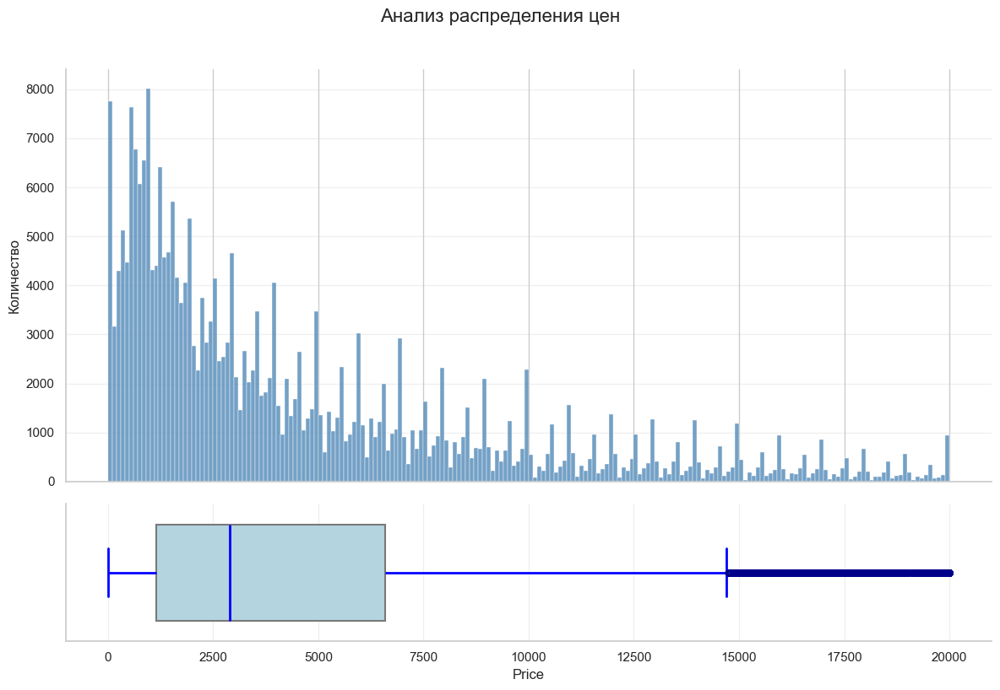

In [73]:
plot_distributions(
         data=autos_df_copy,
         column='Price',
         hist_bins=200,
         title='Анализ распределения цен'
     )

При таком количестве корзин одна корзина имеет ширину 100 евро. Мы наблюдаем, что вблизи нуля самая первая корзина содержит в себе много записей. Рассмотрим ее детальнее.

In [74]:
autos_df_copy[autos_df_copy['Price']<100].describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Price,7760.0,NaN,NaN,NaN,6.485825,19.717193,0.0,0.0,0.0,0.0,99.0
VehicleType,7760,7,sedan,2423,NaN,NaN,NaN,NaN,NaN,NaN,NaN
RegistrationYear,7760.0,NaN,NaN,NaN,2000.892526,6.316566,1990.0,1997.0,2000.0,2004.0,2016.0
Gearbox,7760,2,manual,6598,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Power,7760.0,NaN,NaN,NaN,83.516753,238.965912,0.0,0.0,75.0,122.0,15016.0
Model,7760,220,golf,802,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Kilometer,7760.0,NaN,NaN,NaN,126963.917526,46434.503896,5000.0,125000.0,150000.0,150000.0,150000.0
FuelType,7760,5,petrol,7653,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Brand,7760,39,volkswagen,1932,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Repaired,7760,2,yes,5393,NaN,NaN,NaN,NaN,NaN,NaN,NaN


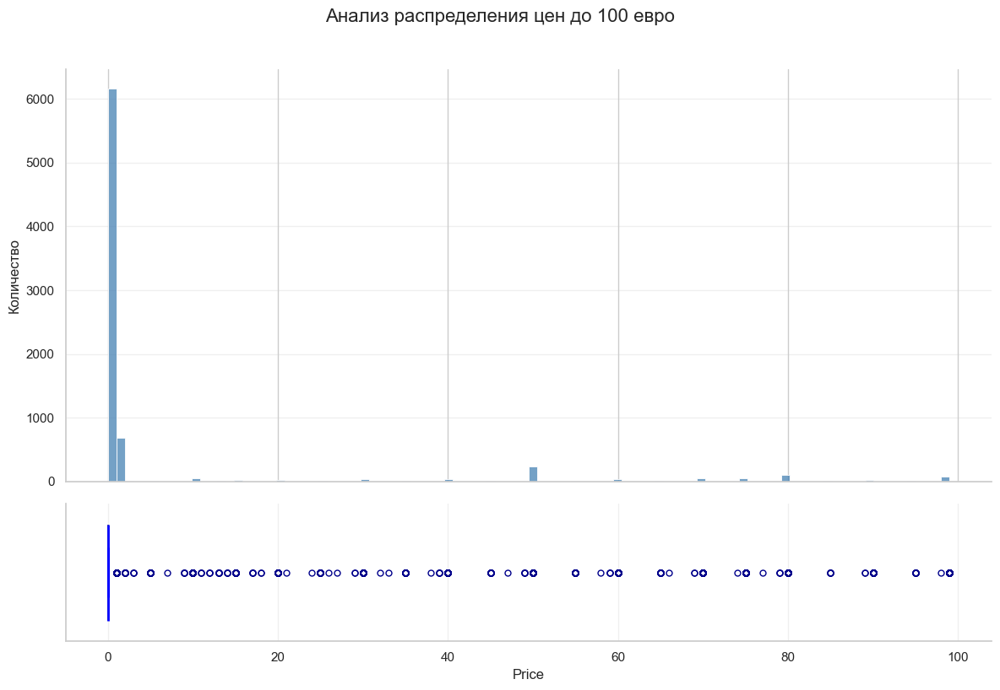

In [75]:
plot_distributions(
         data=autos_df_copy[autos_df_copy['Price']<100],
         column='Price',
         hist_bins=100,
         title='Анализ распределения цен до 100 евро'
     )

В основном для записей с ценой меньше 100 евро машины бесплатны, с ремонтом, имеют пробег в среднем 127К. Согласно GPT (столбец `First_Year`) преимущественно машины созданы в 20 веке. Опять же мы имеем дело с некоторой категорией машин, которые выделяются по цене в меньшую сторону от общей массы. Безусловно это не типичный случай. Такая категория по характеристикам похожа на машины, которые нужно утилизировать, но из-за стоимости утилизации больше, чем цена машины, владельцы предлагают их за даром. Чтобы не "мешать" их с типичными машинами и не "путать" модель, предлагается удалить записи машин с ценой меньше 100 евро.

In [76]:
# удаляем машины с ценой меньше 100 евро
autos_df_copy = autos_df_copy[autos_df_copy['Price']>=100]

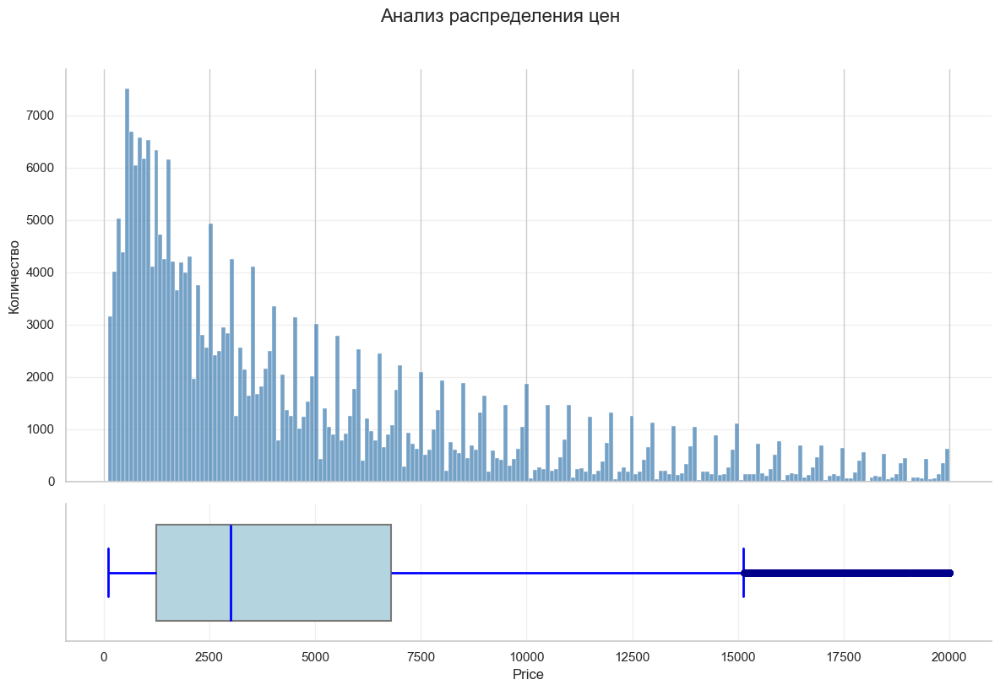

In [77]:
plot_distributions(
         data=autos_df_copy,
         column='Price',
         hist_bins=200,
         title='Анализ распределения цен'
     )

Теперь для цен машин нет аномальных значений. Перейдем к исследованию распределения мощности

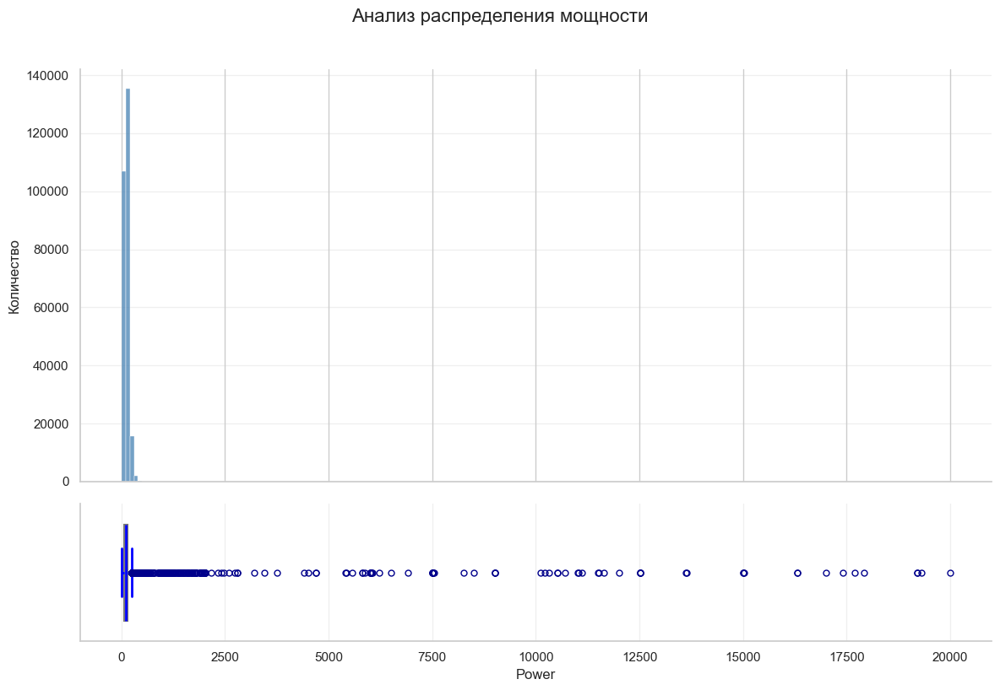

In [78]:
plot_distributions(
         data=autos_df_copy,
         column='Power',
         hist_bins=200,
         title='Анализ распределения мощности'
     )

Присутствуют нереалистичные значения мощности для серийных легковых автомобилей.

Категория авто и типичная мощность:

- Городские малолитражки:	50-120 л.с.
- Средний класс:	100-300 л.с.
- Премиум-сегмент:	200-600 л.с.
- Спортивные авто:	400-800 л.с.
- Гиперкары	до: 1500-1800 л.с.

Исследуем авто с нулевым значением мощности

In [79]:
len_no_power = autos_df_copy.query('Power==0')['Power'].count()
ratio = len_no_power/len(autos_df_copy)
print(f'''Количество авто с нулевой мощностью {len_no_power} шт,
что составляет {ratio:.3%} от всех данных''')

Количество авто с нулевой мощностью 22406 шт,
что составляет 8.606% от всех данных


Рассмотрим как отличаются распределения цен на авто с 0-ой и не 0-ой мощностью.

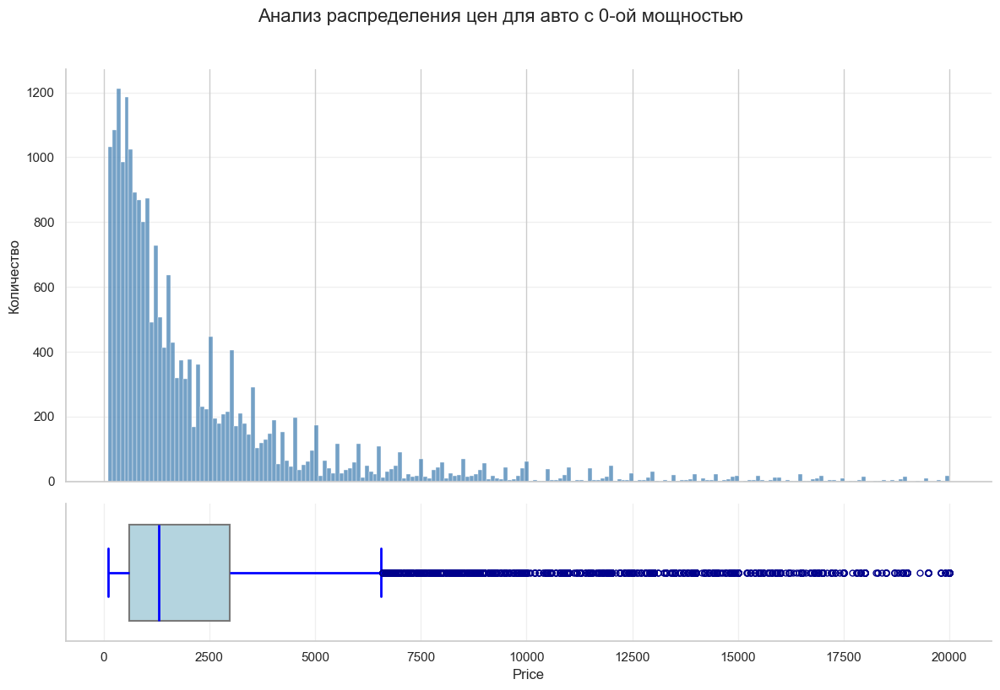

In [80]:
plot_distributions(
         data=autos_df_copy.query('Power==0'),
         column='Price',
         hist_bins=200,
         title='Анализ распределения цен для авто с 0-ой мощностью'
     )

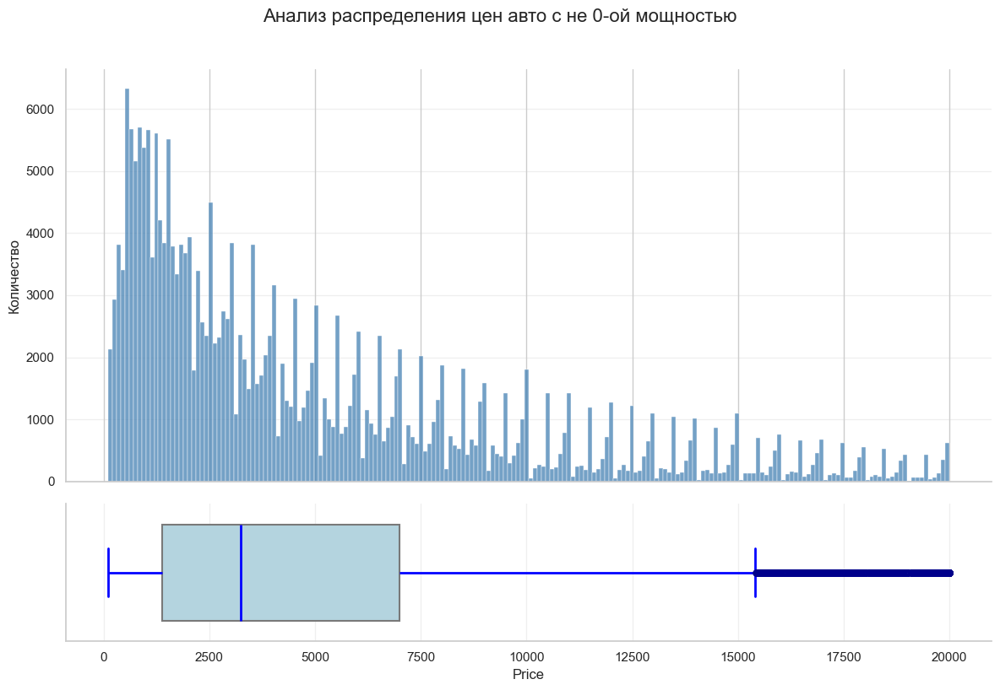

In [81]:
plot_distributions(
         data=autos_df_copy.query('Power!=0'),
         column='Price',
         hist_bins=200,
         title='Анализ распределения цен авто с не 0-ой мощностью'
     )

Заметно, что распределение цен на авто с не 0-ой мощностью смещено в сторону больших значений относительно распределения цен на авто с 0-ой мощностью и имеет медианное значение на уровне 3000 евро против 1300 евро для другой категории. С целью сделать анализ более детальным, оценим разницу в цене по моделям авто.  

In [82]:
# сделаем агрегации по медианным значениям цен для каждой модели:
# для группы с 0-ой мощностью
no_power = autos_df_copy.query('Power==0').groupby(['Brand','Model'])[['Price']].agg('median')
# для группы с не 0-ой мощностью
is_power = autos_df_copy.query('Power!=0').groupby(['Brand','Model'])[['Price']].agg('median')
# получим отношения 
comparison = is_power/no_power

In [83]:
price_ratio = comparison[comparison['Price']>1]['Price'].median()
model_ratio = (comparison['Price']>1).sum()/len(comparison)

print(f'''Доля моделей, в которых авто с не 0-ой мощностью
стоят дороже: {model_ratio:.3%};
Дороже преимущественно в {price_ratio:.3f} раза''')

Доля моделей, в которых авто с не 0-ой мощностью
стоят дороже: 89.804%;
Дороже преимущественно в 1.584 раза


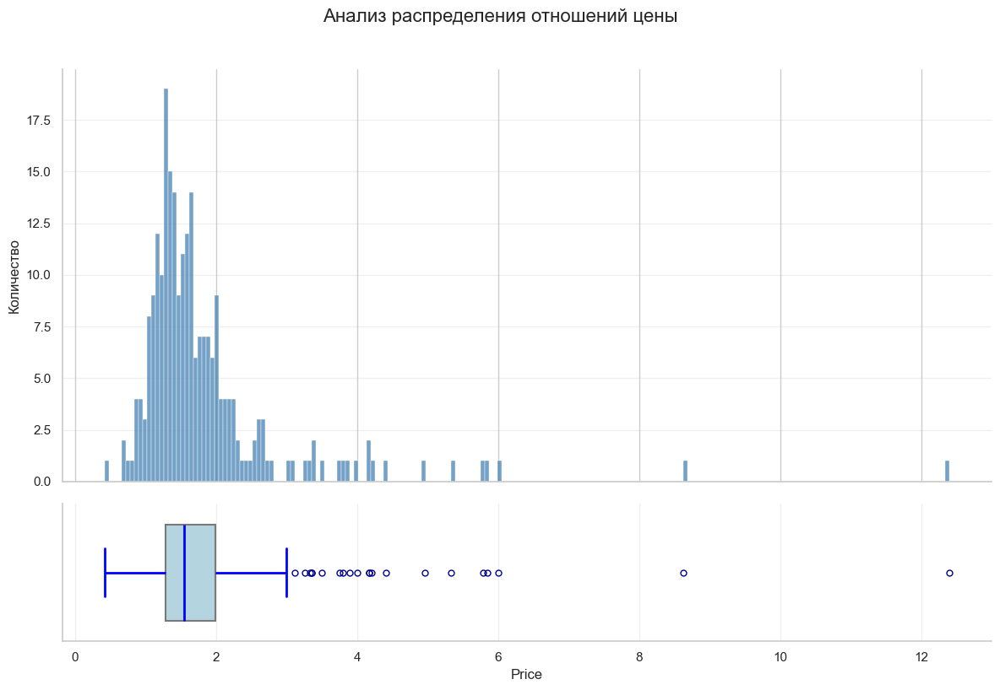

In [84]:
plot_distributions(
         data=comparison,
         column='Price',
         hist_bins=200,
         title='Анализ распределения отношений цены'
     )

По графику видно, что медианное значение отношения цен для авто с не 0-ой к 0-ой мощности для каждой модели, как раз находится в районе 1.6. Отсюда первая гипотеза — машины с не 0-ой мощностью дороже.

Исследуем различия в распределениях по пробегу.

In [85]:
test = autos_df_copy[['Power', 'Price', 'Kilometer']].copy()

In [86]:
# Добавляем новый столбец 'no_power'
test['no_power'] = test['Power'].apply(lambda x: 'yes' if x == 0 else 'no')

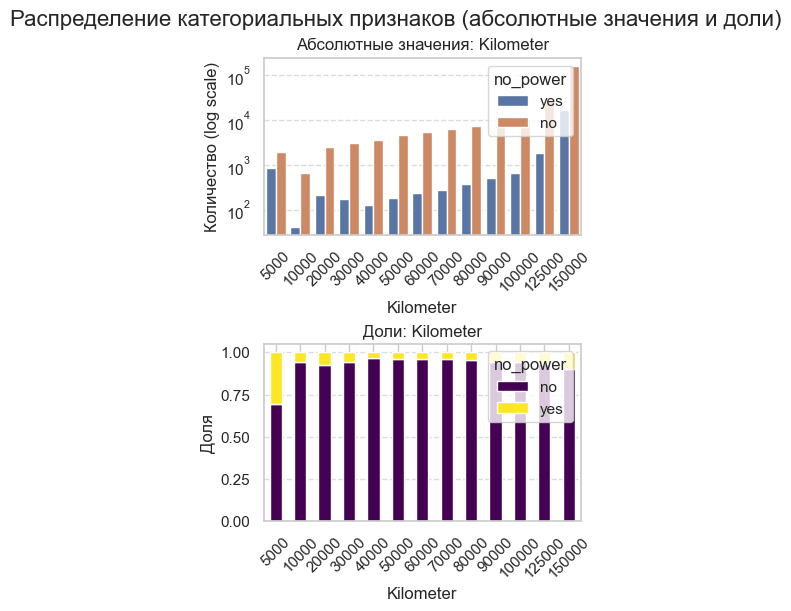

In [87]:
plot_categorical_distributions(
    test,
    'no_power',
    ['Kilometer'],
    log_scale=True,
    ncols=1
)

Если не учитывать область для пробега 5000 км, которая имеет маленькую выборку (будем считать ее нерепрезентативной), то можно заметить, что доля машин с нулевой мощностью растет с увеличением пробега или по другому количество машин с нулевой мощностью более резко растет с увеличением пробега. Отсюда можно выдвинуть вторую гипотезу, что машины с 0-ой мощностью сконцентрированы в бОльшей степени в области большого пробега, чем машины с не 0-ой мощностью, распределение по абсолютным значением которых более плавное.

Получается можно выделить отдельный класс машин с нулевой мощностью, которые выделяются по цене (в меньшую сторону) и пробегу (в большую сторону) . Если накладывать на эти гипотезы реальность, то можно предположить, что этот класс машин относится к машинам, которые без двигателя. В любом случае их можно вынести отдельно и оставить с 0-ой мощностью, либо удалить, так как их 8.6% среди 260348 шт, что не должно сильно сказаться на качестве модели. **Воспользуемся первым вариантом чтобы не уменьшать объем данных.**

Ранее мы уже добавляли в датасет столбцы с минимально и максимально возможными значениями мощности для каждой модели авто, подготовленными GPT [(Перейти)](#2). Теперь воспользуемся ими для правки аномальных значений.

In [88]:
%%time
# Объединенная векторизованная замена через np.where
autos_df_copy['Power'] = np.where(
    # Проверяем, существует ли Min_HP и (Power!=0) < Min_HP
    (autos_df_copy['Min_HP'].notna()) &
    (autos_df_copy['Power']!=0) &
    (autos_df_copy['Power'] < autos_df_copy['Min_HP']),

    # Если да — меняем на Min_HP
    autos_df_copy['Min_HP'],

    np.where(
        # Проверяем, существует ли Max_HP и Power > Max_HP
        (autos_df_copy['Max_HP'].notna()) &
        (autos_df_copy['Power'] > autos_df_copy['Max_HP']),

        # Если да — меняем на Max_HP
        autos_df_copy['Max_HP'],

        # Иначе оставляем как есть
        autos_df_copy['Power']
    )
)

CPU times: total: 0 ns
Wall time: 5.69 ms


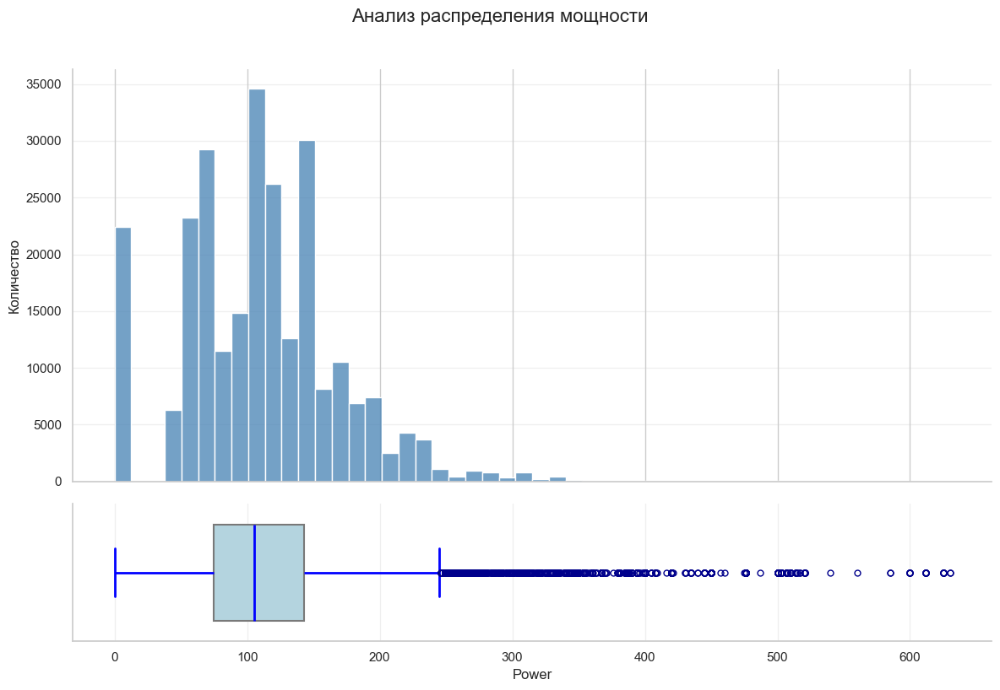

In [89]:
plot_distributions(
         data=autos_df_copy,
         column='Power',
         hist_bins=50,
         title='Анализ распределения мощности'
     )

Теперь распределение мощности выглядит реалистичным и машины с 0-ой мощностью на месте.

In [90]:
# Удаляем дополнительные столбцы для проверок
autos_df_copy = autos_df_copy.drop(columns=['First_Year', 'Min_HP', 'Max_HP'])

In [91]:
autos_df_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 260348 entries, 0 to 310242
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   Price             260348 non-null  int64 
 1   VehicleType       260348 non-null  object
 2   RegistrationYear  260348 non-null  int64 
 3   Gearbox           260348 non-null  object
 4   Power             260348 non-null  int64 
 5   Model             260348 non-null  object
 6   Kilometer         260348 non-null  int64 
 7   FuelType          260348 non-null  object
 8   Brand             260348 non-null  object
 9   Repaired          260348 non-null  object
 10  PostalRegion      260348 non-null  object
dtypes: int64(4), object(7)
memory usage: 23.8+ MB


Столбцы, требуемые для различных проверок, удалены.

**Промежутоные выводы по исследованию аномальных значений признаков `Price` и `Power`**

1. Записи с ценой машин меньше 100 евро удалены.
2. Записи с 0-ой мощностью оставлены без изменений значений в признаке `Power`. 
3. Аномальные значения в признаке `Power` приведены в норму согласно общеизвестным данным: аномально низкие значения заменены на минимально допустимые, а аномально высокие — на максимально допустимые.

### Исследовательский анализ

Графики выше демонстрируют распределения бинарных признаков `Repaired` и `Gearbox` и по целевому признаку `Price` в зависимости от значений остальных категориальных признаков и дискретного числового `Kilometer`.

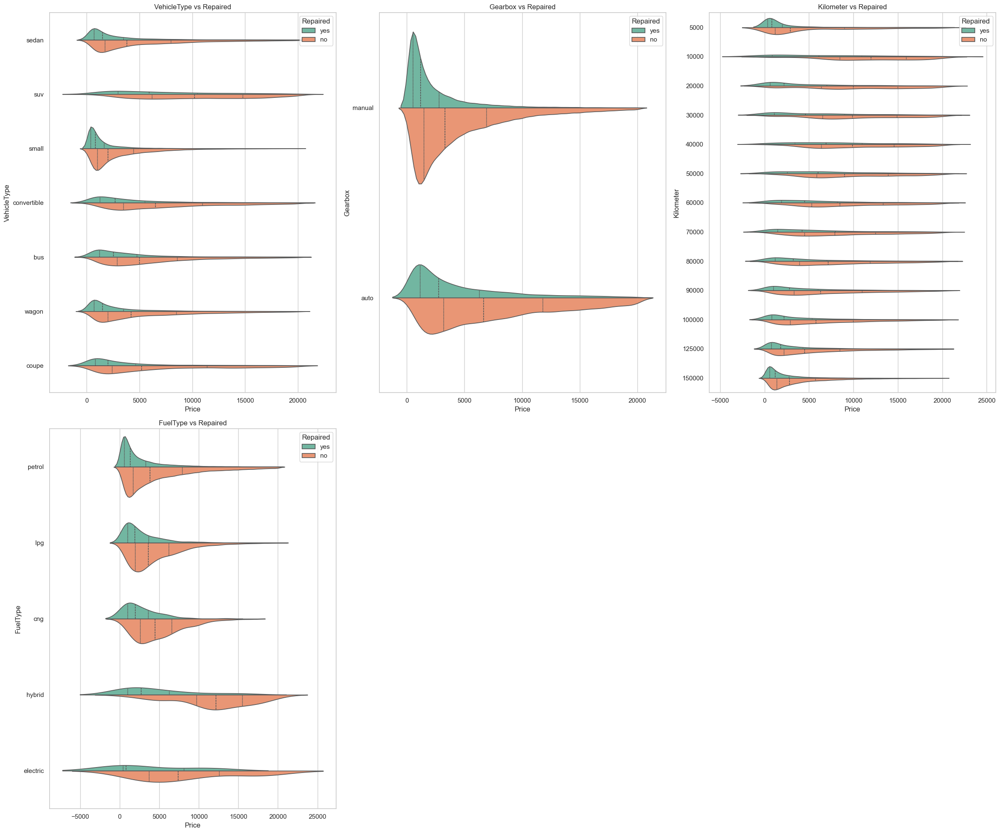

In [92]:
plot_violin_combinations(
    autos_df_copy,
    x_column='Price',
    y_features=[
        'VehicleType', 'Gearbox',
        'Kilometer', 'FuelType'
    ],
    hue_features=['Repaired'],
    figsize_per_plot=(8, 10),
    log_scale_x=False
)

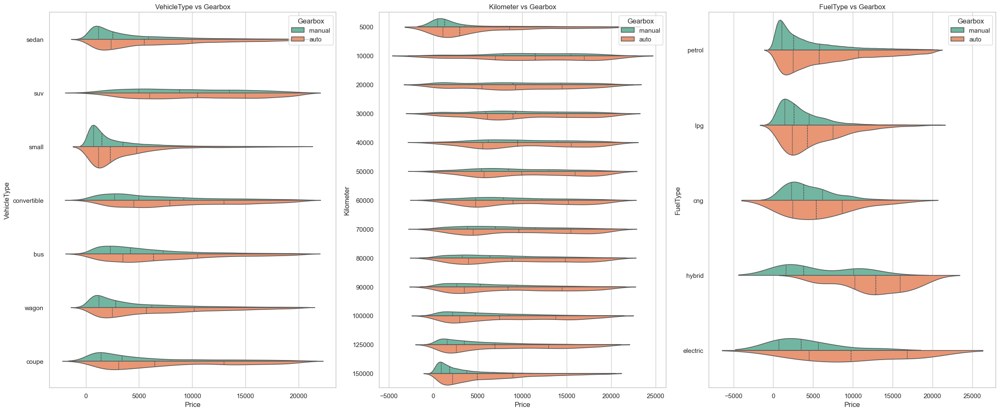

In [93]:
plot_violin_combinations(
    autos_df_copy,
    x_column='Price',
    y_features=[
        'VehicleType', 'Kilometer',
        'FuelType'
    ],
    hue_features=['Gearbox'],
    figsize_per_plot=(8, 10),
    log_scale_x=False
)

Ключевой момент — наличие различий в распределениях, что указывает на важность признаков.

Ниже представлены некоторые рейтинги на основе данных: Топ-5 по доле ремонта для признаков `Model`, `Brand `, `PostalRegion`, Топ-5 по надежности для тех же признаков.  

In [94]:
# Список признаков для анализа
features = ['Model', 'Brand', 'PostalRegion']

# Минимальное количество записей для включения в анализ
min_samples = 100

for feature in features:
    # Считаем общее количество для каждого значения признака
    total_counts = autos_df_copy[feature].value_counts()

    # Фильтруем только те, у которых >= min_samples записей
    valid_values = total_counts[total_counts >= min_samples].index

    # Отбираем данные только по этим значениям
    filtered_data = autos_df_copy[autos_df_copy[feature].isin(valid_values)]

    # Считаем количество ремонтированных среди отфильтрованных данных
    repaired_counts = filtered_data[filtered_data['Repaired'] == 'yes'][feature].value_counts()

    # Вычисляем долю ремонтированных (только для значений с достаточным количеством данных)
    ratio = (repaired_counts / total_counts[valid_values]).sort_values(ascending=False).head(5)

    # Создаем DataFrame для удобного вывода
    result_df = pd.DataFrame({
        'Доля ремонта': ratio,
        'Количество ремонтов': repaired_counts[ratio.index],
        'Общее количество': total_counts[ratio.index]
    })

    print(f"\nТоп-5 по доле ремонта для признака {feature} (только категории с ≥{min_samples} записями):")
    display(result_df)


Топ-5 по доле ремонта для признака Model (только категории с ≥100 записями):


,Доля ремонта,Количество ремонтов,Общее количество
Model,,,
escort,0.527166,359,681
omega,0.446037,529,1186
80,0.442907,512,1156
espace,0.441118,221,501
justy,0.436508,55,126



Топ-5 по доле ремонта для признака Brand (только категории с ≥100 записями):


,Доля ремонта,Количество ремонтов,Общее количество
Brand,,,
daewoo,0.384393,133,346
lancia,0.365517,106,290
subaru,0.346021,200,578
daihatsu,0.344891,189,548
renault,0.335952,4533,13493



Топ-5 по доле ремонта для признака PostalRegion (только категории с ≥100 записями):


,Доля ремонта,Количество ремонтов,Общее количество
PostalRegion,,,
26,0.319645,1767,5528
62,0.317647,108,340
29,0.311891,640,2052
47,0.310980,1419,4563
27,0.310384,1091,3515


In [95]:
# Список признаков для анализа
features = ['Model', 'Brand', 'PostalRegion']

# Минимальное количество записей для включения в анализ
min_samples = 100

for feature in features:
    # Считаем общее количество для каждого значения признака
    total_counts = autos_df_copy[feature].value_counts()

    # Фильтруем только те, у которых >= min_samples записей
    valid_values = total_counts[total_counts >= min_samples].index

    # Отбираем данные только по этим значениям
    filtered_data = autos_df_copy[autos_df_copy[feature].isin(valid_values)]

    # Считаем количество ремонтированных среди отфильтрованных данных
    repaired_counts = filtered_data[filtered_data['Repaired'] == 'yes'][feature].value_counts()

    # Вычисляем долю ремонтированных (только для значений с достаточным количеством данных)
    ratio = (repaired_counts / total_counts[valid_values]).sort_values().head(5)  # sort_values() без параметров даст по возрастанию

    # Создаем DataFrame для удобного вывода
    result_df = pd.DataFrame({
        'Доля ремонта': ratio,
        'Количество ремонтов': repaired_counts[ratio.index],
        'Общее количество': total_counts[ratio.index]
    })

    print(f"\nТоп-5 по надежности для признака {feature} (только категории с ≥{min_samples} записями):")
    display(result_df)


Топ-5 по надежности для признака Model (только категории с ≥100 записями):


,Доля ремонта,Количество ремонтов,Общее количество
Model,,,
yeti,0.064103,10,156
a1,0.071429,38,532
clubman,0.084848,14,165
z_reihe,0.085758,56,653
eos,0.088745,41,462



Топ-5 по надежности для признака Brand (только категории с ≥100 записями):


,Доля ремонта,Количество ремонтов,Общее количество
Brand,,,
mini,0.123112,326,2648
hyundai,0.157407,306,1944
porsche,0.170354,77,452
dacia,0.171731,130,757
skoda,0.178912,806,4505



Топ-5 по надежности для признака PostalRegion (только категории с ≥100 записями):


,Доля ремонта,Количество ремонтов,Общее количество
PostalRegion,,,
90,0.197023,556,2822
70,0.198782,359,1806
80,0.210000,378,1800
85,0.212286,781,3679
76,0.213992,572,2673


Различия в доли ремонта для топ по надежности (минимум доли ремонта) и по доли ремонта (максимум доли ремонта) в зависимости от исследуемых признаков примерно в 1.5—4 раза говорит о разбросе в данных, который сыграет свою роль в обобщающей способности модели.

Ниже представлена диграмма рассеяния для признаков `Price`-`Power` в зависимости от класса `Repaired` для каждого значения признака `VehicleType`.

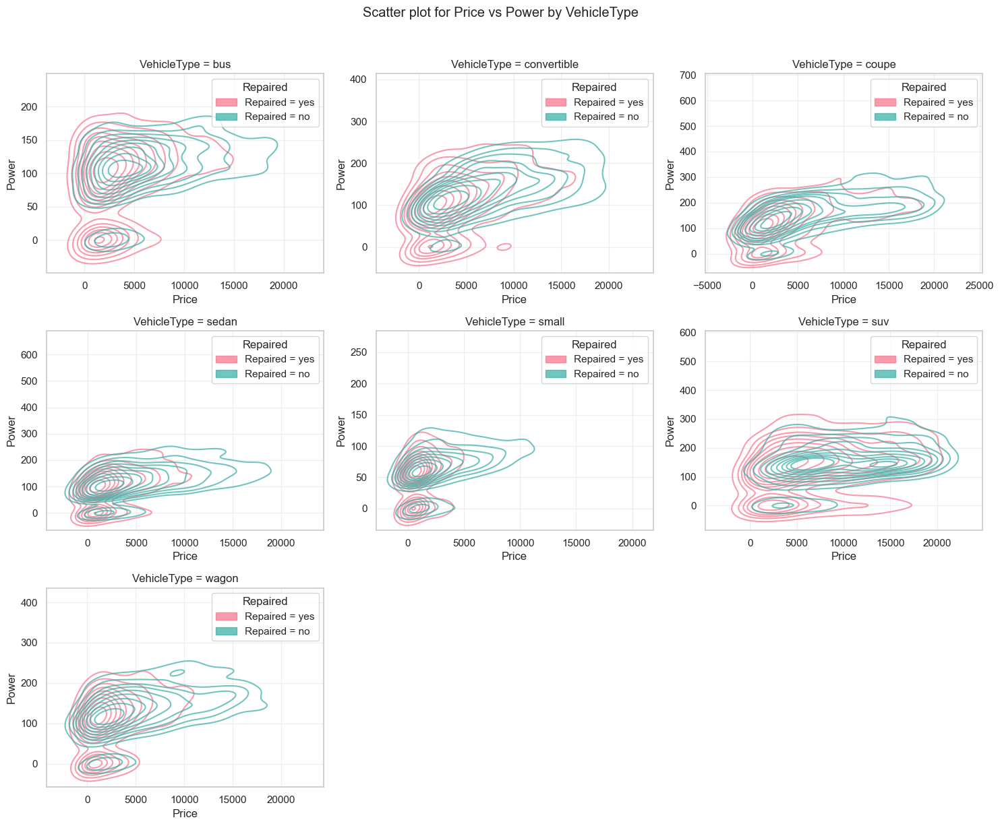

In [96]:
plot_features_by_class(
    autos_df_copy,
    'Repaired',
    features=['Price', 'Power'],
    facet_by='VehicleType',
    plot_type='kde',
    kde_alpha=0.7,
    kde_levels=10,
    scatter_alpha=1,
    facet_col_wrap=3
)

Данные диаграммы наглядно демонстрируют, что для большинства типов машин `VehicleType` машины с ремонтом стоят преимущественно дешевле.

In [97]:
# Находим топ-10 самых мощных автомобилей
top_10_powerful = autos_df_copy.nlargest(10, 'Power')

# Выводим всю информацию о них
top_10_powerful

,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,FuelType,Brand,Repaired,PostalRegion
117974,9999,coupe,1990,auto,630,s_klasse,150000,petrol,mercedes_benz,yes,71
216766,2000,sedan,1997,auto,630,a8,150000,petrol,audi,yes,10
16783,9750,wagon,2005,auto,625,5er,150000,petrol,bmw,no,21
115929,2100,wagon,2001,manual,625,5er,150000,petrol,bmw,yes,59
171898,6000,wagon,2004,auto,625,5er,150000,petrol,bmw,no,26
175721,1400,sedan,1998,manual,625,5er,150000,petrol,bmw,yes,39
261824,1500,wagon,1997,manual,625,5er,150000,petrol,bmw,no,21
269778,3300,sedan,2001,auto,625,5er,150000,petrol,bmw,no,45
272530,11900,wagon,2007,auto,625,5er,150000,petrol,bmw,no,33
17611,2200,sedan,2002,auto,612,e_klasse,150000,petrol,mercedes_benz,yes,31


Что касается самых мощных машин, то в топ-10 входят три модели: `mercedes_benz s_klasse`, `audi a8` и `mercedes_benz e_klasse`.

Далее представлено распределение числовых признаков в зависимости от значений бинарных, которые визуализируют разницу для их классов.

Для признака 'Price' автоматически выбрано 115 корзин
Для признака 'RegistrationYear' автоматически выбрано 104 корзин
Для признака 'Power' автоматически выбрано 296 корзин


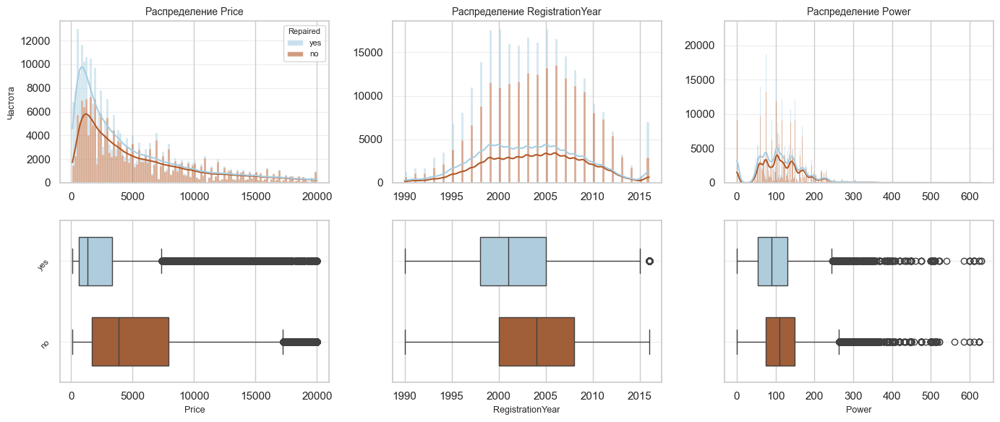

In [98]:
features = [
    ('Price', 'Price'),
    ('RegistrationYear', 'RegistrationYear'),
    ('Power', 'Power')
]

plot_distribution_with_boxplot(autos_df_copy, features, 'Repaired', category_order=['yes', 'no'], auto_bins=True)

Для признака 'Price' автоматически выбрано 115 корзин
Для признака 'RegistrationYear' автоматически выбрано 104 корзин
Для признака 'Power' автоматически выбрано 296 корзин


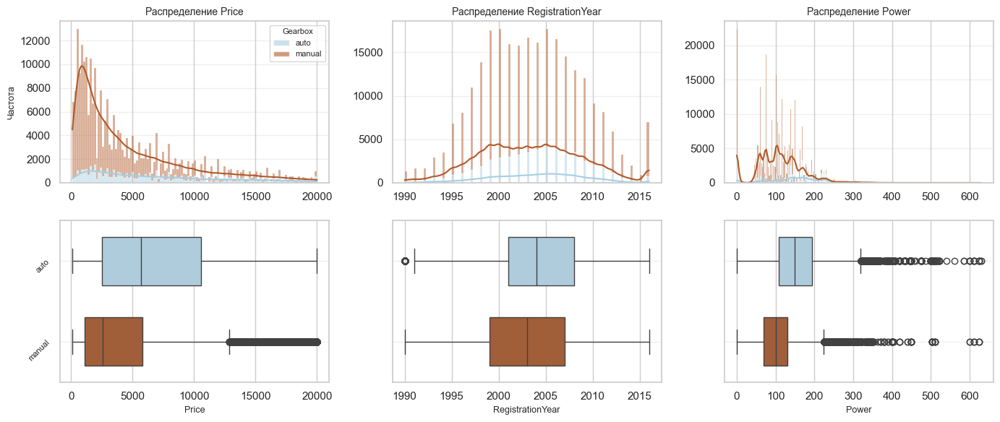

In [99]:
plot_distribution_with_boxplot(autos_df_copy, features, 'Gearbox', auto_bins=True)

В завершении продемонстрирована разница распределений категориальных признаков в зависимости от значений бинарных.

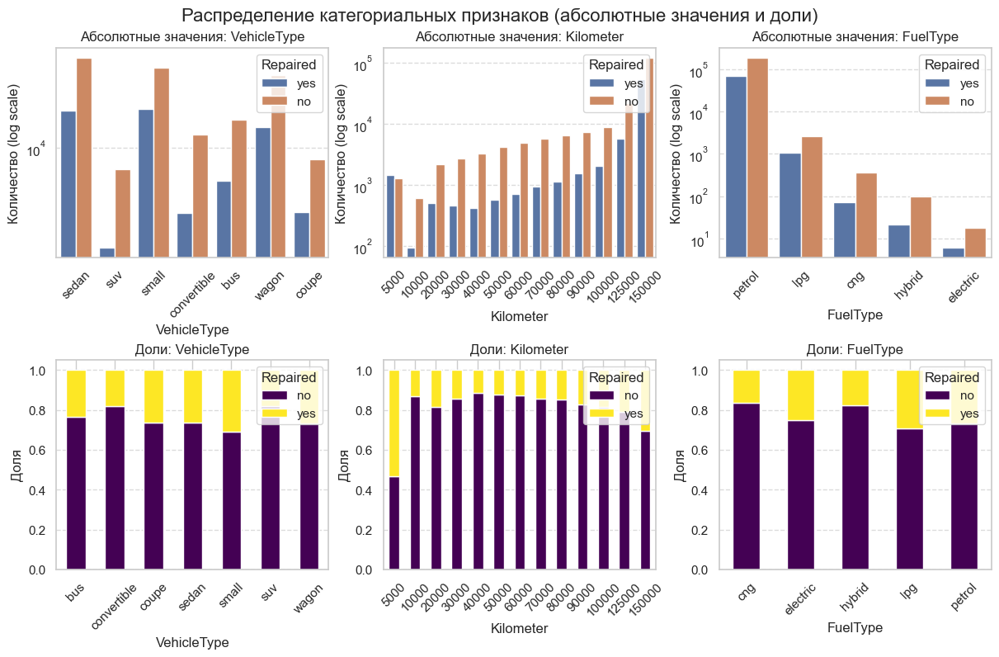

In [100]:
plot_categorical_distributions(autos_df_copy, 'Repaired', ['VehicleType', 'Kilometer', 'FuelType'], log_scale=True)

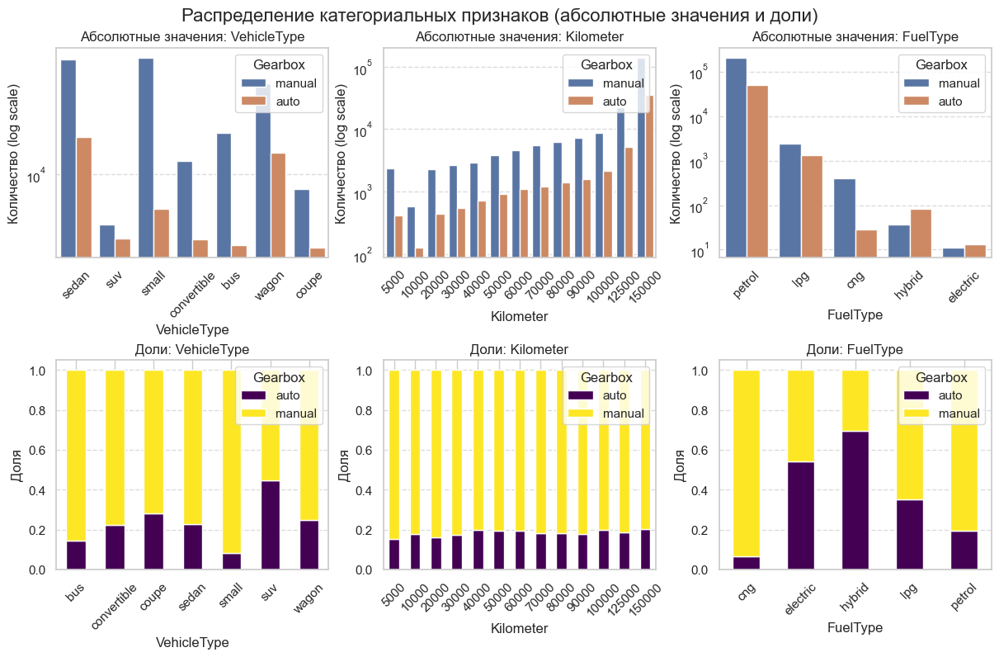

In [101]:
plot_categorical_distributions(autos_df_copy, 'Gearbox', ['VehicleType', 'Kilometer', 'FuelType'], log_scale=True)

Ключевой вывод исследовательского анализа — наблюдаются различия по признакам для большинства распределений, что однозначно благоприятным образом скажется на предсказательной способности модели.

## Корреляционный анализ

Проведем корреляционный анализ признаков в датафрейме `autos_df_copy` для моделирования. Будем рассчитывать Phik-коэффициенты, так как планируется обучать в числе прочего нелинейные модели. Такой метод является универсальным и подходит для любых типов данных: числовых, категориальных или их сочетания. Поэтому будем рассчитывать Phik-коэффициенты для всех признаков датафрейма.

Используем созданную функцию для построения матрицы корреляции Phik и датафрейма с отсортированными строками по значению коэффициента по убыванию, но превышающему порог, устанавливаемый пользователем. Будем считать, что присутствует мультиколлинеарность, если хотя бы у одной пары признаков коэффициент Phik будет больше или равен 0.9. В качестве порога в функции выберем 0.9, чтобы можно было бы сразу вывести пары признаков с мультиколлинеарностью.

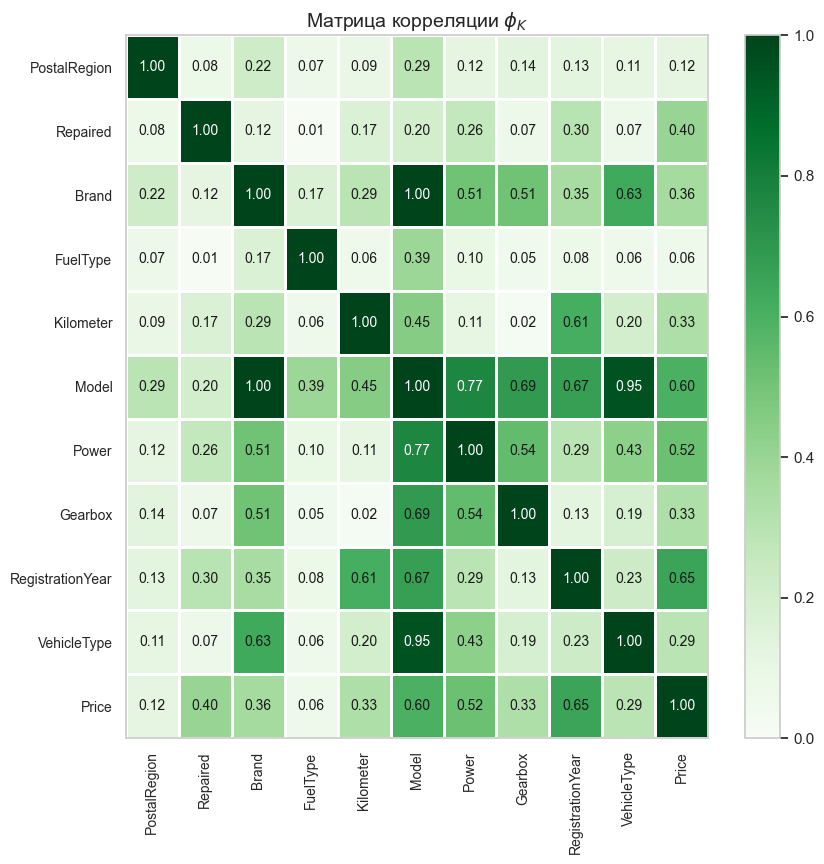

CPU times: total: 2.53 s
Wall time: 5.21 s


In [102]:
%%time
# рассчитаем матрицу корреляции Phik
# присвоем переменной correlated_pairs датафрейм с парами признаков и их корреляцией Фи
# присвоем переменной threshold пороговое значение
# присвоем переменной interval_cols список названий всех столбцов с числовым непрерывным типом данных в обрабатываемом датафрейме
# присвоем переменной phi_k_with_target корреляции признаков с целевой переменной
result = phik_correlation_matrix(
    autos_df_copy,
    threshold = 0.9,
    output_interval_cols=True,
    #interval_cols=['Price', 'RegistrationYear', 'Power', 'Kilometer'],
    target_col='Price'
)

# Результаты:
correlated_pairs = result[0]  # Пары коррелирующих признаков
interval_cols = result[1]     # Список числовых непрерывных столбцов
phi_k_with_target = result[2] # Корреляции признаков с целевой переменной

In [103]:
interval_cols

['Price', 'Power']

In [104]:
autos_df_copy['RegistrationYear'].nunique()

27

In [105]:
autos_df_copy['Kilometer'].nunique()

13

In [106]:
correlated_pairs

,признак_1,признак_2,корреляция,класс_корреляции
0,Model,Brand,1.00,Очень высокая
1,VehicleType,Model,0.95,Очень высокая


Наблюдается мультиколлинеарность для двух пар признаков: `Model`-`Brand`, `VehicleType`-`Model`. Мультиколлинеарность первой пары можно избежать, если создать новый признак `brand_model` на их основе. Что касается второй пары, то так или инчае модель машины может быть представлена в разном кузове, а следовательно и цена будет от этого зависеть. Поэтому оставим эти признаки в таком виде.

In [107]:
# Создаем новый признак brand_model
autos_df_copy['brand_model'] = autos_df_copy['Brand'] + '_' + autos_df_copy['Model']

In [108]:
# Удаляем признаки Brand, Model
autos_df_copy = autos_df_copy.drop(columns=['Brand', 'Model'])

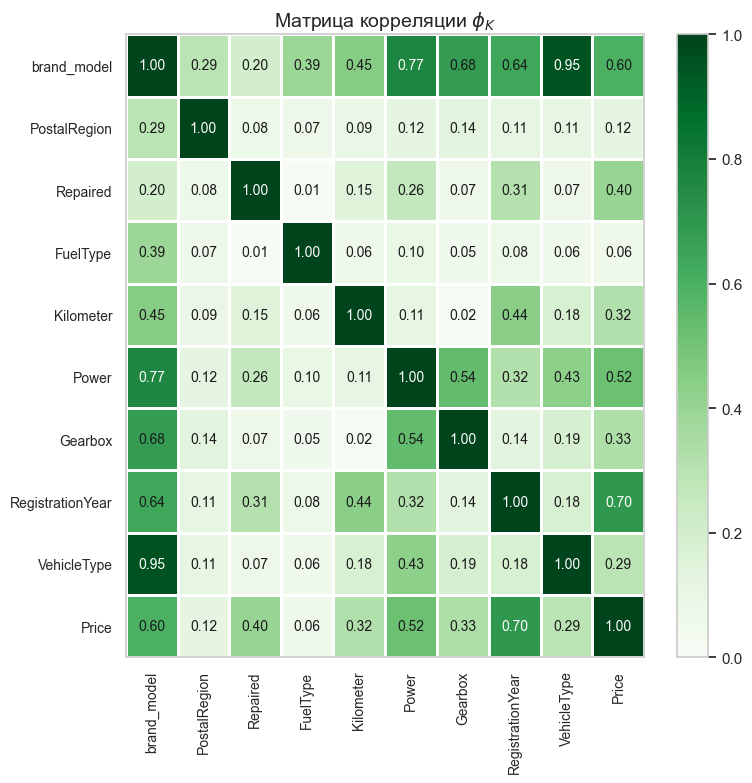

CPU times: total: 2.38 s
Wall time: 2.84 s


In [109]:
%%time
# рассчитаем матрицу корреляции Phik
# присвоем переменной correlated_pairs датафрейм с парами признаков и их корреляцией Фи
# присвоем переменной threshold пороговое значение
# присвоем переменной interval_cols список названий всех столбцов с числовым непрерывным типом данных в обрабатываемом датафрейме
# присвоем переменной phi_k_with_target корреляции признаков с целевой переменной
result = phik_correlation_matrix(
    autos_df_copy,
    threshold = 0.9,
    output_interval_cols=True,
    interval_cols=['Price', 'RegistrationYear', 'Power', 'Kilometer'],
    target_col='Price')

# Результаты:
correlated_pairs = result[0]  # Пары коррелирующих признаков
interval_cols = result[1]     # Список числовых непрерывных столбцов
phi_k_with_target = result[2] # Корреляции признаков с целевой переменной

In [110]:
correlated_pairs

,признак_1,признак_2,корреляция,класс_корреляции
0,VehicleType,brand_model,0.95,Очень высокая


Теперь рассчитаем коэффициент инфляции дисперсии, чтобы выявить избыточность в данных и улучшить устойчивость модели.

**Коэффициент инфляции дисперсии (variance inflation factor — VIF)** измеряет насколько сильно дисперсия коэффициента регрессии увеличивается из-за мультиколлинеарности (корреляции с другими признаками). Различают следующие категории мультиколлинеарности по значению VIF:
- вблизи 1 — отсутствует или пренебрежимо слабая;
- больше 5–10 — умеренная или сильная (требует внимания);
- больше 100 — критическая (модель ненадежная).

Используем созданную фукнцию `vif` для расчета коэффициентов инфляции диспресии и рассчитаем их для большинства входных признаков датафрейма `autos_df_copy`.

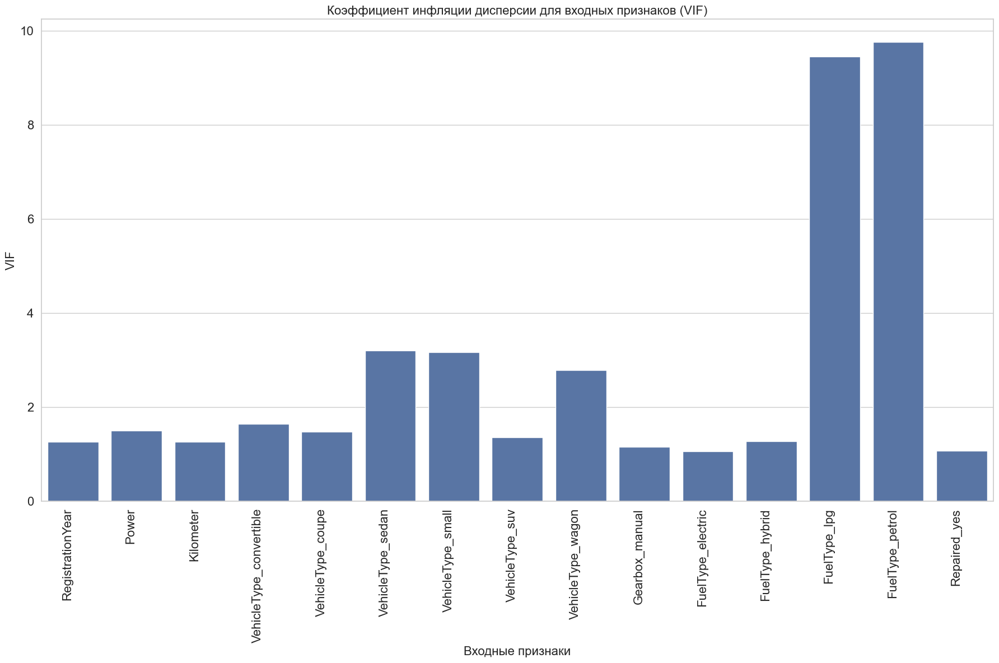

In [111]:
# используем созданную функцию расчета VIF
vif(autos_df_copy.drop(columns=['Price', 'brand_model', 'PostalRegion']), font_size=16)

Согласно результатам расчета VIF признак `FuelType` требует внимания. Логически рассуждая, также как и признак `VehicleType`, мы не можем исключить признак `FuelType`, так как он должен влиять на цену авто хотя бы потому, что разное топливо имеет разный расход и цену. 

**Промежуточные выводы по корреляционному анализу**
1. Создан новый признак `brand_model` на основе сильно коррелирующих друг с другом признаков `Brand` и `Model`, которые впоследствии удалены.
2. Признаки `VehicleType` и `FuelType`, которые имеют сильную мультиколлинеарность, оставлены, так как из-за логических соображений являются важными признаками.

## Модель LightGBM

In [112]:
# сохраняем датасет после предобработки
autos_preprocessing = autos_df_copy.copy()

Ранее установлен явный дисбаланс классов у признаков `Gearbox`, `Repaired`, `FuelType`, а также неравномерное распределение данных по признаку `Kilometer` и целевому `Price`. Для улучшения обобщающей способности модели требуется разделить выборки с учетом сохранения соотношений классов и распределений числовых признаков. Однако это невозможно осуществить на имеющихся данных, если делить с учетом всех вышеперечисленных признаков. Поэтому отобраны лишь наиболее важные из них исходя из логики: `Price`, `Repaired`, `Kilometer`.

In [113]:
# Сохраняем stratify_key до разбиения
autos_preprocessing['stratify_key'] = (
    autos_preprocessing['Repaired'].astype(str) + '_' +
    autos_preprocessing['Kilometer'].astype(str) + '_' +
    pd.qcut(autos_preprocessing['Price'], q=10, duplicates='drop').astype(str)
)

# Теперь делаем разбиение и передаём stratify из оригинального датафрейма
train_valid_idx, test_idx = train_test_split(
    autos_preprocessing.index,
    test_size=0.2,
    random_state=RANDOM_STATE,
    stratify=autos_preprocessing['stratify_key']
)

train_valid_df = autos_preprocessing.loc[train_valid_idx]
test = autos_preprocessing.loc[test_idx]

# То же самое для внутреннего разбиения
train_idx, valid_idx = train_test_split(
    train_valid_df.index,
    test_size=TEST_SIZE,
    random_state=RANDOM_STATE,
    stratify=autos_preprocessing.loc[train_valid_idx, 'stratify_key']
)

train = autos_preprocessing.loc[train_idx]
valid = autos_preprocessing.loc[valid_idx]

# Теперь можно безопасно удалить stratify_key
for df in [train, valid, test]:
    df.drop(columns=['stratify_key'], inplace=True)

# Делаем копии для использования в разных моделях
train_df = train.copy()
valid_df = valid.copy()
test_df = test.copy()

In [114]:
# Пользовательские метрики для оценки модели
def rmse(y_true, y_pred):
    """Вычисляет среднеквадратичную ошибку (RMSE)."""
    return np.sqrt(mean_squared_error(y_true, y_pred))


# Метрики для RandomizedSearchCV
# greater_is_better=False означает, что чем меньше значение метрики, тем лучше
scoring = {
    'rmse': make_scorer(rmse, greater_is_better=False),  # Наша кастомная метрика RMSE
    'mae': make_scorer(mean_absolute_error, greater_is_better=False),  # Средняя абсолютная ошибка
    'r2': 'r2'  # Коэффициент детерминации (чем ближе к 1, тем лучше)
}

In [115]:
# Определение категориальных признаков
categorical_features = [
    'VehicleType', 'Gearbox', 'brand_model',
    'FuelType', 'Repaired', 'PostalRegion'
]

# Создание пайплайна для категориальных признаков
cat_pipe = Pipeline([
    ('simpleImputer_before_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
    ('ord', OrdinalEncoder(
        handle_unknown='use_encoded_value',
        unknown_value=np.nan
    )
    ),
     ('simpleImputer_after_ord', SimpleImputer(missing_values=np.nan, strategy='most_frequent'))
])

# Общий preprocessor
preprocessor = ColumnTransformer(
    [
    ('ord', cat_pipe, categorical_features)
    ],
    remainder='passthrough'
                                )

# Подготовка данных
X_train = train_df.drop(columns=['Price'])
y_train = train_df['Price']
X_valid = valid_df.drop(columns=['Price'])
y_valid = valid_df['Price']
X_test = test_df.drop(columns=['Price'])
y_test = test_df['Price']

#----------------------------------------------------
# для экстрополяции времени выполнения обучения lgb
#X_train = X_train.sample(frac=0.1, random_state=RANDOM_STATE)
#y_train = y_train.loc[X_train.index]
#X_valid = X_valid.sample(frac=0.1, random_state=RANDOM_STATE)
#y_valid = y_valid.loc[X_valid.index]
#----------------------------------------------------

start_time = time.time()
# Применяем preprocessor
X_train_transformed = preprocessor.fit_transform(X_train)
X_valid_transformed = preprocessor.transform(X_valid)
#X_test_transformed = preprocessor.transform(X_test)

# Получаем имена признаков "после преобразования"
# Для категориальных признаков
cat_features_out = [f'ord__{feature}' for feature in categorical_features]
# Для остальных признаков
num_features = [col for col in X_train.columns if col not in categorical_features]
# Объединяем
feature_names = cat_features_out + num_features

# Указываем категориальные признаки для LightGBM
cat_indices = list(range(len(categorical_features)))  # т.к. они первые

# Настройка модели и кросс-валидации
params = {
    'objective': 'regression',
    'metric': 'rmse',
    'boosting_type': 'gbdt', # dart - для уменьшения переобучения, но он дольше и не дает результата
    'verbose': -1,
    'seed': RANDOM_STATE,
    'force_col_wise': True,
    # для регуляризации:
    'reg_alpha': 1.0,
    'reg_lambda': 0.1,
    'min_split_gain': 0.02,
    'subsample_freq': 1,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'min_child_samples': 20
}

param_grid = {
    # смещение диапазонов не принесло результата
    'num_leaves': [31, 65], #[65, 125, 150], #[31, 65, 125, 150, 175],
    'learning_rate': [0.1, 0.15] #[0.03, 0.07, 0.1] #[0.01, 0.03, 0.07],
    #'min_child_samples': [3, 5, 10, 20],
    #'min_split_gain': [0.01, 0.02, 0.05],
    #'reg_alpha': [0.01, 0.1, 1.0, 1.2],
    #'reg_lambda': [0, 0.01, 0.1, 1.0]
}

#KFold достаточен для LGBM, так как:
# - Модель адаптируется к распределению данных в процессе обучения.
# - Случайное перемешивание (shuffle=True) помогает избежать "неудачных" разбиений.

inner_cv = KFold(
    n_splits=2,
    shuffle=True,
    random_state=RANDOM_STATE
    )

lgbm = lgb.LGBMRegressor(**params)

random_search = RandomizedSearchCV(
    estimator=lgbm,
    param_distributions=param_grid,
    n_iter=2,#3,
    scoring=scoring,
    refit='rmse',
    cv=inner_cv,
    verbose=1,
    n_jobs=-1,
    random_state=RANDOM_STATE
)

In [116]:
# поиск лучших гиперпараметров
random_search.fit(X_train_transformed, y_train)

Fitting 2 folds for each of 2 candidates, totalling 4 fits


RandomizedSearchCV(cv=KFold(n_splits=2, random_state=42, shuffle=True),
                   estimator=LGBMRegressor(colsample_bytree=0.8,
                                           force_col_wise=True, metric='rmse',
                                           min_split_gain=0.02,
                                           objective='regression',
                                           reg_alpha=1.0, reg_lambda=0.1,
                                           seed=42, subsample=0.8,
                                           subsample_freq=1, verbose=-1),
                   n_iter=2, n_jobs=-1,
                   param_distributions={'learning_rate': [0.1, 0.15],
                                        'num_leaves': [31, 65]},
                   random_state=42, refit='rmse',
                   scoring={'mae': make_scorer(mean_absolute_error, greater_is_better=False, response_method='predict'),
                            'r2': 'r2',
                            'rmse': make_scorer(rmse, greater_is_better=False, response_method='predict')},
                   verbose=1)

In [117]:
# Извлекаем среднее время обучения одной модели (без подбора гиперпараметров и предсказаний)
# Берем среднее время по всем фолдам и всем итерациям
mean_fit_time = np.mean(random_search.cv_results_['mean_fit_time'])
    
print(f"Mean training time per model: {mean_fit_time:.2f} seconds")
best_params = random_search.best_params_
print(f"Best parameters: {best_params}")
print(f"Best CV score: {-random_search.best_score_:.4f}")

Mean training time per model: 1.30 seconds
Best parameters: {'num_leaves': 65, 'learning_rate': 0.15}
Best CV score: 1572.6450


In [118]:
# Обучение финальной модели
final_params = {**params, **best_params}

train_data = lgb.Dataset(
    X_train_transformed,
    label=y_train,
    feature_name=feature_names,  # явно передаем имена
    categorical_feature=cat_indices
)

valid_data = lgb.Dataset(
    X_valid_transformed,
    label=y_valid,
    feature_name=feature_names,  # явно передаем имена
    categorical_feature=cat_indices
)

start_time = time.time()
final_model_lgb = lgb.train(
    final_params,
    train_data,
    num_boost_round=500,  
    valid_sets=[train_data, valid_data],
    callbacks=[
        lgb.early_stopping(100),
        lgb.log_evaluation(50)
    ]
)
end_time = time.time()

# расчет времени обучения для lgb
training_time_lgb = end_time - start_time
training_time_lgb = training_time_lgb + mean_fit_time
print(f"Training time: {training_time_lgb:.2f} seconds")

Training until validation scores don't improve for 100 rounds
[50]	training's rmse: 1435.18	valid_1's rmse: 1540.54
[100]	training's rmse: 1360.1	valid_1's rmse: 1530.18
[150]	training's rmse: 1308.23	valid_1's rmse: 1526.28
[200]	training's rmse: 1265.97	valid_1's rmse: 1526.1
[250]	training's rmse: 1234.03	valid_1's rmse: 1524.5
[300]	training's rmse: 1205.28	valid_1's rmse: 1523.13
[350]	training's rmse: 1180.39	valid_1's rmse: 1523.67
[400]	training's rmse: 1156.94	valid_1's rmse: 1524.34
Early stopping, best iteration is:
[301]	training's rmse: 1204.82	valid_1's rmse: 1522.95
Training time: 3.10 seconds


In [119]:
print("\nИмена признаков в LightGBM:")
print(final_model_lgb.feature_name())

# Проверяем, что feature_names и final_model_lgb.feature_name() совпадают
assert feature_names == final_model_lgb.feature_name(), "Порядок признаков не совпадает!"
print("\n✅ Порядок признаков в feature_names и LightGBM совпадает!")


Имена признаков в LightGBM:
['ord__VehicleType', 'ord__Gearbox', 'ord__brand_model', 'ord__FuelType', 'ord__Repaired', 'ord__PostalRegion', 'RegistrationYear', 'Power', 'Kilometer']

✅ Порядок признаков в feature_names и LightGBM совпадает!


In [120]:
start_time = time.time()

# Оценка на валидационной выборке
valid_pred = final_model_lgb.predict(X_valid_transformed)

end_time = time.time()
# расчет времени предсказания для lgb
prediction_time_lgb = end_time - start_time
print(f"Prediction time: {prediction_time_lgb:.2f} seconds")

valid_rmse_lgb = np.sqrt(mean_squared_error(y_valid, valid_pred))
valid_mae_lgb = mean_absolute_error(y_valid, valid_pred)
valid_r2_lgb = r2_score(y_valid, valid_pred)

print("\nFinal Model Evaluation on Validation Set:")
print(f"Validation RMSE: {valid_rmse_lgb:.2f}")
print(f"Validation MAE: {valid_mae_lgb:.2f}")
print(f"Validation R2: {valid_r2_lgb:.4f}")

Prediction time: 0.14 seconds

Final Model Evaluation on Validation Set:
Validation RMSE: 1522.95
Validation MAE: 963.69
Validation R2: 0.8883


In [121]:
# Анализ ошибок на валидации
errors = valid_pred - y_valid
print("Error Analysis on Validation Set:")
print(f"Mean Error: {np.mean(errors):.2f}")
print(f"Median Error: {np.median(errors):.2f}")
print(f"Std of Errors: {np.std(errors):.2f}")

Error Analysis on Validation Set:
Mean Error: -8.45
Median Error: 65.12
Std of Errors: 1522.92


In [122]:
# Важность признаков
# Создаем DataFrame с именами признаков и их важностью
feature_importance_gain = pd.DataFrame({
    'Feature': feature_names,  # Используем сохраненные имена признаков
    'Gain': final_model_lgb.feature_importance(importance_type='gain'),
    'Split': final_model_lgb.feature_importance(importance_type='split')
}).sort_values('Gain', ascending=False)

print("\nTop 10 Features by Gain:")
feature_importance_gain.head(10)


Top 10 Features by Gain:


,Feature,Gain,Split
6,RegistrationYear,4.473176e+12,3577
7,Power,1.675628e+12,4572
2,ord__brand_model,1.615164e+12,3570
8,Kilometer,6.174300e+11,2057
5,ord__PostalRegion,1.679857e+11,3619
0,ord__VehicleType,1.219931e+11,761
4,ord__Repaired,9.998967e+10,540
1,ord__Gearbox,3.707767e+10,540
3,ord__FuelType,4.193410e+08,28


1. **Gain (Информационный выигрыш):**
Означает общий вклад признака в улучшение точности модели во всех деревьях. Чем выше Gain, тем важнее признак для предсказаний. Абсолютные значения Gain зависят от масштаба данных и метрики, поэтому важны относительные различия между признаками. На основе результатов: `RegistrationYear` — самый важный признак, а `FuelType` — наименее важный из Топ-10.

2. **Split (Количество разбиений):**
Означает сколько раз признак использовался для разбиения узлов во всех деревьях ансамбля. Высокое значение Split означает, что признак часто участвовал в построении деревьев. Результаты модели показали, что `Power` использовался для разбиения чаще всего, а `FuelType` — реже. Признак с высоким Split не всегда имеет высокий Gain (если разбиения мало улучшают качество).

Проанализируем остатки модели `LightGBM`

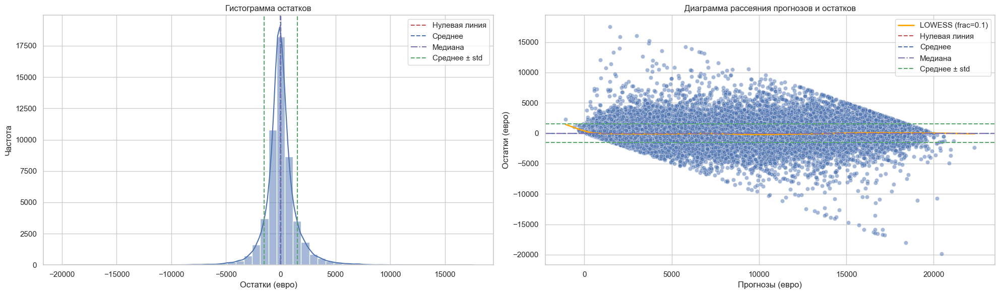

CPU times: total: 23.9 s
Wall time: 24 s


In [123]:
%%time
analyze_residuals(y_valid, valid_pred, bins=50, figsize=(20, 6), title=None, lowess=True, lowess_frac=0.1, units='евро')

Центр нормального распределения остатков близок к 0 при стандартном отклонении примерно 1510 евро. Что касается дисперсии остатков, то кривая `lowess` на всем промежутке значений целевой переменной лежит вдоль нуля остатков. Следовательно, модель `LightGBM` в целом хорошо замечает взаимосвязи между признаками и будет работать достаточно стабильно, с удовлетворяющим отклонением от истинного значения цены в одну или в другую сторону в зависимости от ее значения.

## Линейные модели: LinearRegression, Ridge, Lasso

С помощью `residplot` оценим линейность связи между признаками и целевой переменной. Для этого выберем числовые признаки `RegistrationYear`, `Power`, `Kilometer`.

In [124]:
train_df = train.copy()
valid_df = valid.copy()
test_df = test.copy()

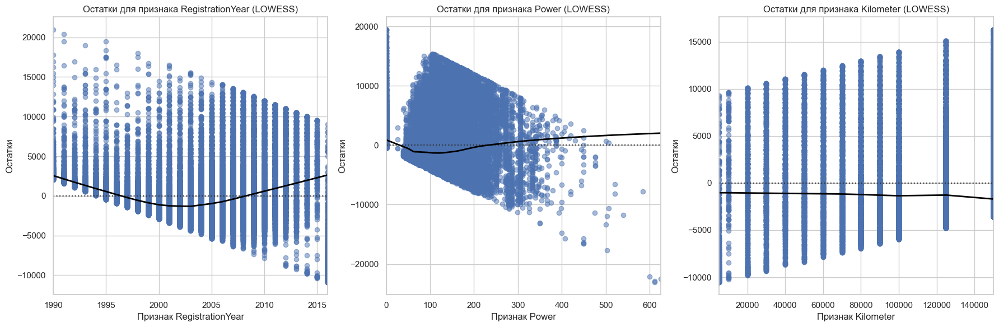

In [125]:
plot_residuals(valid_df, 'Price', ['RegistrationYear', 'Power', 'Kilometer'])

Кривая `lowess`, сильно отклоняющаяся от нуля, наглядно демонстрирует, что существуют нелинейные связи между входными признаками и целевой переменной.

In [126]:
# Списки признаков для разных типов обработки
binary_features = ['Gearbox', 'Repaired']  # Бинарные признаки (да/нет)
ohe_features = ['VehicleType', 'FuelType']  # Признаки для One-Hot Encoding
catboost_features = ['brand_model', 'PostalRegion']  # Признаки для CatBoostEncoder
numeric_features = ['Kilometer', 'Power', 'RegistrationYear']  # Числовые признаки

### LinearRegression

In [127]:
# Подготовка данных
train_df = train.copy()
valid_df = valid.copy()
test_df = test.copy()

X_train = train_df.drop(columns=['Price'])
y_train = train_df['Price']
X_valid = valid_df.drop(columns=['Price'])
y_valid = valid_df['Price']
X_test = test_df.drop(columns=['Price'])
y_test = test_df['Price']

In [128]:
randomized_search_linear, training_time_linear = main(
    X_train, y_train, scoring, model=LinearRegression(), n_splits=2, n_iter=10,
    param_grid={
        'regressor__fit_intercept': [True, False],
        'regressor__positive': [True, False],
        'feature_union__preprocessor__numeric__scaler': [StandardScaler(), MinMaxScaler(), None],
        'feature_union__catboost_pipe__catboost__sigma': [None, 0.1, 0.5],
        'feature_union__catboost_pipe__catboost__a': [1.0, 0.5, 2.0]
    }
)

Mean training time per model: 0.64 seconds
Best parameters: {'regressor__positive': False, 'regressor__fit_intercept': True, 'feature_union__preprocessor__numeric__scaler': None, 'feature_union__catboost_pipe__catboost__sigma': None, 'feature_union__catboost_pipe__catboost__a': 0.5}
Best RMSE (CV): 2598.8931198864475


In [129]:
# После обучения модели
feature_union = randomized_search_linear.best_estimator_.named_steps['feature_union']
feature_counts = feature_union.get_feature_counts()

# Вывод информации о количестве признаков
print("Feature counts:")
for key, value in feature_counts.items():
    print(f"{key}: {value}")

Feature counts:
OneHot features: 12
Numeric features: 3
CatBoost features: 2
Total features: 17


In [130]:
# Оценка лучшей модели на валидационной выборке
best_model_linear = randomized_search_linear.best_estimator_

start_time = time.time()
valid_pred = best_model_linear.predict(X_valid)
end_time = time.time()
# расчет времени предсказания для LinearRegression
prediction_time_linear = end_time - start_time
print(f"Prediction time: {prediction_time_linear:.2f} seconds")

valid_rmse_linear = np.sqrt(mean_squared_error(y_valid, valid_pred))
valid_mae_linear = mean_absolute_error(y_valid, valid_pred)
valid_r2_linear = r2_score(y_valid, valid_pred)

print("\nFinal Model Evaluation on Validation Set:")
print(f"Validation RMSE: {valid_rmse_linear:.2f}")
print(f"Validation MAE: {valid_mae_linear:.2f}")
print(f"Validation R2: {valid_r2_linear:.4f}")

Prediction time: 0.12 seconds

Final Model Evaluation on Validation Set:
Validation RMSE: 2601.58
Validation MAE: 1881.29
Validation R2: 0.6742


In [131]:
# Анализ ошибок на валидации
errors = valid_pred - y_valid
print("Error Analysis on Validation Set:")
print(f"Mean Error: {np.mean(errors):.2f}")
print(f"Median Error: {np.median(errors):.2f}")
print(f"Std of Errors: {np.std(errors):.2f}")

Error Analysis on Validation Set:
Mean Error: -6.14
Median Error: 230.76
Std of Errors: 2601.57


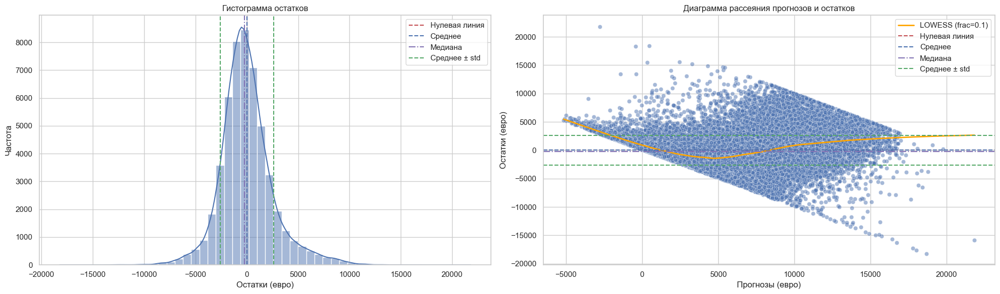

CPU times: total: 23.4 s
Wall time: 23.9 s


In [132]:
%%time
analyze_residuals(y_valid, valid_pred, bins=50, figsize=(20, 6), title=None, lowess=True, lowess_frac=0.1, units='евро')

Центр нормального распределения остатков близок к 0 при стандартном отклонении примерно 2560 евро. Что касается дисперсии остатков, то кривая `lowess` как и ожидалось сильно отклоняется от нуля. Следовательно, модель `LinearRegression` не замечает некоторые взаимосвязи между признаками и будет иметь результат с неудовлетворяющим отклонением от истинного значения цены в одну или в другую сторону в зависимости от ее значения.

Исследуем важность признаком для модели `LinearRegression`

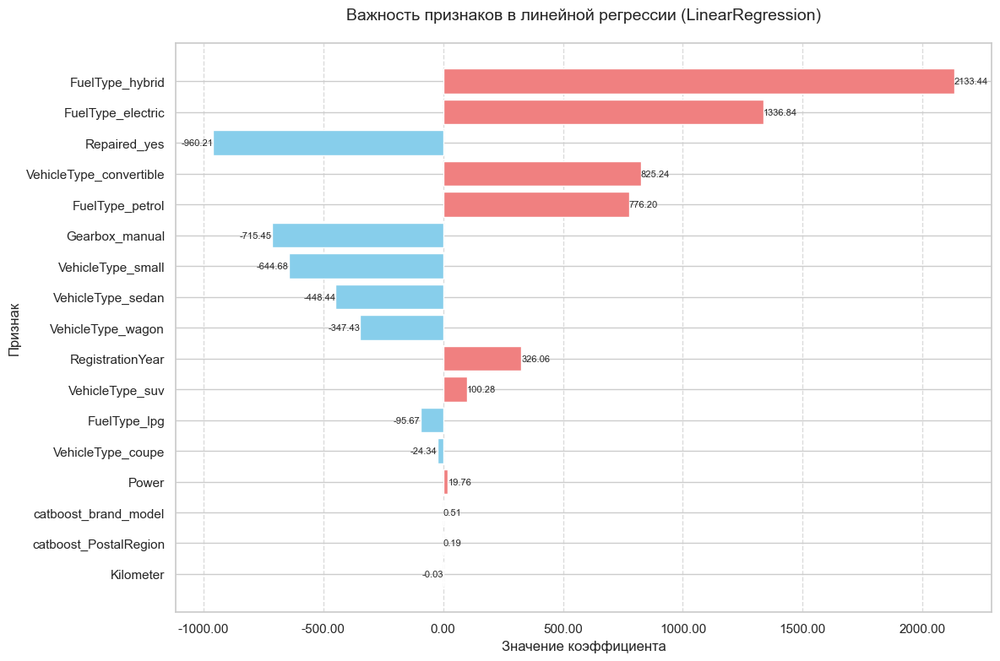

In [133]:
plot_feature_importance(randomized_search_linear, 'LinearRegression', catboost_features)

Коэффициенты линейной регрессии сильно отличаются, что для предсказательной способности линейной модели является отрицательным фактором. Такие разные значения коэффициентов, вероятно, обусловлены наличием высокой мультиколлинеарности для признаков `VehicleType` и `FuelType`. Данная линейная модель будет работать нестабильно. Один из вариантов улучшить ситуацию — попробовать добавить регуляризацию, например, обучить модели `Ridge` и `Lasso`.

### Ridge

In [134]:
# Подготовка данных
train_df = train.copy()
valid_df = valid.copy()
test_df = test.copy()

X_train = train_df.drop(columns=['Price'])
y_train = train_df['Price']
X_valid = valid_df.drop(columns=['Price'])
y_valid = valid_df['Price']
X_test = test_df.drop(columns=['Price'])
y_test = test_df['Price']

In [135]:
randomized_search_Ridge, training_time_Ridge = main(
    X_train, y_train, scoring, model=Ridge(), n_splits=2, n_iter=10,
    param_grid = {
        'regressor__alpha': [0.001, 0.01, 0.1, 1, 10],
        'regressor__fit_intercept': [True, False],
        'feature_union__preprocessor__numeric__scaler':
        [StandardScaler(), MinMaxScaler(), None],
        'feature_union__catboost_pipe__catboost__sigma': [None, 0.1, 0.5],
        'feature_union__catboost_pipe__catboost__a': [1.0, 0.5, 2.0]
    }
)

Mean training time per model: 0.46 seconds
Best parameters: {'regressor__fit_intercept': True, 'regressor__alpha': 1, 'feature_union__preprocessor__numeric__scaler': None, 'feature_union__catboost_pipe__catboost__sigma': None, 'feature_union__catboost_pipe__catboost__a': 0.5}
Best RMSE (CV): 2598.886236782777


In [136]:
# После обучения модели
feature_union = randomized_search_Ridge.best_estimator_.named_steps['feature_union']
feature_counts = feature_union.get_feature_counts()

# Вывод информации о количестве признаков
print("Feature counts:")
for key, value in feature_counts.items():
    print(f"{key}: {value}")

Feature counts:
OneHot features: 12
Numeric features: 3
CatBoost features: 2
Total features: 17


In [137]:
# Оценка лучшей модели на валидационной выборке
best_model_Ridge = randomized_search_Ridge.best_estimator_

start_time = time.time()
valid_pred = best_model_Ridge.predict(X_valid)
end_time = time.time()
# расчет времени предсказания для Ridge
prediction_time_Ridge = end_time - start_time
print(f"Prediction time: {prediction_time_Ridge:.2f} seconds")

valid_rmse_Ridge = np.sqrt(mean_squared_error(y_valid, valid_pred))
valid_mae_Ridge = mean_absolute_error(y_valid, valid_pred)
valid_r2_Ridge = r2_score(y_valid, valid_pred)

print("\nFinal Model Evaluation on Validation Set:")
print(f"Validation RMSE: {valid_rmse_Ridge:.2f}")
print(f"Validation MAE: {valid_mae_Ridge:.2f}")
print(f"Validation R2: {valid_r2_Ridge:.4f}")

Prediction time: 0.09 seconds

Final Model Evaluation on Validation Set:
Validation RMSE: 2601.57
Validation MAE: 1881.29
Validation R2: 0.6742


In [138]:
# Анализ ошибок на валидации
errors = valid_pred - y_valid
print("Error Analysis on Validation Set:")
print(f"Mean Error: {np.mean(errors):.2f}")
print(f"Median Error: {np.median(errors):.2f}")
print(f"Std of Errors: {np.std(errors):.2f}")

Error Analysis on Validation Set:
Mean Error: -6.14
Median Error: 230.70
Std of Errors: 2601.57


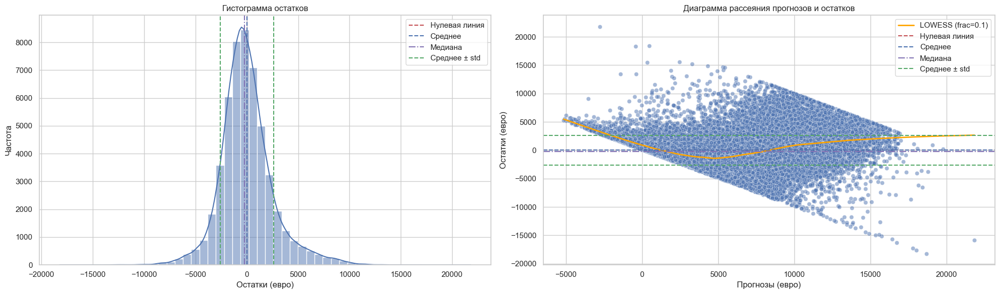

CPU times: total: 23 s
Wall time: 23.6 s


In [139]:
%%time
analyze_residuals(y_valid, valid_pred, bins=50, figsize=(20, 6), title=None, lowess=True, lowess_frac=0.1, units='евро')

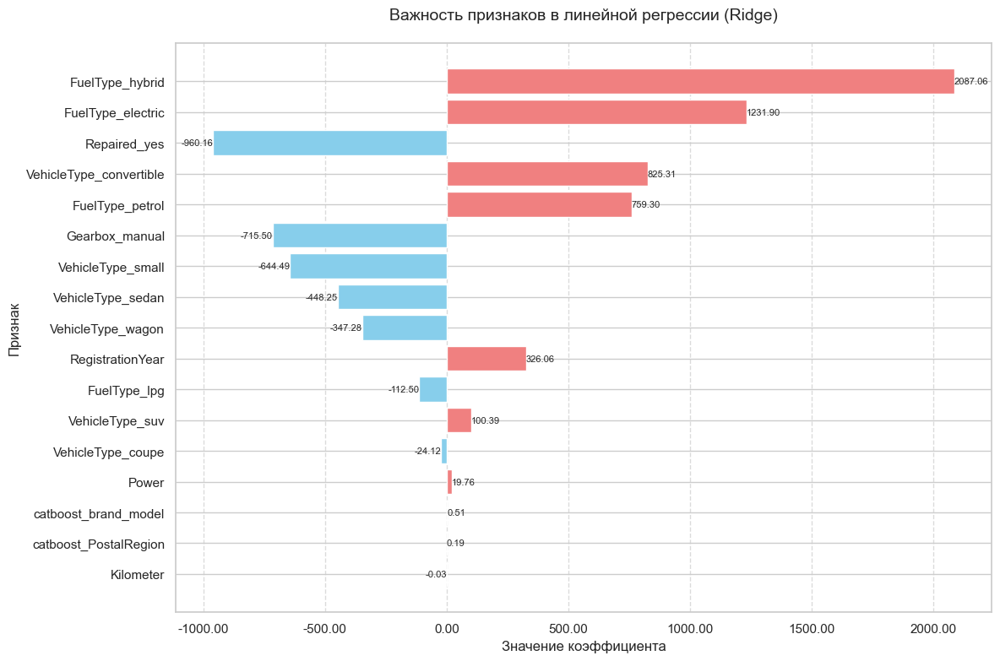

In [140]:
plot_feature_importance(randomized_search_Ridge, 'Ridge', catboost_features)

При использовании модели `Ridge` ситуация не сильно поменялась по сравнению с использованием модели `LinearRegression`: все также есть незамеченные взаимосвязи между входными признаками и целевой переменной и сильно отличающиеся друг от друга коэффициенты линейной регрессии (по сравнению с моделью `LinearRegression` они уменьшились по модулю незначительно).

### Lasso

In [141]:
# Подготовка данных
train_df = train.copy()
valid_df = valid.copy()
test_df = test.copy()

X_train = train_df.drop(columns=['Price'])
y_train = train_df['Price']
X_valid = valid_df.drop(columns=['Price'])
y_valid = valid_df['Price']
X_test = test_df.drop(columns=['Price'])
y_test = test_df['Price']

In [142]:
randomized_search_Lasso, training_time_Lasso = main(
    X_train, y_train, scoring, model=Lasso(), n_splits=2, n_iter=10,
    param_grid = {
        'regressor__alpha': [0.001, 0.01, 0.1],
        'regressor__fit_intercept': [True],
        'regressor__selection': ['cyclic'],
        'regressor__max_iter': [1000, 2000],
        'regressor__tol': [1e-4],  # Стандартное значение
        'feature_union__preprocessor__numeric__scaler': [StandardScaler(), None],  # MinMax обычно хуже для Lasso
        'feature_union__catboost_pipe__catboost__sigma': [None, 0.1],
        'feature_union__catboost_pipe__catboost__a': [1.0]  # Стандартное значение
    }
)

Mean training time per model: 0.81 seconds
Best parameters: {'regressor__tol': 0.0001, 'regressor__selection': 'cyclic', 'regressor__max_iter': 2000, 'regressor__fit_intercept': True, 'regressor__alpha': 0.1, 'feature_union__preprocessor__numeric__scaler': None, 'feature_union__catboost_pipe__catboost__sigma': None, 'feature_union__catboost_pipe__catboost__a': 1.0}
Best RMSE (CV): 2599.019904198398


In [143]:
# После обучения модели
feature_union = randomized_search_Lasso.best_estimator_.named_steps['feature_union']
feature_counts = feature_union.get_feature_counts()

# Вывод информации о количестве признаков
print("Feature counts:")
for key, value in feature_counts.items():
    print(f"{key}: {value}")

Feature counts:
OneHot features: 12
Numeric features: 3
CatBoost features: 2
Total features: 17


In [144]:
# Оценка лучшей модели на валидационной выборке
best_model_Lasso = randomized_search_Lasso.best_estimator_

start_time = time.time()
valid_pred = best_model_Lasso.predict(X_valid)
end_time = time.time()
# расчет времени предсказания для Lasso
prediction_time_Lasso = end_time - start_time
print(f"Prediction time: {prediction_time_Ridge:.2f} seconds")

valid_rmse_Lasso = np.sqrt(mean_squared_error(y_valid, valid_pred))
valid_mae_Lasso = mean_absolute_error(y_valid, valid_pred)
valid_r2_Lasso = r2_score(y_valid, valid_pred)

print("\nFinal Model Evaluation on Validation Set:")
print(f"Validation RMSE: {valid_rmse_Lasso:.2f}")
print(f"Validation MAE: {valid_mae_Lasso:.2f}")
print(f"Validation R2: {valid_r2_Lasso:.4f}")

Prediction time: 0.09 seconds

Final Model Evaluation on Validation Set:
Validation RMSE: 2601.62
Validation MAE: 1881.41
Validation R2: 0.6742


In [145]:
# Анализ ошибок на валидации
errors = valid_pred - y_valid
print("Error Analysis on Validation Set:")
print(f"Mean Error: {np.mean(errors):.2f}")
print(f"Median Error: {np.median(errors):.2f}")
print(f"Std of Errors: {np.std(errors):.2f}")

Error Analysis on Validation Set:
Mean Error: -6.09
Median Error: 231.66
Std of Errors: 2601.61


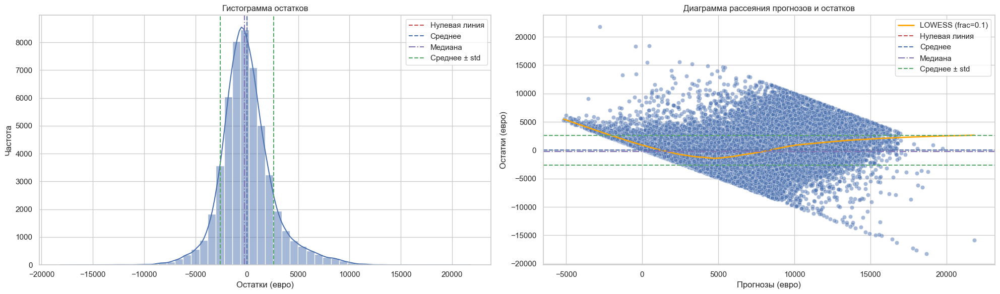

CPU times: total: 23.6 s
Wall time: 24.7 s


In [146]:
%%time
analyze_residuals(y_valid, valid_pred, bins=50, figsize=(20, 6), title=None, lowess=True, lowess_frac=0.1, units='евро')

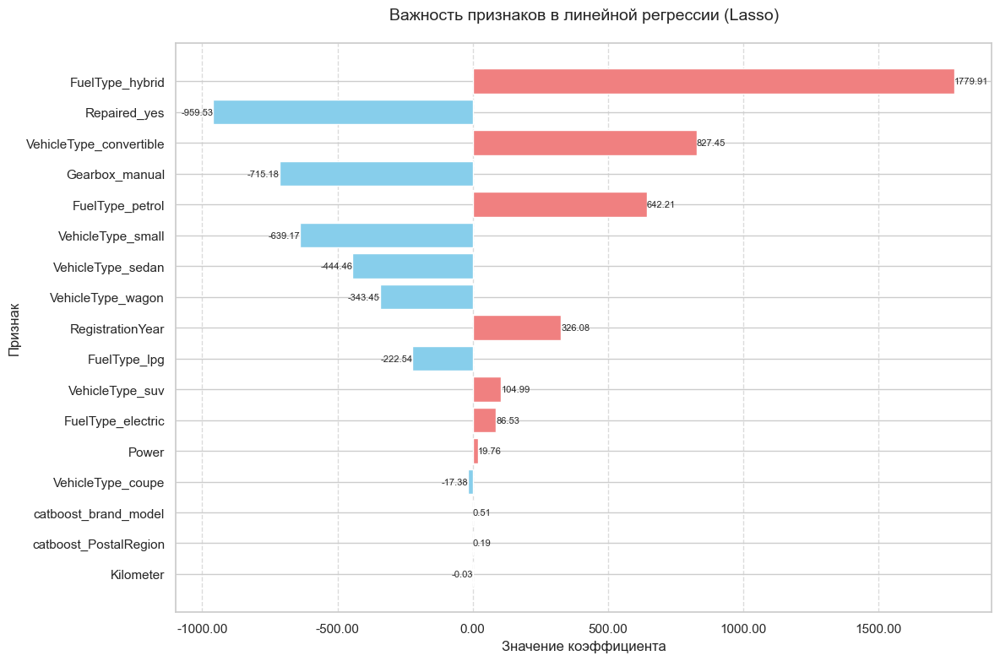

In [147]:
plot_feature_importance(randomized_search_Lasso, 'Lasso', catboost_features)

При использовании модели `Lasso` ситуация не сильно поменялась по сравнению с использованием моделей `LinearRegression` и `Ridge`: все также есть незамеченные взаимосвязи между входными признаками и целевой переменной и сильно отличающиеся друг от друга коэффициенты линейной регрессии.

Без явного задания преобразований (например, полиномиальных признаков) для выявления сложных нелинейных взаимосвязей можно попробовать модель `DecisionTreeRegressor`.

## Модель DecisionTreeRegressor

In [148]:
# Подготовка данных
train_df = train.copy()
valid_df = valid.copy()
test_df = test.copy()

X_train = train_df.drop(columns=['Price'])
y_train = train_df['Price']
X_valid = valid_df.drop(columns=['Price'])
y_valid = valid_df['Price']
X_test = test_df.drop(columns=['Price'])
y_test = test_df['Price']

In [149]:
randomized_search_dtr, training_time_dtr = main(
    X_train, y_train, scoring, n_splits=3, n_iter=10,
    model=DecisionTreeRegressor(random_state=RANDOM_STATE),
    param_grid = {
        'regressor__max_depth': [None, 5, 10, 20, 30, 50],
        'regressor__min_samples_split': [2, 5, 10, 20],
        'regressor__min_samples_leaf': [8, 10, 15, 20, 30, 50],
        'regressor__max_features': ['sqrt', 'log2', None],
        'feature_union__preprocessor__numeric__scaler':
        [StandardScaler(), MinMaxScaler(), None],
        'feature_union__catboost_pipe__catboost__sigma': [None, 0.1, 0.5],
        'feature_union__catboost_pipe__catboost__a': [1.0, 0.5, 2.0]
    }
)

Mean training time per model: 1.04 seconds
Best parameters: {'regressor__min_samples_split': 2, 'regressor__min_samples_leaf': 10, 'regressor__max_features': None, 'regressor__max_depth': None, 'feature_union__preprocessor__numeric__scaler': None, 'feature_union__catboost_pipe__catboost__sigma': 0.5, 'feature_union__catboost_pipe__catboost__a': 2.0}
Best RMSE (CV): 1771.0389602839807


In [150]:
# После обучения модели
feature_union = randomized_search_dtr.best_estimator_.named_steps['feature_union']
feature_counts = feature_union.get_feature_counts()

# Вывод информации о количестве признаков
print("Feature counts:")
for key, value in feature_counts.items():
    print(f"{key}: {value}")

Feature counts:
OneHot features: 12
Numeric features: 3
CatBoost features: 2
Total features: 17


In [151]:
# Оценка лучшей модели на валидационной выборке
best_model_dtr = randomized_search_dtr.best_estimator_

start_time = time.time()
valid_pred = best_model_dtr.predict(X_valid)
end_time = time.time()
prediction_time_dtr = end_time - start_time
print(f"Prediction time: {prediction_time_dtr:.2f} seconds")

valid_rmse_dtr = np.sqrt(mean_squared_error(y_valid, valid_pred))
valid_mae_dtr = mean_absolute_error(y_valid, valid_pred)
valid_r2_dtr = r2_score(y_valid, valid_pred)

print("\nFinal Model Evaluation on Validation Set:")
print(f"Validation RMSE: {valid_rmse_dtr:.2f}")
print(f"Validation MAE: {valid_mae_dtr:.2f}")
print(f"Validation R2: {valid_r2_dtr:.4f}")

Prediction time: 0.13 seconds

Final Model Evaluation on Validation Set:
Validation RMSE: 1726.11
Validation MAE: 1088.14
Validation R2: 0.8566


In [152]:
# Анализ ошибок на валидации
errors = valid_pred - y_valid
print("Error Analysis on Validation Set:")
print(f"Mean Error: {np.mean(errors):.2f}")
print(f"Median Error: {np.median(errors):.2f}")
print(f"Std of Errors: {np.std(errors):.2f}")

Error Analysis on Validation Set:
Mean Error: -12.23
Median Error: 55.82
Std of Errors: 1726.06


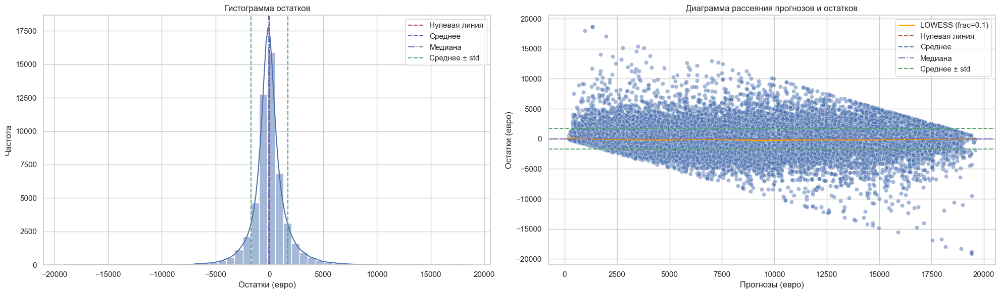

CPU times: total: 6.81 s
Wall time: 7.02 s


In [153]:
%%time
analyze_residuals(y_valid, valid_pred, bins=50, figsize=(20, 6), title=None, lowess=True, lowess_frac=0.1, units='евро')

Центр нормального распределения остатков близок к 0 при стандартном отклонении примерно 1730 евро. Что касается дисперсии остатков, то кривая `lowess` на всем промежутке значений целевой переменной лежит вдоль нуля остатков. Следовательно, модель `DecisionTreeRegressor` в целом хорошо замечает взаимосвязи между признаками и будет работать достаточно стабильно, с удовлетворяющим отклонением от истинного значения цены в одну или в другую сторону в зависимости от ее значения.

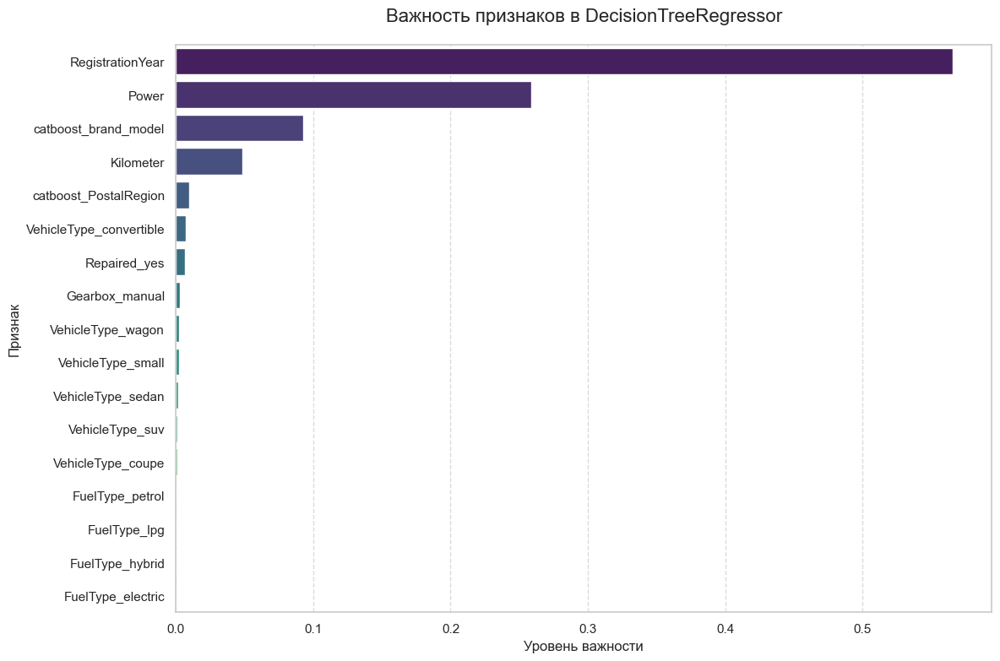

In [154]:
# 1. Извлекаем важности признаков
feature_importances = best_model_dtr.named_steps['regressor'].feature_importances_

# 2. Получаем имена признаков
# 2.1. Из preprocessor (OHE + числовые признаки)
preprocessor = randomized_search_dtr.best_estimator_.named_steps['feature_union'].preprocessor

# Для sklearn 0.24.1 используем get_feature_names_out() для OneHotEncoder
ohe_transformer = preprocessor.named_transformers_['ohe'].named_steps['ohe']
ohe_feature_names = ohe_transformer.get_feature_names_out(input_features=binary_features + ohe_features)

# Числовые признаки
numeric_feature_names = numeric_features

# Объединяем имена из OHE и числовых признаков
preprocessor_feature_names = list(ohe_feature_names) + numeric_feature_names

# 2.2. Из CatBoostEncoder (добавляем префикс)
catboost_features = ['brand_model', 'PostalRegion']
catboost_feature_names = [f'catboost_{feature}' for feature in catboost_features]

# 2.3. Объединяем все имена
feature_names = preprocessor_feature_names + catboost_feature_names

# Проверяем соответствие количества признаков
if len(feature_names) != len(feature_importances):
    print(f"\nWarning: Несоответствие количества признаков!")
    print(f"Количество имен признаков: {len(feature_names)}")
    print(f"Количество важностей: {len(feature_importances)}\n")
    
    # Определяем, какой список длиннее
    if len(feature_names) > len(feature_importances):
        print("Лишние имена признаков (которым нет важностей):")
        extra_features = feature_names[len(feature_importances):]
        for i, feat in enumerate(extra_features, 1):
            print(f"{i}. {feat}")
    else:
        print("Лишние важности (которым нет имен признаков):")
        extra_importances = feature_importances[len(feature_names):]
        print(f"Количество лишних важностей: {len(extra_importances)}")
        print(f"Суммарная важность лишних признаков: {sum(extra_importances):.4f}")
    
    # Обрезаем до минимальной длины
    min_length = min(len(feature_names), len(feature_importances))
    feature_names = feature_names[:min_length]
    feature_importances = feature_importances[:min_length]
    print(f"\nИспользуется только первые {min_length} признаков.\n")

# 3. Создаем DataFrame с важностями
df_importances = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
}).sort_values('Importance', ascending=False)

# 4. Визуализация с Seaborn
plt.figure(figsize=(12, 8))

# вызов barplot
sns.barplot(
    data=df_importances,
    x='Importance',
    y='Feature',
    palette='viridis'
)

plt.title('Важность признаков в DecisionTreeRegressor', fontsize=16, pad=20)
plt.xlabel('Уровень важности', fontsize=12)
plt.ylabel('Признак', fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

В рейтинг топ-4 по важности признаков по модели `DecisionTreeRegressor` входят `RegistrationYear`, `Power`, `brand_model`, `Kilometer`, что представляется очень даже логичным и полностью соответсвует топ-4 по важности признаков по модели `LightGBM`.

## Анализ моделей

Сведем все юнформацию о моделях в одну таблицу

In [155]:
# Создаем словарь с данными
data = {
    'Model': ['LightGBM', 'Linear Regression', 'Ridge', 'Lasso', 'Decision Tree'],
    'Training Time, sec': [training_time_lgb, training_time_linear, training_time_Ridge, training_time_Lasso, training_time_dtr],
    'Prediction Time, sec': [prediction_time_lgb, prediction_time_linear, prediction_time_Ridge, prediction_time_Lasso, prediction_time_dtr],
    'Validation RMSE, EUR': [valid_rmse_lgb, valid_rmse_linear, valid_rmse_Ridge, valid_rmse_Lasso, valid_rmse_dtr],
    'Validation MAE, EUR': [valid_mae_lgb, valid_mae_linear, valid_mae_Ridge, valid_mae_Lasso, valid_mae_dtr],
    'Validation R2': [valid_r2_lgb, valid_r2_linear, valid_r2_Ridge, valid_r2_Lasso, valid_r2_dtr]
}

# Создаем датафрейм
df_metrics = pd.DataFrame(data)

# Устанавливаем Model в качестве индекса
#df_metrics.set_index('Model', inplace=True)

# Выводим результат
df_metrics

,Model,"Training Time, sec","Prediction Time, sec","Validation RMSE, EUR","Validation MAE, EUR",Validation R2
0,LightGBM,3.101728,0.141526,1522.948102,963.687523,0.888344
1,Linear Regression,0.644706,0.117196,2601.581638,1881.290081,0.674172
2,Ridge,0.456633,0.087917,2601.574316,1881.285153,0.674174
3,Lasso,0.813417,0.094717,2601.621958,1881.407126,0.674162
4,Decision Tree,1.044299,0.130556,1726.105496,1088.139159,0.856567


Сформулируем рейтинг, по которому отберем лучшую модель

In [156]:
# Нормализованные оценки (чем меньше, тем лучше)
df_metrics['Norm. RMSE'] = df_metrics['Validation RMSE, EUR'] / df_metrics['Validation RMSE, EUR'].max()
df_metrics['Norm. MAE'] = df_metrics['Validation MAE, EUR'] / df_metrics['Validation MAE, EUR'].max()
df_metrics['Norm. Time'] = ((df_metrics['Training Time, sec'] + df_metrics['Prediction Time, sec'])
                            / (df_metrics['Training Time, sec'] + df_metrics['Prediction Time, sec']).max())
df_metrics['Norm. 1-R2'] = (1-df_metrics['Validation R2']) / (1-df_metrics['Validation R2']).max()

# Композитный рейтинг
#df_metrics['Composite Score'] = 0.5*df_metrics['Norm. RMSE'] + 0.3*df_metrics['Norm. MAE'] + 0.2*df_metrics['Norm. Time'] + df_metrics['Norm. 1-R2']
# добавив коэффициенты можно распределить важность критериев
df_metrics['Composite Score'] = df_metrics['Norm. RMSE'] + df_metrics['Norm. MAE'] + df_metrics['Norm. Time'] + df_metrics['Norm. 1-R2']
df_metrics['Composite Score'] = df_metrics['Composite Score']/df_metrics['Composite Score'].max()

# Сортируем по Composite Score (лучшие модели выше)
df_metrics = df_metrics.sort_values(by='Composite Score').reset_index(drop=True)

In [157]:
df_metrics.drop(columns=['Norm. RMSE', 'Norm. MAE', 'Norm. Time', 'Norm. 1-R2'])

,Model,"Training Time, sec","Prediction Time, sec","Validation RMSE, EUR","Validation MAE, EUR",Validation R2,Composite Score
0,Decision Tree,1.044299,0.130556,1726.105496,1088.139159,0.856567,0.623255
1,LightGBM,3.101728,0.141526,1522.948102,963.687523,0.888344,0.743985
2,Ridge,0.456633,0.087917,2601.574316,1881.285153,0.674174,0.965785
3,Linear Regression,0.644706,0.117196,2601.581638,1881.290081,0.674172,0.986220
4,Lasso,0.813417,0.094717,2601.621958,1881.407126,0.674162,1.000000


Визуализируем расчеты

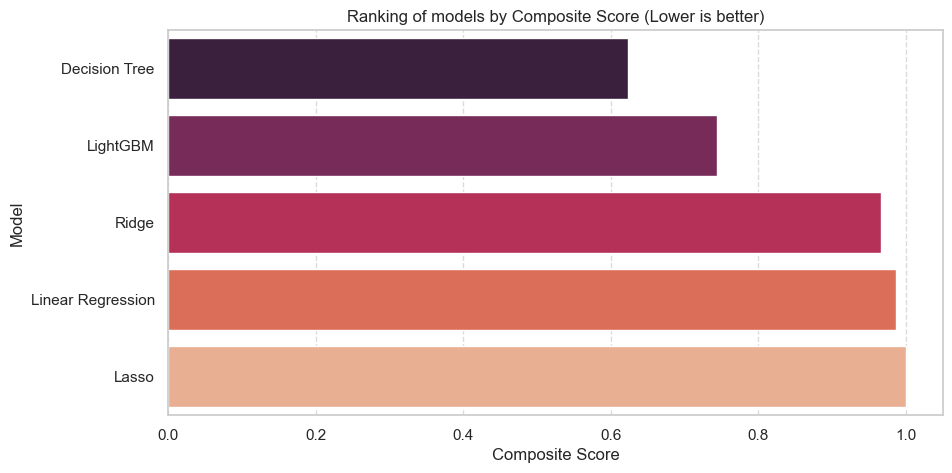

In [158]:
plt.figure(figsize=(10, 5))
df_sorted = df_metrics.sort_values('Composite Score', ascending=True)
sns.barplot(data=df_sorted, y='Model', x='Composite Score', palette='rocket')
plt.title('Ranking of models by Composite Score (Lower is better)')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

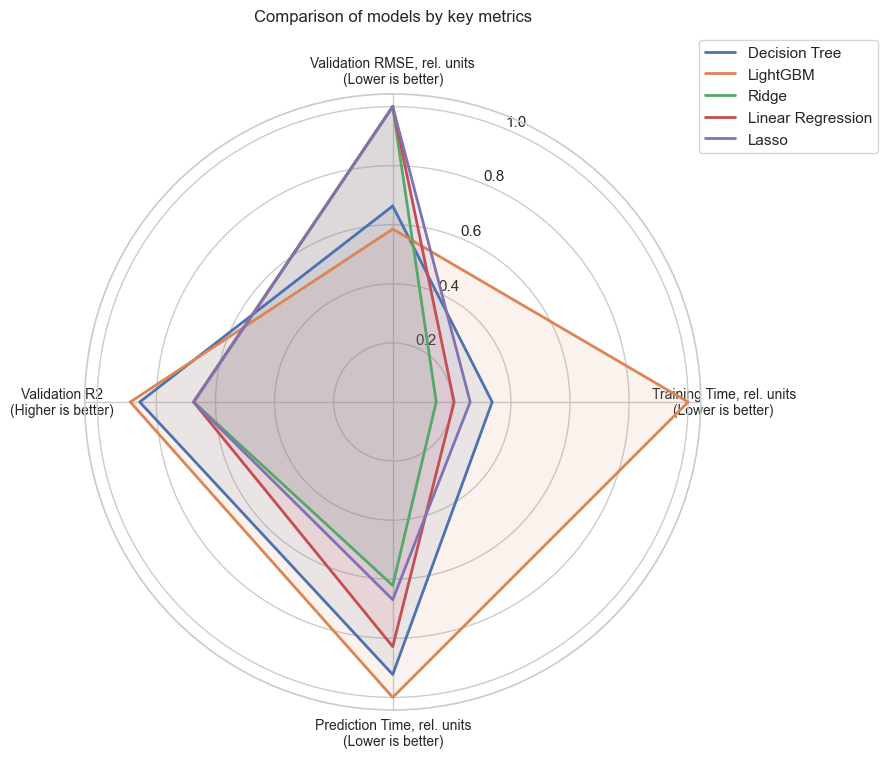

In [159]:
# Подготовка данных
categories = ['Validation RMSE, EUR', 'Training Time, sec', 'Prediction Time, sec', 'Validation R2']
df_radar = df_metrics[['Model'] + categories].copy()

df_radar = df_radar.rename(columns={
    'Validation RMSE, EUR': 'Validation RMSE',
    'Training Time, sec': 'Training Time',
    'Prediction Time, sec': 'Prediction Time'
})

# Обновляем список categories с новыми названиями
categories = ['Validation RMSE, rel. units', 'Training Time, rel. units', 'Prediction Time, rel. units', 'Validation R2']

# Нормализуем метрики (кроме R2)
df_radar[['Validation RMSE, rel. units', 'Training Time, rel. units', 'Prediction Time, rel. units']] = \
    df_radar[['Validation RMSE', 'Training Time', 'Prediction Time']].apply(lambda x: x/x.max())

# Углы для осей
angles = np.linspace(0, 2*np.pi, len(categories), endpoint=False).tolist()
angles += angles[:1]

# Построение
fig, ax = plt.subplots(figsize=(8, 8), subplot_kw={'projection': 'polar'})

# Рисуем графики
for idx, row in df_radar.iterrows():
    values = row[categories].values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, label=row['Model'], linewidth=2)
    ax.fill(angles, values, alpha=0.1)

# Настройка осей
ax.set_theta_offset(pi/2)
ax.set_theta_direction(-1)
ax.set_xticks(angles[:-1])

# Подписи с пояснением для R2
labels = [f"{cat}\n(Lower is better)" if cat != "Validation R2" else f"{cat}\n(Higher is better)"
          for cat in categories]
ax.set_xticklabels(labels, fontsize=10)

plt.title('Comparison of models by key metrics', pad=25)
plt.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1))
plt.grid(True)
plt.show()

Диаграммы наглядно демонстрируют, что для решения поставленной задачи (оптимальное соотношение между качеством предсказания, временем обучения модели, временем предсказания модели) лучше всего справляется модель `DecisionTreeRegressor`, причем с сильным перевесом. Однако нужно оговориться, что лучшие метрики получены на модели `LightGBM`. При этом линейные модели не справляются с решением данной задачи, так как одним из требований `RMSE`<2500 евро.

Проведем финальную оценку модели `DecisionTreeRegressor` на тестовой выборке.

In [160]:
# Финальная оценка лучшей модели на тестовой выборке
best_model_dtr = randomized_search_dtr.best_estimator_

start_time = time.time()
test_pred = best_model_dtr.predict(X_test)
end_time = time.time()
prediction_time_dtr = end_time - start_time
print(f"Prediction time: {prediction_time_dtr:.2f} seconds")

test_rmse_dtr = np.sqrt(mean_squared_error(y_test, test_pred))
test_mae_dtr = mean_absolute_error(y_test, test_pred)
test_r2_dtr = r2_score(y_test, test_pred)

print("\nFinal Model Evaluation on Test Set:")
print(f"RMSE: {test_rmse_dtr:.2f}")
print(f"MAE: {test_mae_dtr:.2f}")
print(f"R2: {test_r2_dtr:.4f}")

Prediction time: 0.13 seconds

Final Model Evaluation on Test Set:
RMSE: 1728.42
MAE: 1095.00
R2: 0.8559


Результаты близки к результатам по валидационной выборке, что указывает на стабильную работу модели `DecisionTreeRegressor`.

## Итоговые выводы

1.	В исходных данных обработаны пропуски, аномальные значения, явные и неявные дубликаты, удалены неинформативные признаки, на основе имеющихся сформированы новые признаки.
2.	Объем датасета после предобработки уменьшился на 25%
3.	Исследовательский анализ показал различия по признакам  для большинства распределений, что однозначно благоприятным образом сказывается на предсказательной способности модели.
4.	Корреляционный анализ показал признаки (`VehicleType` и `FuelType`), которые имеют высокую мультиколлинеарность, однако из-за логических соображений являются важными признаками и оставлены.
5.	Между входными признаками и целевой переменной существуют нелинейные взаимосвязи, в результате чего линейные модели не справляются с решением задачи.
6.	Лучшие метрики из исследованных моделей дает `LightGBM`, однако для решения поставленной задачи (оптимальное соотношение между качеством предсказания, временем обучения модели, временем предсказания модели) лучше всего справляется модель `DecisionTreeRegressor`, причем с сильным перевесом.
7. В рейтинг топ-4 по важности признаков входят `RegistrationYear`, `Power`, `brand_model`, `Kilometer`.